<a href="https://colab.research.google.com/github/Terry-Migwi/Stock-Market-Prediction/blob/main/Copy_of_Stock_Market_Prediction_EDA_and_Modelling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Defining the Question

## Specifying the Data Analytic Question

The objective of this project is to identify the trend of top three companies at the end of 2019 that is International Business Machines (IBM), Moet Henessy Louis Vuitton (LVMH), and Merck and Co Inc and predict their prices in the stock market 


## Defining the Metrics for success

This study will be considered successful if:

*   We can advice on the best stock based on Analysis of the three stocks
*   We will employ appropriate timeseries models and evaluate how the different models performed on the different stocks
* We will make 30 day forecast of the stocks using the model that performed the best



## Understanding the Context

**What is Stock Market**

The stock market refers to public markets that exist for issuing, buying, and selling stocks that trade on a stock exchange or over-the-counter. Stocks, also known as equities, represent fractional ownership in a company, and the stock market is a place where investors can buy and sell ownership of such investable assets. 
The stock market serves two main purposes, capital and investment income. The stock market provides capital to the companies that they can use to fund and expand their business. The secondary purpose the stock market serves is to give investors – those who purchase stocks – the opportunity to share in the profits of publicly-traded companies.

**Stock Market Prediction** 

Stock market prediction aims to determine the future movement of the stock value of a financial exchange. The accurate prediction of share price movement will lead to more profit investors can make. Predicting how the stock market will move is one of the most challenging issues due to many factors that are involved in the stock prediction, such as interest rates, politics, and economic growth that make the stock market volatile and very hard to predict accurately. The prediction of shares offers huge chances for profit and is a major motivation for research in this area; knowledge of stock movements by a fraction of a second can lead to high profits.


## Recording the Experimental Design

The following are steps that will be taken for the success of this study:

1. Loading the data from Quandl
2. Checking the datasets i.e size, missing, duplicate values, datatypes e.t.c
3. Conducting necessary data cleaning procedures
4. Exploratory Data Analysis of the stocks
5. Feature Engineering 
6. Modeling
7. Conclusions and Recommendations

## Data Relevance

The data provided is of the three company stocks trading on Euronext Stock Exchange. All the three stocks have 7 variables i.e Date, Open, High, Low and Last prices of the stocks in that day, the Volume and Turnover of the stocks.
IBM dataset has 97 records, LVMH dataset has 1661 records, while the Merck and Co dataset has 1546 records. LVMH and Merck and Co stocks have a good number of records while the IBM dataset is the smallest, with very few number of records. For this reason, insights obtained from the IBM dataset might be affected by the size. 

# 2. Reading the Data

In [ ]:
#Installing quandl
!pip install quandl
import quandl

In [ ]:
#Setting the configuration key
quandl.ApiConfig.api_key = "rX4jfEfpeNZb4ozAPj5c"

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings
import seaborn as sns

# IBM

In [ ]:
#Loading the dataset in our colab notebook.
ibm_data = quandl.get('EURONEXT/IBMA')
#Resetting the index
ibm_data.reset_index(level=0, inplace=True)
ibm_data = ibm_data.rename(columns={'Last':'Close'})
ibm_data.tail()

,Date,Open,High,Low,Close,Volume,Turnover
92,2020-07-30,125.0,125.0,124.90,124.90,120.0,12768.0
93,2020-08-26,125.1,125.1,125.10,125.10,4.0,424.0
94,2020-10-05,120.0,120.0,120.00,120.00,4.0,408.0
95,2020-10-08,135.0,135.0,134.55,134.55,19.0,2174.0
96,2020-10-12,121.2,128.5,121.20,128.50,29.0,3617.0


#LVMH

In [ ]:
#Loading the lvmh data in our colab notebook.
lvmh_data = quandl.get('EURONEXT/MC')
#Resetting the index
lvmh_data.reset_index(level=0, inplace=True)
lvmh_data = lvmh_data.rename(columns={'Last':'Close'})
lvmh_data.head()

,Date,Open,High,Low,Close,Volume,Turnover
0,2014-02-14,133.95,135.05,132.75,134.80,884136.0,1.189604e+08
1,2014-02-17,135.50,135.75,134.85,135.20,453221.0,6.131023e+07
2,2014-02-18,135.65,136.10,134.80,135.75,682066.0,9.245102e+07
3,2014-02-19,135.40,136.45,135.10,136.25,646308.0,8.783046e+07
4,2014-02-20,135.00,137.15,134.50,137.15,777457.0,1.060057e+08


#MERCK AND CO INC

In [ ]:
#Loading the merck data in our colab notebook.
merck_data = quandl.get('EURONEXT/MRK')
#Resetting the index
merck_data.reset_index(level=0, inplace=True)
merck_data = merck_data.rename(columns={'Last':'Close'})
merck_data.head()

,Date,Open,High,Low,Close,Volume,Turnover
0,2014-02-14,40.00,40.20,40.00,40.20,117.0,4687.00
1,2014-02-17,40.02,40.35,40.02,40.35,371.0,14909.01
2,2014-02-18,40.11,40.11,40.11,40.11,225.0,9024.75
3,2014-02-19,39.85,40.30,39.84,40.30,400.0,15973.10
4,2014-02-20,39.90,40.34,39.89,40.34,233.0,9318.10


# 3. External Datasource Validation

The data at hand has been sourced from Quandl. To validate this source, we looked up the current stock prices of the three companies from Yahoo Finance which were all in sych with our data hence we can consider our datasource valid for this study.

# 4.Data Preparation

### IBM

In [ ]:
#Checking for null values in the ibm dataset
ibm_data.isnull().sum()

Date        0
Open        0
High        0
Low         0
Last        0
Volume      0
Turnover    0
dtype: int64

There are no null values in the IBM Dataset.

In [ ]:
#Checking the datatypes in our dataset
ibm_data.dtypes

Date        datetime64[ns]
Open               float64
High               float64
Low                float64
Last               float64
Volume             float64
Turnover           float64
dtype: object

The columns are in their correct data formats.

In [ ]:
#Checking for duplicated rows
ibm_data.duplicated().any()

False

In [ ]:
#Checking for the general information of the dataset
ibm_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97 entries, 0 to 96
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      97 non-null     datetime64[ns]
 1   Open      97 non-null     float64       
 2   High      97 non-null     float64       
 3   Low       97 non-null     float64       
 4   Close     97 non-null     float64       
 5   Volume    97 non-null     float64       
 6   Turnover  97 non-null     float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 5.4 KB


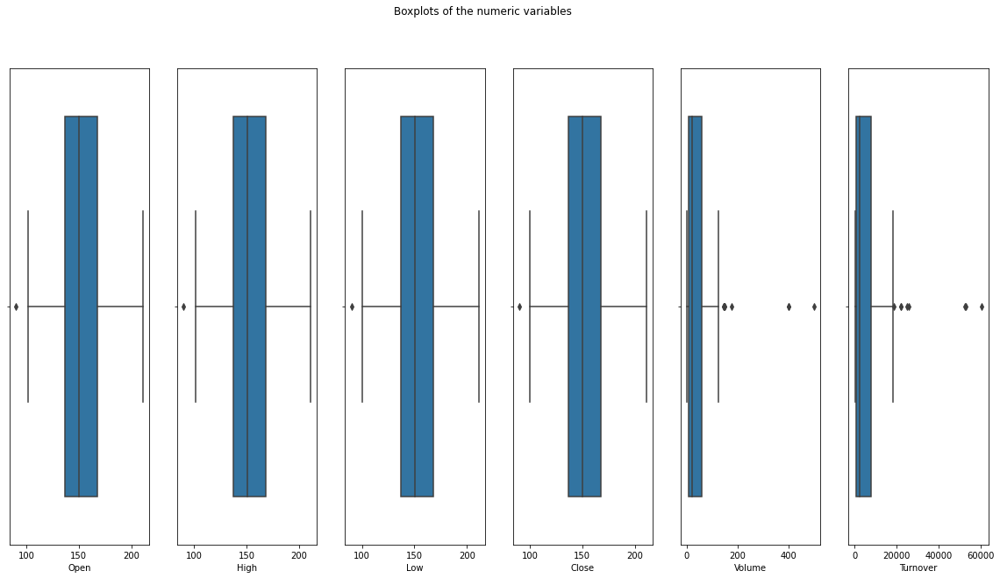

In [ ]:
#Checking for outliers
#Plotting boxplots to visualize outliers in the dataset
import warnings
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
warnings.filterwarnings("ignore")
fig, ((ax1, ax2, ax3,ax4,ax5,ax6)) = plt.subplots(1,6, figsize=(20, 10))
fig.suptitle('Boxplots of the numeric variables')
sns.boxplot(ibm_data['Open'], ax=ax1)
sns.boxplot(ibm_data['High'], ax=ax2)
sns.boxplot(ibm_data['Low'], ax=ax3)
sns.boxplot(ibm_data['Close'], ax=ax4)
sns.boxplot(ibm_data['Volume'], ax=ax5)
sns.boxplot(ibm_data['Turnover'], ax=ax6)
plt.show()

The IBM data has no null values, no duplicates and each column has been allocated the correct data types i.e. the date column has date type and the rest of the columns are float type.

We have quite a huge number of outliers present in the Volume and Turnover columns. However, we'll not remove these outliers as they are important in our analysis and they represent actual information about the stock prices of the IBM company.

### LVMH

In [ ]:
#Checking for null values in the lvmh dataset
lvmh_data.isnull().sum()

Date        0
Open        0
High        0
Low         0
Last        0
Volume      0
Turnover    0
dtype: int64

There are no null values in the LVMH dataset

In [ ]:
#Checking the datatypes in the LVMH dataset
lvmh_data.dtypes

Date        datetime64[ns]
Open               float64
High               float64
Low                float64
Last               float64
Volume             float64
Turnover           float64
dtype: object

The data contains their correct datatypes.

In [ ]:
#Checking for duplicated rows
lvmh_data.duplicated().any()

False

In [ ]:
#Checking for the general information of the dataset
lvmh_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1671 entries, 0 to 1670
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      1671 non-null   datetime64[ns]
 1   Open      1671 non-null   float64       
 2   High      1671 non-null   float64       
 3   Low       1671 non-null   float64       
 4   Close     1671 non-null   float64       
 5   Volume    1671 non-null   float64       
 6   Turnover  1671 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 91.5 KB


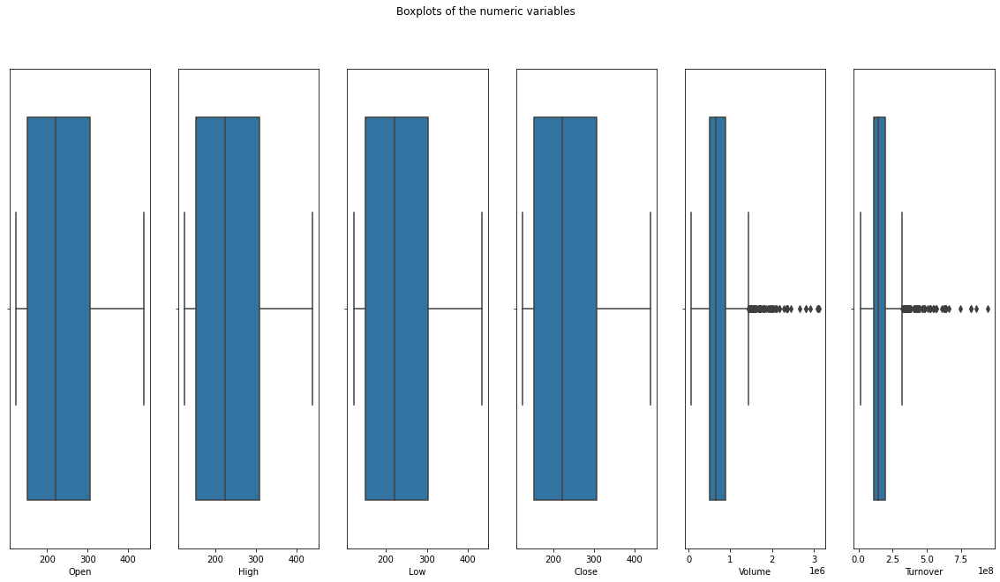

In [ ]:
#Checking for outliers
#Plotting boxplots to visualize outliers in the dataset
import warnings
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
warnings.filterwarnings("ignore")
fig, ((ax1, ax2, ax3,ax4,ax5,ax6)) = plt.subplots(1,6, figsize=(20, 10))
fig.suptitle('Boxplots of the numeric variables')
sns.boxplot(lvmh_data['Open'], ax=ax1)
sns.boxplot(lvmh_data['High'], ax=ax2)
sns.boxplot(lvmh_data['Low'], ax=ax3)
sns.boxplot(lvmh_data['Close'], ax=ax4)
sns.boxplot(lvmh_data['Volume'], ax=ax5)
sns.boxplot(lvmh_data['Turnover'], ax=ax6)
plt.show()

The LVMH data has no null values, no duplicates and each column has been allocated the correct data types i.e. the date column has date type and the rest of the columns are float type.

We have quite a huge number of outliers present in the Volume and Turnover columns. However, we'll not remove these outliers as they are important in our analysis and they represent actual information about the stock prices of the LVMH company.

### MERCK AND CO INC

In [ ]:
#Checking for null values in the merck dataset
merck_data.isnull().sum()

Date        0
Open        0
High        0
Low         0
Last        0
Volume      0
Turnover    0
dtype: int64

In [ ]:
#Checking the datatypes in the merck dataset
merck_data.dtypes

Date        datetime64[ns]
Open               float64
High               float64
Low                float64
Last               float64
Volume             float64
Turnover           float64
dtype: object

In [ ]:
#Checking for duplicated rows
merck_data.duplicated().any()

False

In [ ]:
#Checking for the general information of the dataset
merck_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1537 entries, 0 to 1536
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      1537 non-null   datetime64[ns]
 1   Open      1537 non-null   float64       
 2   High      1537 non-null   float64       
 3   Low       1537 non-null   float64       
 4   Last      1537 non-null   float64       
 5   Volume    1537 non-null   float64       
 6   Turnover  1537 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 84.2 KB


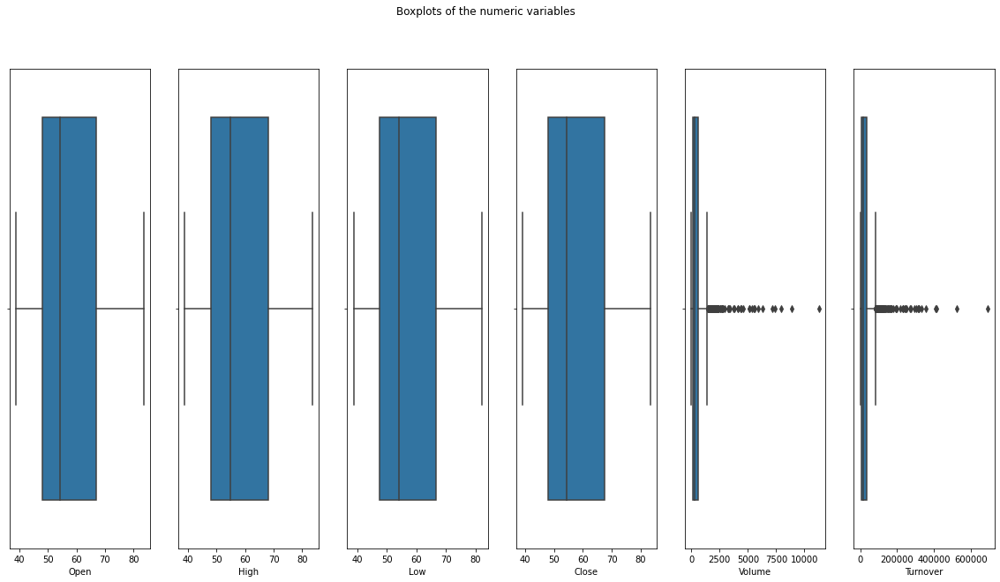

In [ ]:
#Checking for outliers
#Plotting boxplots to visualize outliers in the dataset
import warnings
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
warnings.filterwarnings("ignore")
fig, ((ax1, ax2, ax3,ax4,ax5,ax6)) = plt.subplots(1,6, figsize=(20, 10))
fig.suptitle('Boxplots of the numeric variables')
sns.boxplot(merck_data['Open'], ax=ax1)
sns.boxplot(merck_data['High'], ax=ax2)
sns.boxplot(merck_data['Low'], ax=ax3)
sns.boxplot(merck_data['Close'], ax=ax4)
sns.boxplot(merck_data['Volume'], ax=ax5)
sns.boxplot(merck_data['Turnover'], ax=ax6)
plt.show()

The Merck and Co Inc data has no null values, no duplicates and each column has been allocated the correct data types i.e. the date column has date type and the rest of the columns are float type.

We have quite a huge number of outliers present in the Volume and Turnover columns. However, we'll not remove these outliers as they are important in our analysis and they represent actual information about the stock prices of the Merck and Co Inc company.

# 5.Exploratory Data Analysis and Feature Engineering

We'll now create some useful columns for us to make some inferences about the stock. 

First, we'll find an average value of the day using the High, Low, Open and Last Columns. This is to compute the daily growth of the stock prices compared to day 1 of the prices(i.e compute cumalative compound growth)

We will also create the Daily Returns column which will tell us the returns that we obtain in a day after the stock price closes. For us to do this, we'll first create the column ‘daily lag’ which is basically just shifting the Last price by one day back.

### i.) IBM

In [ ]:
#Creating the average value of the day and naming it price column.
values = (ibm_data['High'] + ibm_data['Low'] + ibm_data['Open'] + ibm_data['Close'])/4
ibm_data = ibm_data.assign(Price=values)
ibm_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Price
0,2014-01-22,187.00,187.00,187.00,187.00,25.0,3446.12,187.00
1,2014-08-29,211.00,211.00,211.00,211.00,8.0,1279.95,211.00
2,2014-09-02,210.95,210.95,210.95,210.95,44.0,7077.25,210.95
3,2014-10-03,205.00,205.00,205.00,205.00,20.0,3249.84,205.00
4,2015-01-29,140.00,140.00,140.00,140.00,50.0,6186.48,140.00


In [ ]:
#Creating the daily lag column for the ibm dataset
#Shifting the Last price by one day back to create the Daily lag column.
ibm_data['Daily Lag'] = ibm_data['Close'].shift(1)
ibm_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Price,Daily Lag
0,2014-01-22,187.00,187.00,187.00,187.00,25.0,3446.12,187.00,NaN
1,2014-08-29,211.00,211.00,211.00,211.00,8.0,1279.95,211.00,187.00
2,2014-09-02,210.95,210.95,210.95,210.95,44.0,7077.25,210.95,211.00
3,2014-10-03,205.00,205.00,205.00,205.00,20.0,3249.84,205.00,210.95
4,2015-01-29,140.00,140.00,140.00,140.00,50.0,6186.48,140.00,205.00


In [ ]:
#Creating the daily returns column using the daily lag column.
ibm_data['Daily Returns'] = (ibm_data['Daily Lag']/ibm_data['Close']) -1
ibm_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Price,Daily Lag,Daily Returns
0,2014-01-22,187.00,187.00,187.00,187.00,25.0,3446.12,187.00,NaN,NaN
1,2014-08-29,211.00,211.00,211.00,211.00,8.0,1279.95,211.00,187.00,-0.113744
2,2014-09-02,210.95,210.95,210.95,210.95,44.0,7077.25,210.95,211.00,0.000237
3,2014-10-03,205.00,205.00,205.00,205.00,20.0,3249.84,205.00,210.95,0.029024
4,2015-01-29,140.00,140.00,140.00,140.00,50.0,6186.48,140.00,205.00,0.464286


Returns are negative but this only considers the returns on a day-to-day basis and so it just tells you that in general the return if you buy and sell on the same day, you will make a loss.

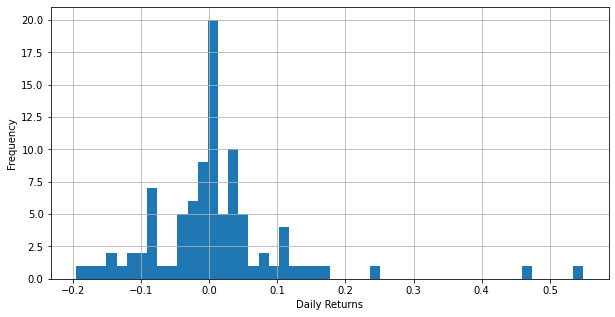

count    94.000000
mean      0.009508
std       0.104560
min      -0.195487
25%      -0.031648
50%       0.000000
75%       0.035136
max       0.548889
Name: Daily Returns, dtype: float64

In [ ]:
#Checking the distribution of the Daily Returns column
ibm_data['Daily Returns'].hist(bins = 50, figsize =  (10,5))
plt.xlabel('Daily Returns')
plt.ylabel('Frequency')
plt.show()

#Statistics
ibm_data['Daily Returns'].describe()

The daily returns histogram is centred about the origin. Since 2014, the mean daily returns has been about 0.0091. The highest % change in positive direction was observed to be 0.54% and was 0.19% in the negative direction. 

Next, we add a column 'Trend' whose values are based on the day-to-day daily returns calculated above. The trend is determined by the returns. If returns are positive the the trend is positive and vice versa.

In [ ]:
#Defining the function
def trend(x):
  if x > 0:
    return 'Positive'
  elif x < 0:
    return 'Negative'
ibm_data['Trend']= ibm_data['Daily Returns'].apply(lambda x:trend(x))
ibm_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Price,Daily Lag,Daily Returns,Trend
0,2014-01-22,187.00,187.00,187.00,187.00,25.0,3446.12,187.00,NaN,NaN,None
1,2014-08-29,211.00,211.00,211.00,211.00,8.0,1279.95,211.00,187.00,-0.113744,Negative
2,2014-09-02,210.95,210.95,210.95,210.95,44.0,7077.25,210.95,211.00,0.000237,Positive
3,2014-10-03,205.00,205.00,205.00,205.00,20.0,3249.84,205.00,210.95,0.029024,Positive
4,2015-01-29,140.00,140.00,140.00,140.00,50.0,6186.48,140.00,205.00,0.464286,Positive


Since we would like to see how the stock was trending over the years, we'll visualize this trend with a pie chart.

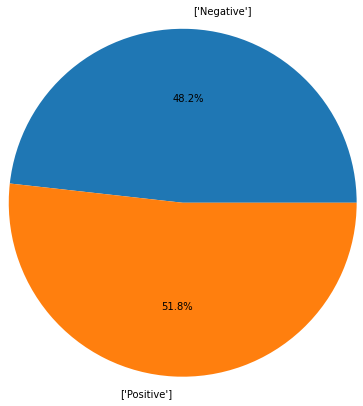

In [ ]:
#Visualizing the trend frequency with a pie chart
ibm_pie_data = ibm_data.groupby('Trend')
pie_label = sorted([i for i in ibm_pie_data['Trend'].unique()])
plt.pie(ibm_pie_data['Trend'].count(), labels=pie_label, autopct ='%.1f%%', radius = 2)
plt.show()

There were more positive trends in IBM over the years compared to negative ones. However the negative trends were at 48.8% which is almost half.

Distribution Plots

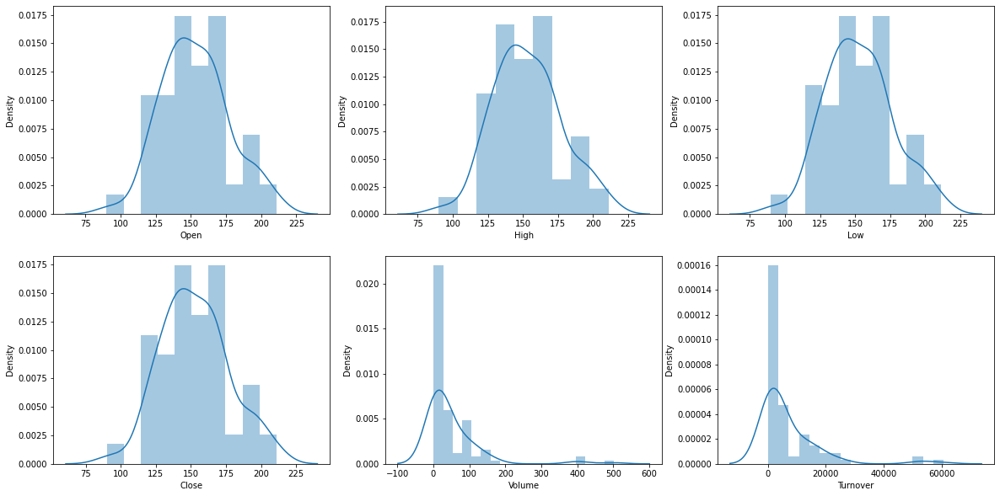

In [ ]:
#Plotting distribution plots for the variables to see the type of distribution they possess
warnings.filterwarnings("ignore")
f, axes = plt.subplots(2, 3, figsize=(20, 10), sharex=False)
sns.distplot(ibm_data['Open'],ax=axes[0, 0])
sns.distplot(ibm_data['High'],ax=axes[0, 1])
sns.distplot(ibm_data['Low'],ax=axes[0, 2])
sns.distplot(ibm_data['Close'],ax=axes[1, 0])
sns.distplot(ibm_data['Volume'],ax=axes[1, 1])
sns.distplot(ibm_data['Turnover'],ax=axes[1, 2])

Histograms

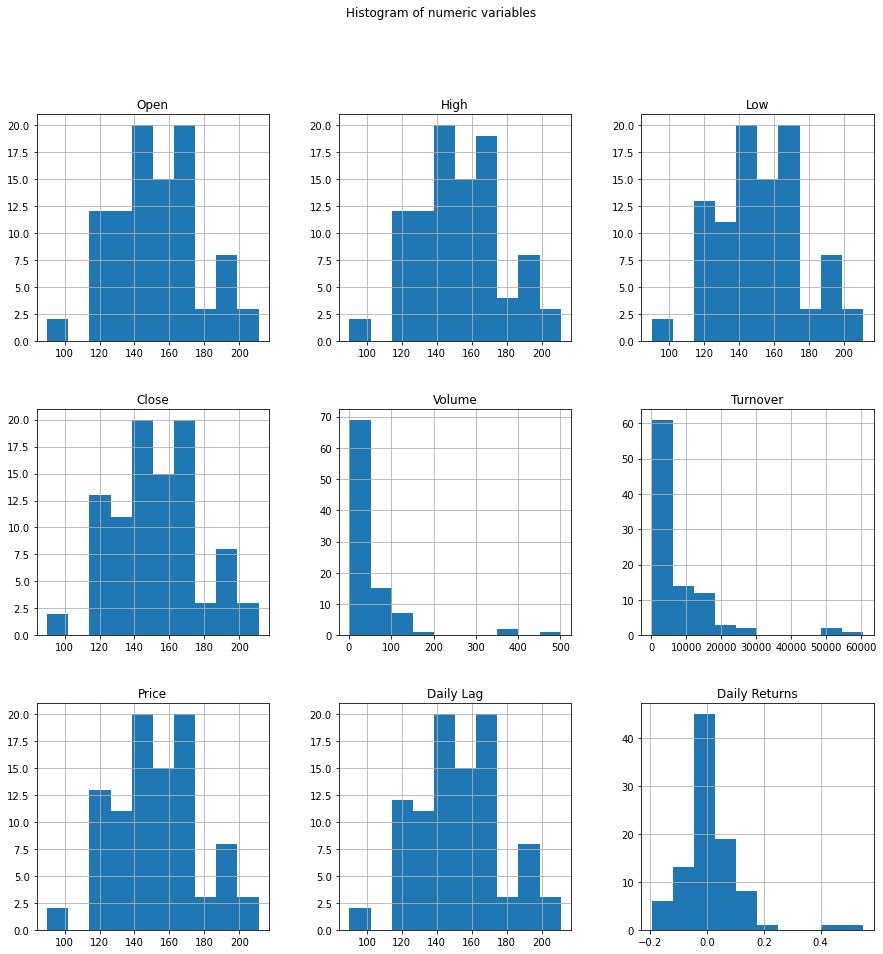

In [ ]:
#Plotting the variables on histograms to view the distribution of each variable.
ibm_data.hist(bins=10, figsize=(15,15))
plt.suptitle("Histogram of numeric variables")
plt.savefig('Merck and Co Inc Histogram')
plt.show()

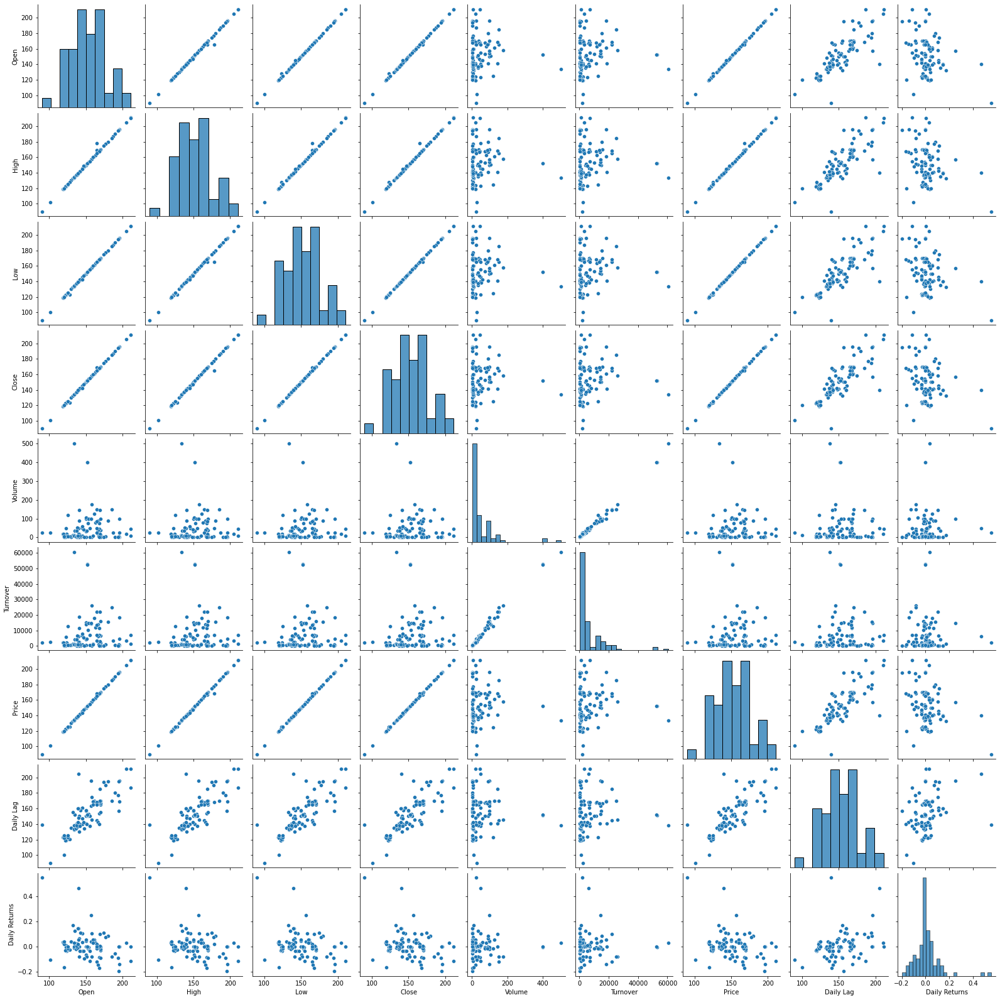

In [ ]:
#PLotting pairplots to see the relationship between variables
import seaborn as sns
sns.pairplot(ibm_data)

In [ ]:
#Checking how our varibales are correlated using a matrix
corrMatrix = ibm_data.corr()
corrMatrix

,Open,High,Low,Close,Volume,Turnover,Price,Daily Lag,Daily Returns
Open,1.000000,0.998316,0.999739,0.999585,0.021146,0.080549,0.999798,0.816772,-0.298976
High,0.998316,1.000000,0.998080,0.998207,0.021545,0.080931,0.999040,0.816528,-0.297561
Low,0.999739,0.998080,1.000000,0.999852,0.021734,0.081041,0.999806,0.817849,-0.297197
Close,0.999585,0.998207,0.999852,1.000000,0.022354,0.081901,0.999800,0.818033,-0.297186
Volume,0.021146,0.021545,0.021734,0.022354,1.000000,0.992977,0.021704,0.033595,-0.000184
Turnover,0.080549,0.080931,0.081041,0.081901,0.992977,1.000000,0.081138,0.082267,-0.019597
Price,0.999798,0.999040,0.999806,0.999800,0.021704,0.081138,1.000000,0.817621,-0.297847
Daily Lag,0.816772,0.816528,0.817849,0.818033,0.033595,0.082267,0.817621,1.000000,0.288227
Daily Returns,-0.298976,-0.297561,-0.297197,-0.297186,-0.000184,-0.019597,-0.297847,0.288227,1.000000


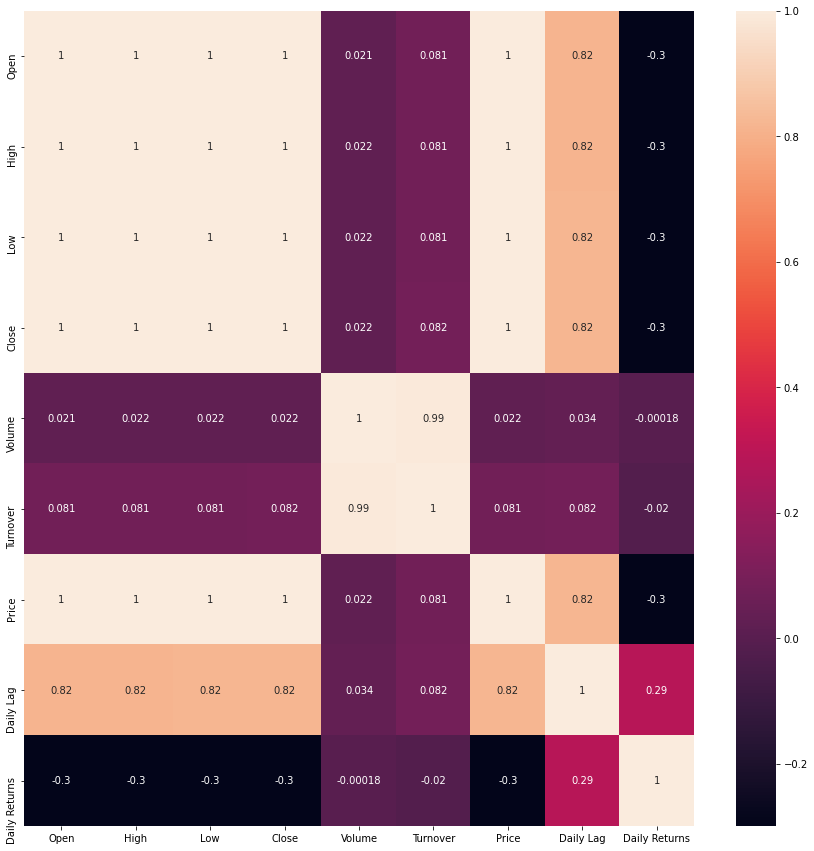

In [ ]:
#Plotting visualization of the correlation matrix for better clarity 
plt.figure(figsize=(15, 15))  
sns.heatmap(corrMatrix, annot = True)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

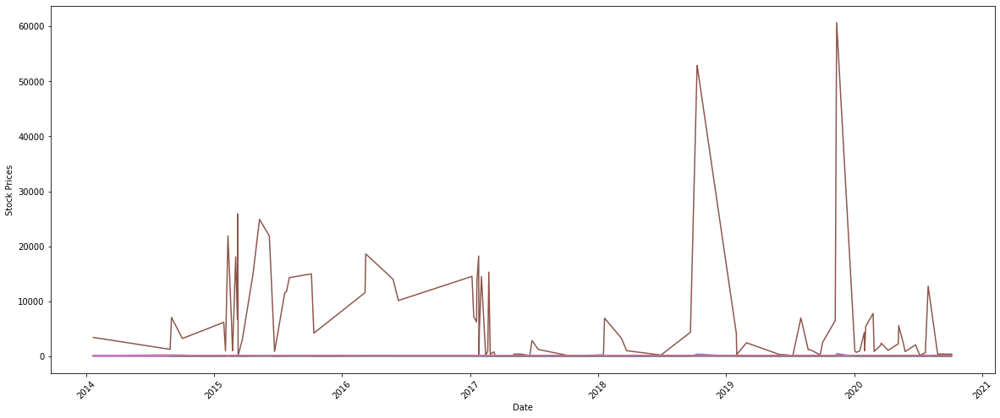

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Open',data=ibm_data)
plt.plot('Date','High',data=ibm_data)
plt.plot('Date','Low',data=ibm_data)
plt.plot('Date','Close',data=ibm_data)
plt.plot('Date','Volume',data=ibm_data)
plt.plot('Date','Turnover',data=ibm_data)
plt.plot('Date','Price',data=ibm_data)
plt.plot('Date','Daily Returns',data=ibm_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

This plots are not so clear due to the difference in values of each column. We'll plot individual columns of each column for clarity.

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

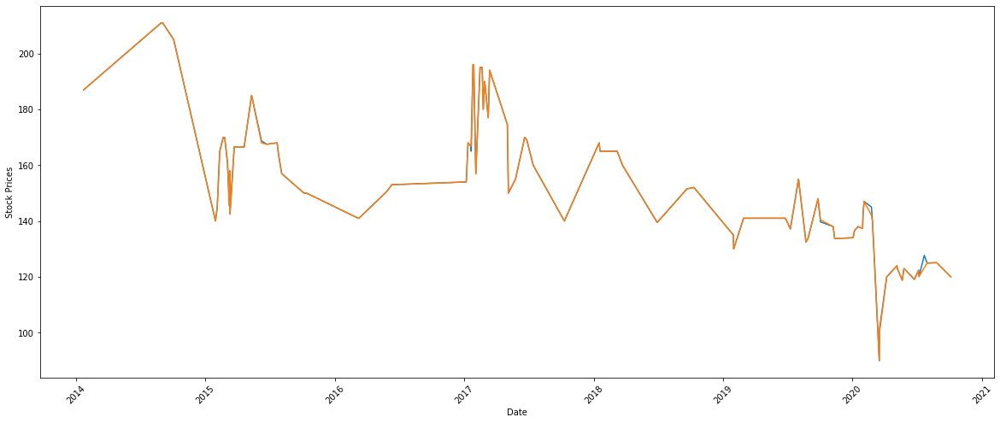

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Open',data=ibm_data)
plt.plot('Date','Close',data=ibm_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

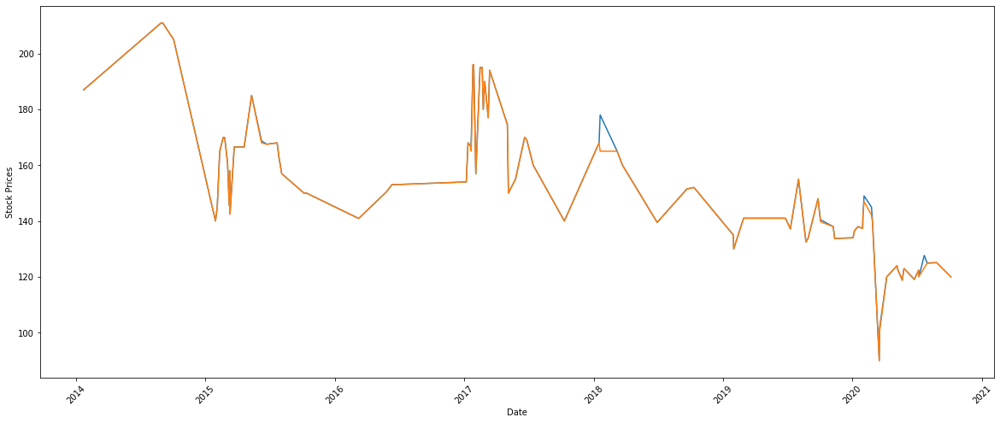

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','High',data=ibm_data)
plt.plot('Date','Low',data=ibm_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

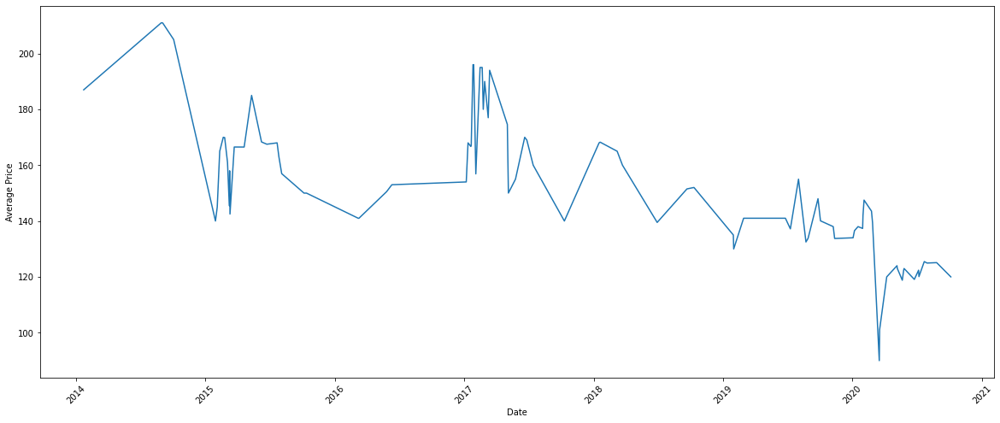

In [ ]:
#Visualizing the average price over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Price',data=ibm_data)
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.xticks(rotation=45)

(array([735234., 735599., 735964., 736330., 736695., 737060., 737425.,
        737791.]), <a list of 8 Text major ticklabel objects>)

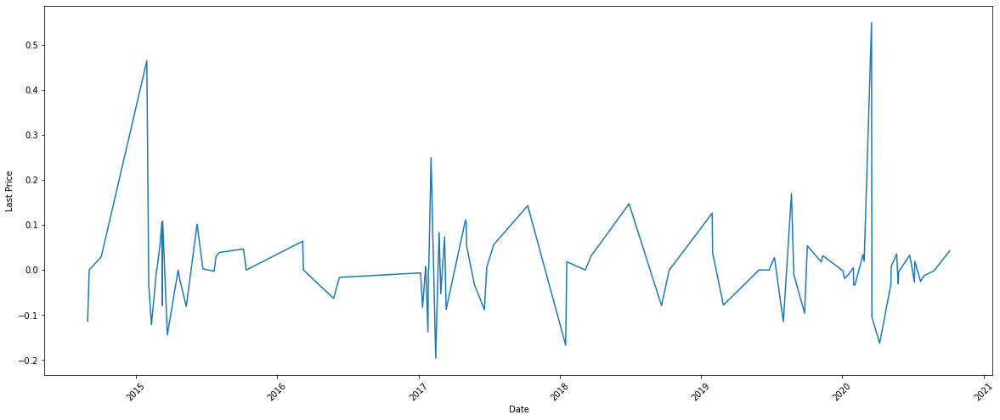

In [ ]:
#Visualizing the Daily Returns over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Daily Returns',data=ibm_data)
plt.xlabel('Date')
plt.ylabel('Last Price')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

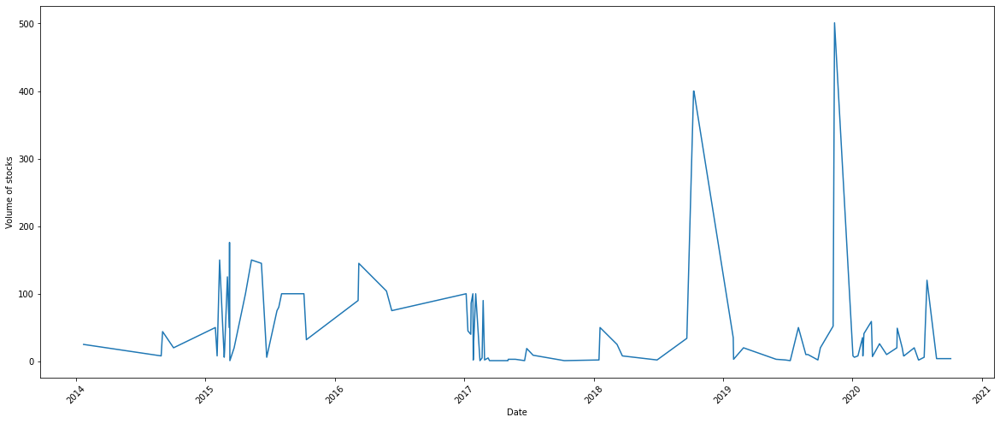

In [ ]:
#Visualizing the Volume over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Volume',data=ibm_data)
plt.xlabel('Date')
plt.ylabel('Volume of stocks')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

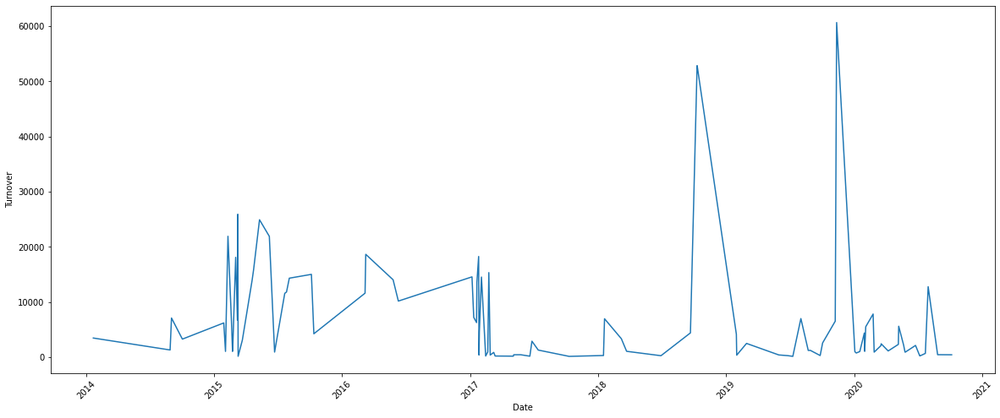

In [ ]:
#Visualizing the Turnover over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Turnover',data=ibm_data)
plt.xlabel('Date')
plt.ylabel('Turnover')
plt.xticks(rotation=45)

The stock prices seem to be decreasing gradually over the years a very significant drop in 2020 and this might be attributed to the global pandemiv that occured in early 2020. However the stock prices went back to normal after the significant drop in March.

Candlestick Charts

We'll plot candlestick charts which are a style of financial chart describing open, high, low and close for a given time. The boxes represent the spread between the open and close values and the lines represent the spread between the low and high values. 

Sample points where the close value is higher (lower) then the open value are called increasing (decreasing). By default, increasing candles are drawn in green whereas decreasing are drawn in red.

In [ ]:
import plotly.graph_objects as go
from datetime import datetime
fig = go.Figure(data=[go.Candlestick(x=ibm_data['Date'],
                open=ibm_data['Open'],
                high=ibm_data['High'],
                low=ibm_data['Low'],
                close=ibm_data['Close'])])
fig.show()

Quarter Reports

In [ ]:
from sklearn.model_selection import train_test_split as tts
ibm = ibm_data[["Date","Close"]]
train, test = tts(ibm, test_size = 0.3)
train_length = len(train)
print('train_length:',train_length, '\n test_length:', len(test))

train_length: 66 
 test_length: 29


In [ ]:
#collapse-hide
alt.Chart(train.reset_index()).mark_line(point=True).encode(
    x='quarter(Date)', 
    y='Last',
    column='year(Date)',
    tooltip=['Date', 'Last']).properties(
    title="Last: Yearly Subseries plot",
    width=100).configure_header(
    titleColor='black',
    titleFontSize=14,
    labelColor='blue',
    labelFontSize=14
)

alt.Chart(...)

IBM Stock Growth and Decline Analysis

In [ ]:
import numpy as np
ibm_data["Company"] = "IBM"
day_prices = ibm_data[ibm_data.Date == ibm_data.Date.min()].Price
stock_name = ibm_data.Company.unique()
price_mapping = {n : c for n, c in zip(stock_name, day_prices)}
base_mapping = np.array(list(map(lambda x : price_mapping[x], ibm_data['Company'].values)))
ibm_data['Growth'] = ibm_data['Price'] / base_mapping - 1
ibm_data.Growth.describe()

IBM stocks had their highest increase in stock prices of 12% and a decline of 51%

### ii.) LVMH

In [ ]:
#Creating the average value of the day and naming it price column.
values = (lvmh_data['High'] + lvmh_data['Low'] + lvmh_data['Open'] + lvmh_data['Close'])/4
lvmh_data = lvmh_data.assign(Price=values)
lvmh_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Price
0,2014-02-14,133.95,135.05,132.75,134.80,884136.0,1.189604e+08,134.1375
1,2014-02-17,135.50,135.75,134.85,135.20,453221.0,6.131023e+07,135.3250
2,2014-02-18,135.65,136.10,134.80,135.75,682066.0,9.245102e+07,135.5750
3,2014-02-19,135.40,136.45,135.10,136.25,646308.0,8.783046e+07,135.8000
4,2014-02-20,135.00,137.15,134.50,137.15,777457.0,1.060057e+08,135.9500


In [ ]:
#Creating the daily lag column for the ibm dataset
#Shifting the Last price by one day back to create the Daily lag column.
lvmh_data['Daily Lag'] = lvmh_data['Close'].shift(1)
lvmh_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Price,Daily Lag
0,2014-02-14,133.95,135.05,132.75,134.80,884136.0,1.189604e+08,134.1375,NaN
1,2014-02-17,135.50,135.75,134.85,135.20,453221.0,6.131023e+07,135.3250,134.80
2,2014-02-18,135.65,136.10,134.80,135.75,682066.0,9.245102e+07,135.5750,135.20
3,2014-02-19,135.40,136.45,135.10,136.25,646308.0,8.783046e+07,135.8000,135.75
4,2014-02-20,135.00,137.15,134.50,137.15,777457.0,1.060057e+08,135.9500,136.25


In [ ]:
#Creating the daily returns column using the daily lag column.
lvmh_data['Daily Returns'] = (lvmh_data['Daily Lag']/lvmh_data['Close']) -1
lvmh_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Price,Daily Lag,Daily Returns
0,2014-02-14,133.95,135.05,132.75,134.80,884136.0,1.189604e+08,134.1375,NaN,NaN
1,2014-02-17,135.50,135.75,134.85,135.20,453221.0,6.131023e+07,135.3250,134.80,-0.002959
2,2014-02-18,135.65,136.10,134.80,135.75,682066.0,9.245102e+07,135.5750,135.20,-0.004052
3,2014-02-19,135.40,136.45,135.10,136.25,646308.0,8.783046e+07,135.8000,135.75,-0.003670
4,2014-02-20,135.00,137.15,134.50,137.15,777457.0,1.060057e+08,135.9500,136.25,-0.006562


Returns are negative but this only considers the returns on a day-to-day basis and so it just tells you that in general the return if you buy and sell on the same day, you will make a loss.

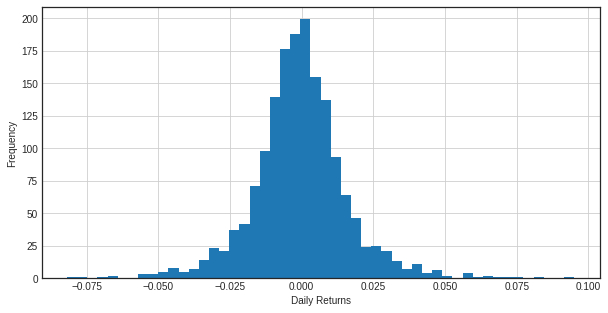

count    93.000000
mean      0.009153
std       0.105070
min      -0.195487
25%      -0.032129
50%       0.000000
75%       0.034483
max       0.548889
Name: Daily Returns, dtype: float64

In [ ]:
#Checking the distribution of the Daily Returns column
lvmh_data['Daily Returns'].hist(bins = 50, figsize =  (10,5))
plt.xlabel('Daily Returns')
plt.ylabel('Frequency')
plt.show()

#Statistics
lvmh_data['Daily Returns'].describe()

The daily returns histogram is centred about the origin. Since 2014, the mean daily returns has been about 0.0091. The highest % change in positive direction was observed to be 0.54% and was 0.19% in the negative direction. 

Next, we add a column 'Trend' whose values are based on the day-to-day daily returns calculated above. The trend is determined by the returns. If returns are positive the the trend is positive and vice versa.

In [ ]:
#Defining the function
def trend(x):
  if x > 0:
    return 'Positive'
  elif x < 0:
    return 'Negative'
lvmh_data['Trend']= lvmh_data['Daily Returns'].apply(lambda x:trend(x))
lvmh_data.head()

,Date,Open,High,Low,Last,Volume,Turnover,Price,Daily Lag,Daily Returns,Trend
0,2014-02-14,133.95,135.05,132.75,134.80,884136.0,1.189604e+08,134.1375,NaN,NaN,None
1,2014-02-17,135.50,135.75,134.85,135.20,453221.0,6.131023e+07,135.3250,134.80,-0.002959,Negative
2,2014-02-18,135.65,136.10,134.80,135.75,682066.0,9.245102e+07,135.5750,135.20,-0.004052,Negative
3,2014-02-19,135.40,136.45,135.10,136.25,646308.0,8.783046e+07,135.8000,135.75,-0.003670,Negative
4,2014-02-20,135.00,137.15,134.50,137.15,777457.0,1.060057e+08,135.9500,136.25,-0.006562,Negative


Since we would like to see how the stock was trending over the years, we'll visualize this trend with a pie chart.

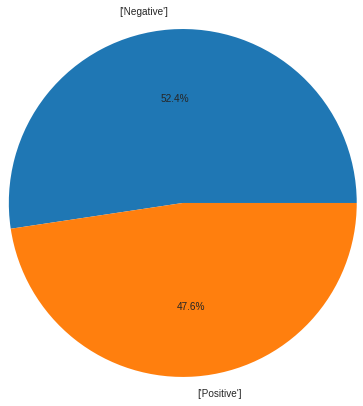

In [ ]:
#Visualizing the trend frequency with a pie chart
lvmh_pie_data = lvmh_data.groupby('Trend')
pie_label = sorted([i for i in lvmh_pie_data['Trend'].unique()])
plt.pie(lvmh_pie_data['Trend'].count(), labels=pie_label, autopct ='%.1f%%', radius = 2)
plt.show()

There were more positive trends in IBM over the years compared to negative ones. However the negative trends were at 48.8% which is almost half.

Distribution Plots

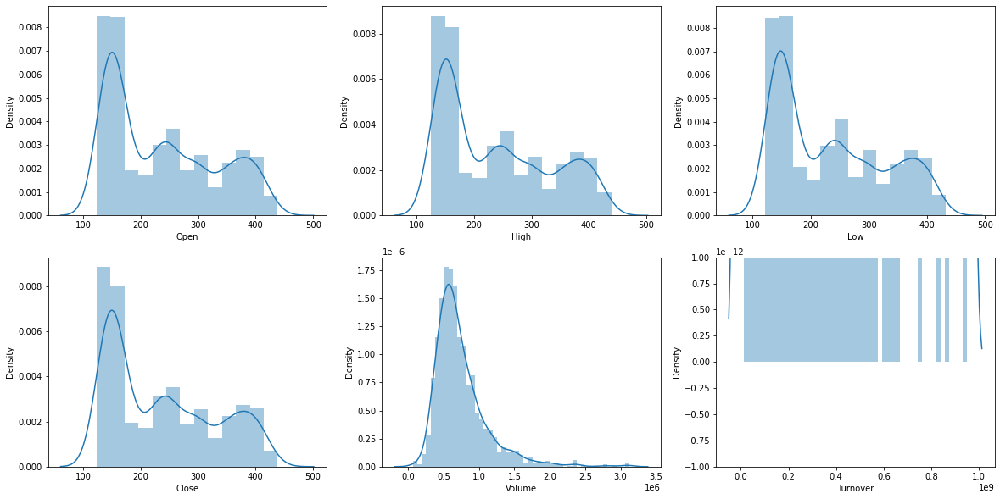

In [ ]:
#Plotting distribution plots for the variables to see the type of distribution they possess
warnings.filterwarnings("ignore")
f, axes = plt.subplots(2, 3, figsize=(20, 10), sharex=False)
sns.distplot(lvmh_data['Open'],ax=axes[0, 0])
sns.distplot(lvmh_data['High'],ax=axes[0, 1])
sns.distplot(lvmh_data['Low'],ax=axes[0, 2])
sns.distplot(lvmh_data['Close'],ax=axes[1, 0])
sns.distplot(lvmh_data['Volume'],ax=axes[1, 1])
sns.distplot(lvmh_data['Turnover'],ax=axes[1, 2])

Histograms

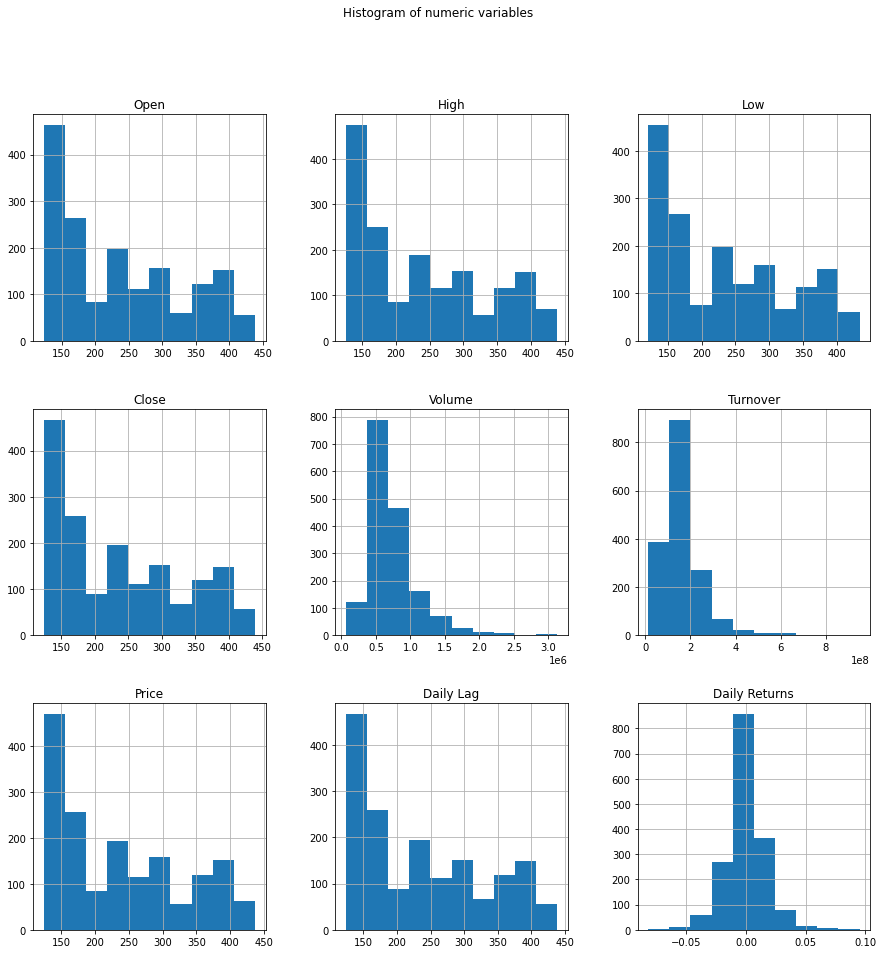

In [ ]:
#Plotting the variables on histograms to view the distribution of each variable.
lvmh_data.hist(bins=10, figsize=(15,15))
plt.suptitle("Histogram of numeric variables")
plt.savefig('Merck and Co Inc Histogram')
plt.show()

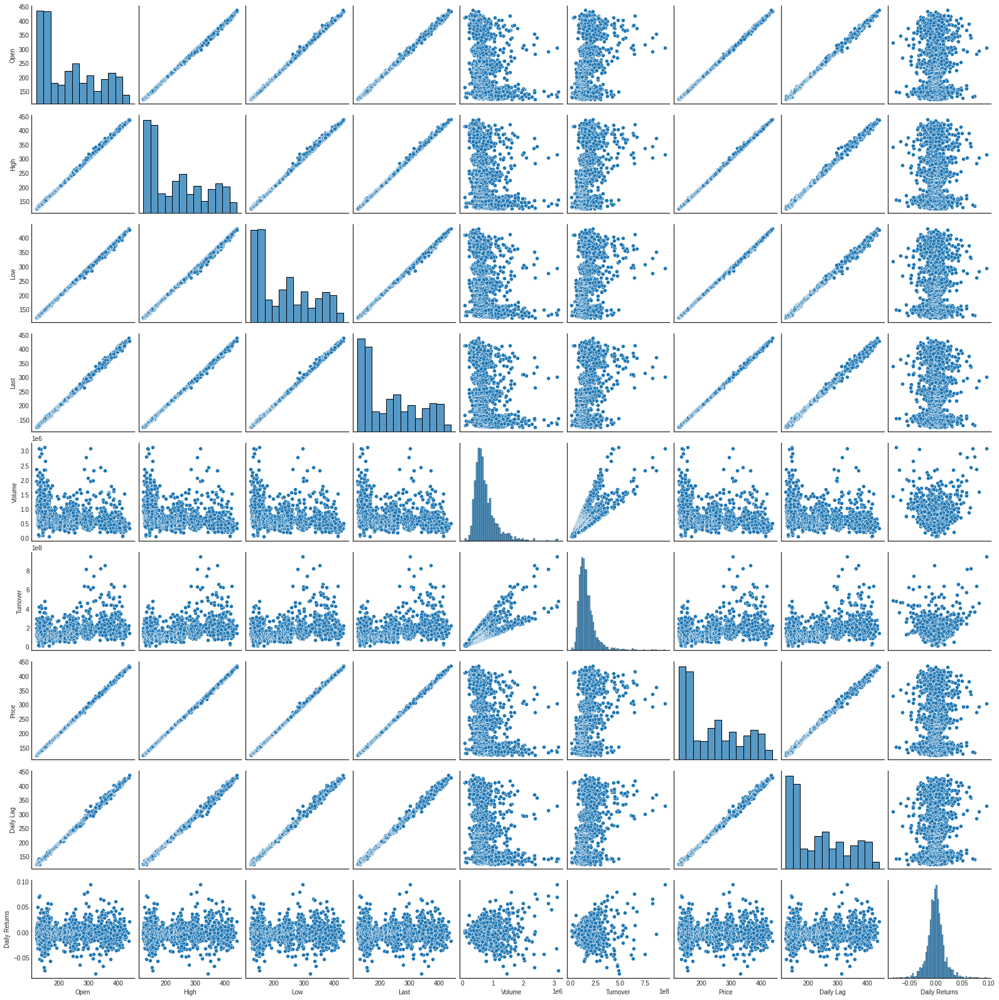

In [ ]:
#PLotting pairplots to see the relationship between variables
import seaborn as sns
sns.pairplot(lvmh_data)

In [ ]:
#Checking how our varibales are correlated using a matrix
corrMatrix = lvmh_data.corr()
corrMatrix

,Open,High,Low,Close,Volume,Turnover,Price,Daily Lag,Daily Returns
Open,1.000000,0.999717,0.999648,0.999366,-0.305765,0.413221,0.999833,0.999549,0.000442
High,0.999717,1.000000,0.999544,0.999671,-0.298036,0.421722,0.999884,0.999282,-0.011098
Low,0.999648,0.999544,1.000000,0.999660,-0.314172,0.403901,0.999861,0.999144,-0.013660
Close,0.999366,0.999671,0.999660,1.000000,-0.306555,0.412251,0.999824,0.998884,-0.025502
Volume,-0.305765,-0.298036,-0.314172,-0.306555,1.000000,0.669403,-0.306134,-0.303403,0.065645
Turnover,0.413221,0.421722,0.403901,0.412251,0.669403,1.000000,0.412885,0.415437,0.058167
Price,0.999833,0.999884,0.999861,0.999824,-0.306134,0.412885,1.000000,0.999365,-0.012451
Daily Lag,0.999549,0.999282,0.999144,0.998884,-0.303403,0.415437,0.999365,1.000000,0.018681
Daily Returns,0.000442,-0.011098,-0.013660,-0.025502,0.065645,0.058167,-0.012451,0.018681,1.000000


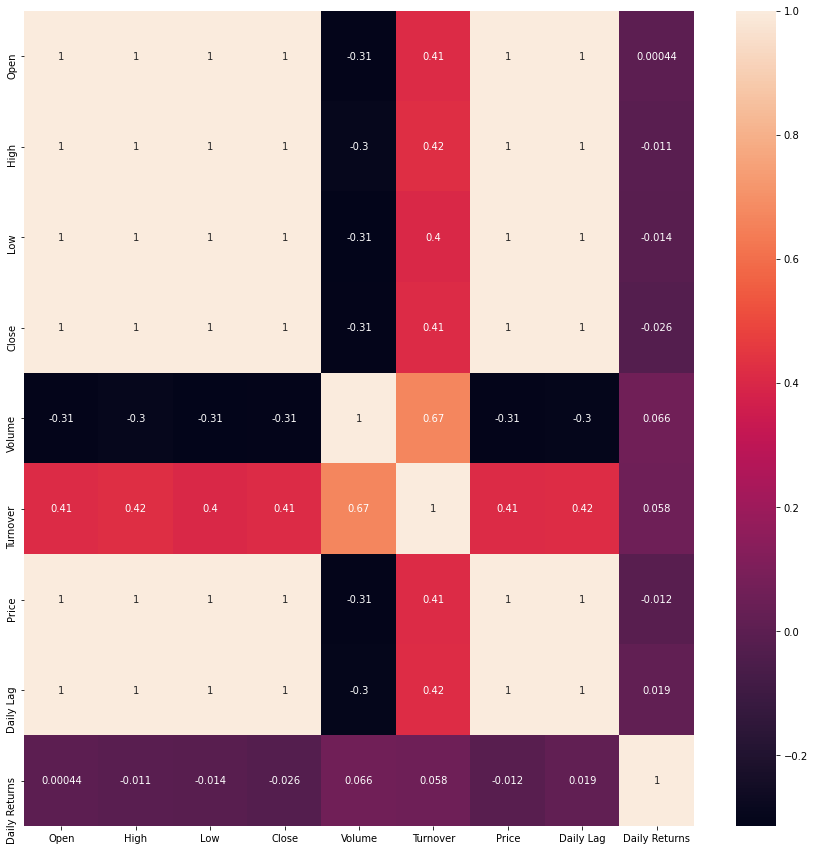

In [ ]:
#Plotting visualization of the correlation matrix for better clarity 
plt.figure(figsize=(15, 15))  
sns.heatmap(corrMatrix, annot = True)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

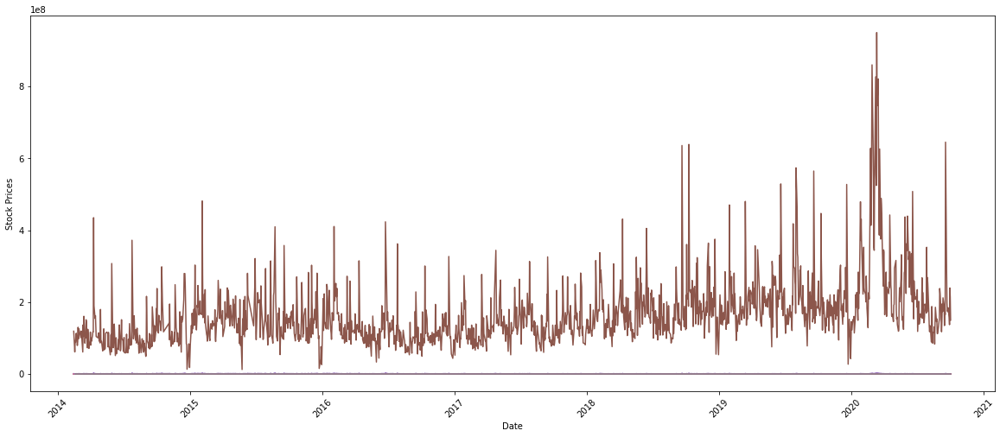

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Open',data=lvmh_data)
plt.plot('Date','High',data=lvmh_data)
plt.plot('Date','Low',data=lvmh_data)
plt.plot('Date','Close',data=lvmh_data)
plt.plot('Date','Volume',data=lvmh_data)
plt.plot('Date','Turnover',data=lvmh_data)
plt.plot('Date','Price',data=lvmh_data)
plt.plot('Date','Daily Returns',data=lvmh_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

This plots are not so clear due to the difference in values of each column. We'll plot individual columns of each column for clarity.

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

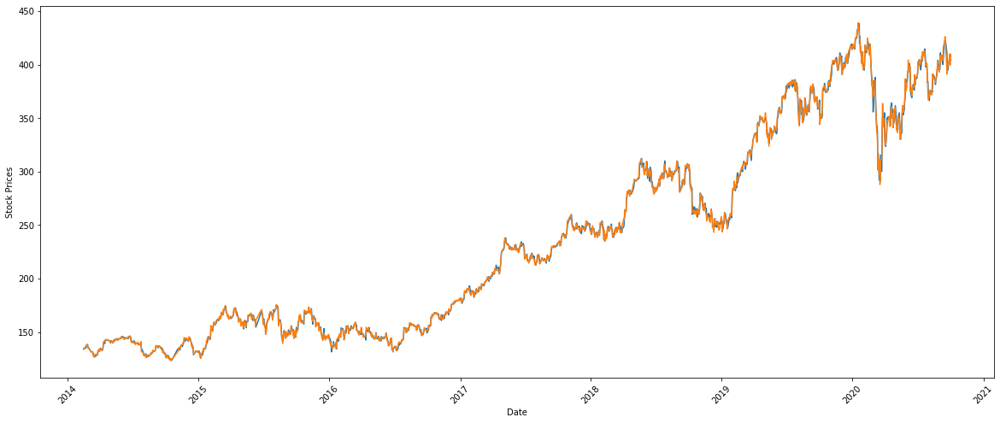

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Open',data=lvmh_data)
plt.plot('Date','Close',data=lvmh_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

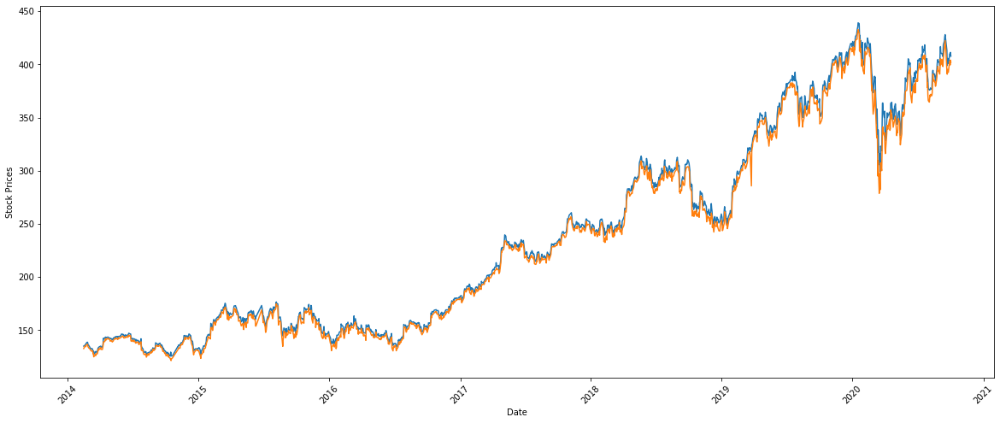

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','High',data=lvmh_data)
plt.plot('Date','Low',data=lvmh_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

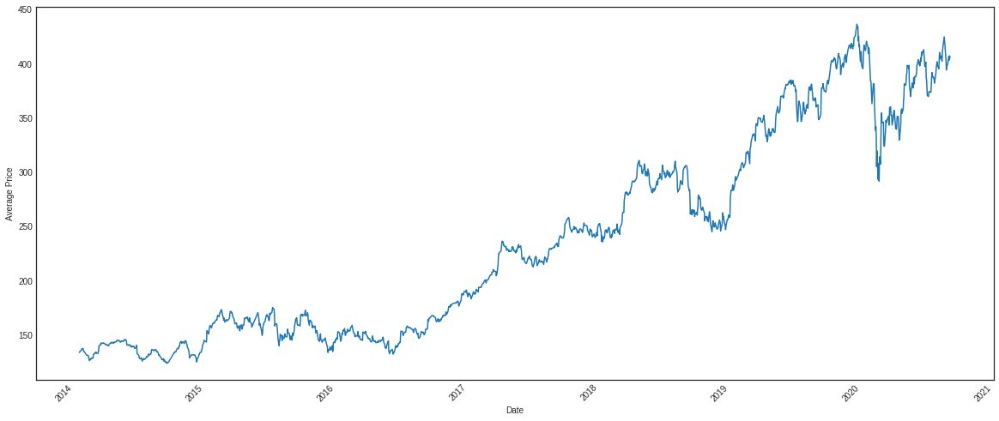

In [ ]:
#Visualizing the average price over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Price',data=lvmh_data)
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

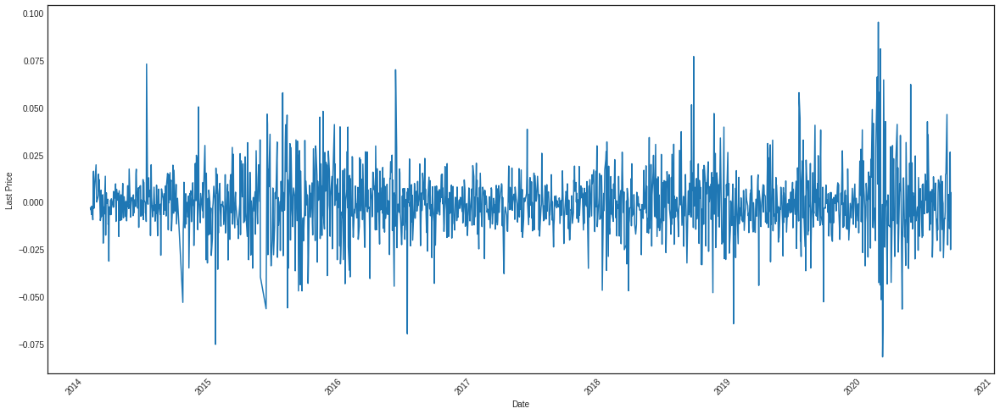

In [ ]:
#Visualizing the Daily Returns over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Daily Returns',data=lvmh_data)
plt.xlabel('Date')
plt.ylabel('Last Price')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

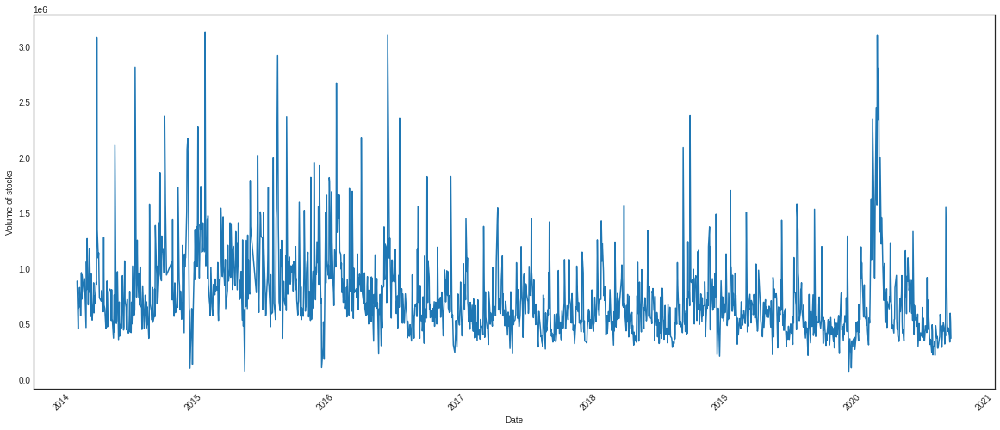

In [ ]:
#Visualizing the Volume over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Volume',data=lvmh_data)
plt.xlabel('Date')
plt.ylabel('Volume of stocks')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

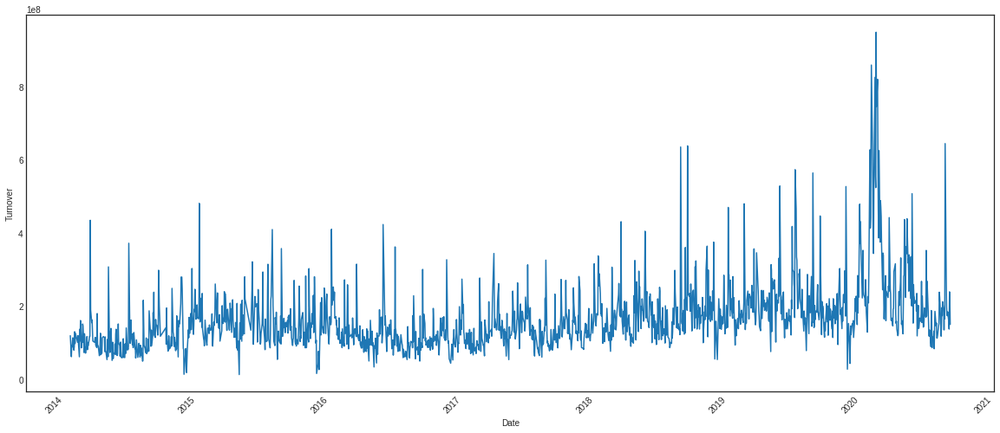

In [ ]:
#Visualizing the Turnover over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Turnover',data=lvmh_data)
plt.xlabel('Date')
plt.ylabel('Turnover')
plt.xticks(rotation=45)

The stock prices seem to be increasing gradually over the years although there was a significant drop in 2018 then a very significant increase in 2019. However the prices decreased in 2020 and this might be attributed to the pandemic.

Candlestick charts

In [ ]:
import plotly.graph_objects as go
from datetime import datetime
fig = go.Figure(data=[go.Candlestick(x=lvmh_data['Date'],
                open=lvmh_data['Open'],
                high=lvmh_data['High'],
                low=lvmh_data['Low'],
                close=lvmh_data['Close'])])
fig.show()

Quarter Reports

In [ ]:
from sklearn.model_selection import train_test_split as tts
lvmh = lvmh_data[["Date","Last"]]
train, test = tts(lvmh, test_size = 0.3)
train_length = len(train)
print('train_length:',train_length, '\n test_length:', len(test))

train_length: 1165 
 test_length: 500


In [ ]:
#collapse-hide
alt.Chart(train.reset_index()).mark_line(point=True).encode(
    x='quarter(Date)', 
    y='Last',
    column='year(Date)',
    tooltip=['Date', 'Last']).properties(
    title="Last: Yearly Subseries plot",
    width=100).configure_header(
    titleColor='black',
    titleFontSize=14,
    labelColor='blue',
    labelFontSize=14
)

alt.Chart(...)

LVMH Stock Growth and Decline Analysis

In [ ]:
lvmh_data["Company"] = "LVMH"
day_prices = lvmh_data[lvmh_data.Date == lvmh_data.Date.min()].Price
stock_name = lvmh_data.Company.unique()
price_mapping = {n : c for n, c in zip(stock_name, day_prices)}
base_mapping = np.array(list(map(lambda x : price_mapping[x], lvmh_data['Company'].values)))
lvmh_data['Growth'] = lvmh_data['Price'] / base_mapping - 1
lvmh_data.Growth.describe()

count    1665.000000
mean        0.765936
std         0.687818
min        -0.073991
25%         0.136054
50%         0.649427
75%         1.279378
max         2.253658
Name: Growth, dtype: float64

### iii.) MERCK AND CO INC.

In [ ]:
#Creating the average value of the day and naming it price column.
values = (merck_data['High'] + merck_data['Low'] + merck_data['Open'] + merck_data['Close'])/4
merck_data = merck_data.assign(Price=values)
merck_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Company,Price
0,2014-02-14,40.00,40.20,40.00,40.20,117.0,4687.00,MERCK,40.1000
1,2014-02-17,40.02,40.35,40.02,40.35,371.0,14909.01,MERCK,40.1850
2,2014-02-18,40.11,40.11,40.11,40.11,225.0,9024.75,MERCK,40.1100
3,2014-02-19,39.85,40.30,39.84,40.30,400.0,15973.10,MERCK,40.0725
4,2014-02-20,39.90,40.34,39.89,40.34,233.0,9318.10,MERCK,40.1175


In [ ]:
#Creating the daily lag column for the ibm dataset
#Shifting the Last price by one day back to create the Daily lag column.
merck_data['Daily Lag'] = merck_data['Close'].shift(1)
merck_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Company,Price,Daily Lag
0,2014-02-14,40.00,40.20,40.00,40.20,117.0,4687.00,MERCK,40.1000,NaN
1,2014-02-17,40.02,40.35,40.02,40.35,371.0,14909.01,MERCK,40.1850,40.20
2,2014-02-18,40.11,40.11,40.11,40.11,225.0,9024.75,MERCK,40.1100,40.35
3,2014-02-19,39.85,40.30,39.84,40.30,400.0,15973.10,MERCK,40.0725,40.11
4,2014-02-20,39.90,40.34,39.89,40.34,233.0,9318.10,MERCK,40.1175,40.30


In [ ]:
#Creating the daily returns column using the daily lag column.
merck_data['Daily Returns'] = (merck_data['Daily Lag']/merck_data['Close']) -1
merck_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Company,Price,Daily Lag,Daily Returns
0,2014-02-14,40.00,40.20,40.00,40.20,117.0,4687.00,MERCK,40.1000,NaN,NaN
1,2014-02-17,40.02,40.35,40.02,40.35,371.0,14909.01,MERCK,40.1850,40.20,-0.003717
2,2014-02-18,40.11,40.11,40.11,40.11,225.0,9024.75,MERCK,40.1100,40.35,0.005984
3,2014-02-19,39.85,40.30,39.84,40.30,400.0,15973.10,MERCK,40.0725,40.11,-0.004715
4,2014-02-20,39.90,40.34,39.89,40.34,233.0,9318.10,MERCK,40.1175,40.30,-0.000992


Returns are negative but this only considers the returns on a day-to-day basis and so it just tells you that in general the return if you buy and sell on the same day, you will make a loss.

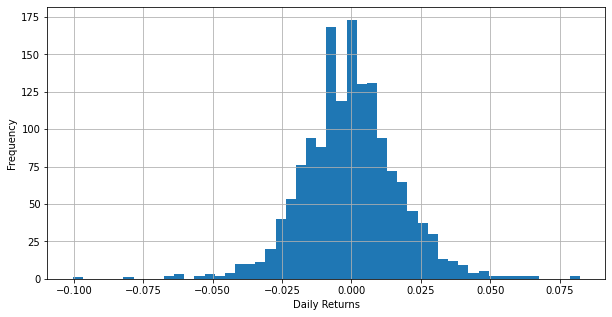

count    93.000000
mean      0.009153
std       0.105070
min      -0.195487
25%      -0.032129
50%       0.000000
75%       0.034483
max       0.548889
Name: Daily Returns, dtype: float64

In [ ]:
#Checking the distribution of the Daily Returns column
merck_data['Daily Returns'].hist(bins = 50, figsize =  (10,5))
plt.xlabel('Daily Returns')
plt.ylabel('Frequency')
plt.show()

#Statistics
ibm_data['Daily Returns'].describe()

The daily returns histogram is centred about the origin. Since 2014, the mean daily returns has been about 0.0091. The highest % change in positive direction was observed to be 0.54% and was 0.19% in the negative direction. 

Next, we add a column 'Trend' whose values are based on the day-to-day daily returns calculated above. The trend is determined by the returns. If returns are positive the the trend is positive and vice versa.

In [ ]:
#Defining the function
def trend(x):
  if x > 0:
    return 'Positive'
  elif x < 0:
    return 'Negative'
merck_data['Trend']= merck_data['Daily Returns'].apply(lambda x:trend(x))
merck_data.head()

,Date,Open,High,Low,Close,Volume,Turnover,Company,Price,Daily Lag,Daily Returns,Trend
0,2014-02-14,40.00,40.20,40.00,40.20,117.0,4687.00,MERCK,40.1000,NaN,NaN,None
1,2014-02-17,40.02,40.35,40.02,40.35,371.0,14909.01,MERCK,40.1850,40.20,-0.003717,Negative
2,2014-02-18,40.11,40.11,40.11,40.11,225.0,9024.75,MERCK,40.1100,40.35,0.005984,Positive
3,2014-02-19,39.85,40.30,39.84,40.30,400.0,15973.10,MERCK,40.0725,40.11,-0.004715,Negative
4,2014-02-20,39.90,40.34,39.89,40.34,233.0,9318.10,MERCK,40.1175,40.30,-0.000992,Negative


Since we would like to see how the stock was trending over the years, we'll visualize this trend with a pie chart.

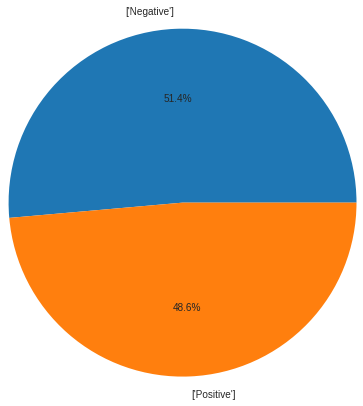

In [ ]:
#Visualizing the trend frequency with a pie chart
merck_pie_data = merck_data.groupby('Trend')
pie_label = sorted([i for i in merck_pie_data['Trend'].unique()])
plt.pie(merck_pie_data['Trend'].count(), labels=pie_label, autopct ='%.1f%%', radius = 2)
plt.show()

There were more positive trends in IBM over the years compared to negative ones. However the negative trends were at 48.8% which is almost half.

Distribution Plots

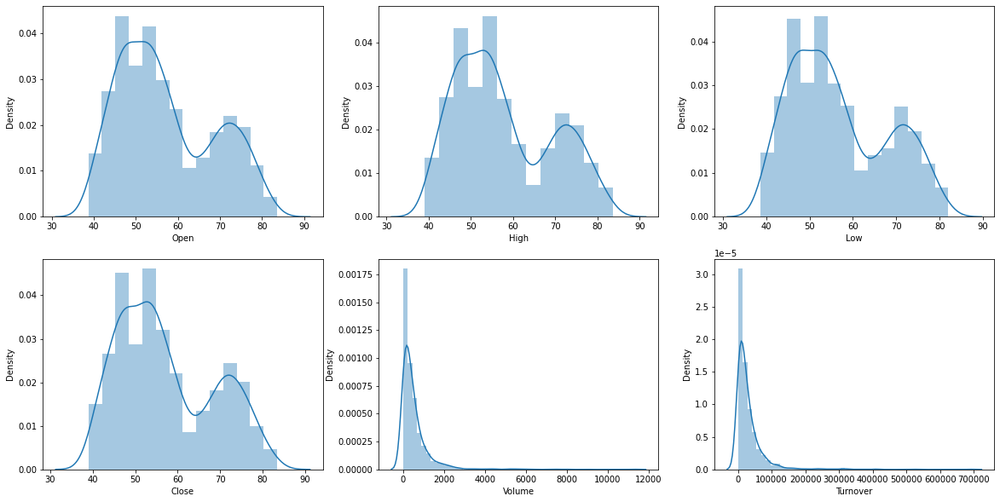

In [ ]:
#Plotting distribution plots for the variables to see the type of distribution they possess
warnings.filterwarnings("ignore")
f, axes = plt.subplots(2, 3, figsize=(20, 10), sharex=False)
sns.distplot(merck_data['Open'],ax=axes[0, 0])
sns.distplot(merck_data['High'],ax=axes[0, 1])
sns.distplot(merck_data['Low'],ax=axes[0, 2])
sns.distplot(merck_data['Close'],ax=axes[1, 0])
sns.distplot(merck_data['Volume'],ax=axes[1, 1])
sns.distplot(merck_data['Turnover'],ax=axes[1, 2])

Histograms

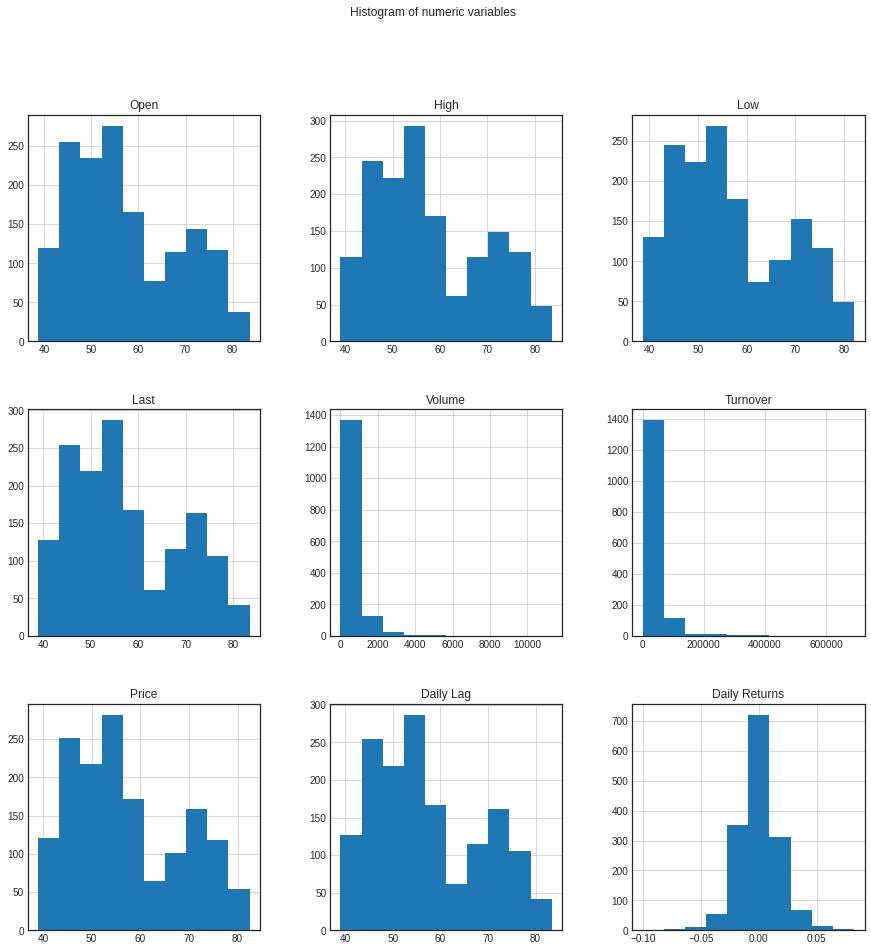

In [ ]:
#Plotting the variables on histograms to view the distribution of each variable.
merck_data.hist(bins=10, figsize=(15,15))
plt.suptitle("Histogram of numeric variables")
plt.savefig('Merck and Co Inc Histogram')
plt.show()

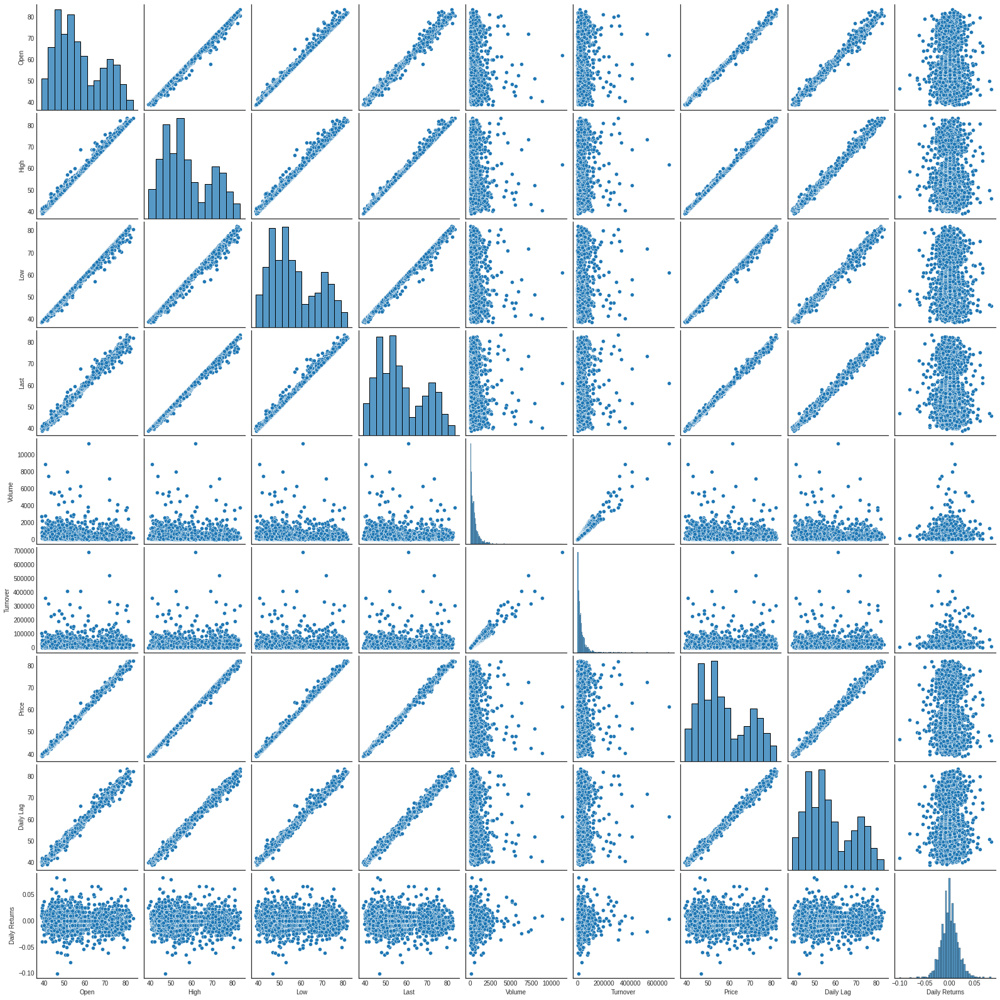

In [ ]:
#PLotting pairplots to see the relationship between variables
import seaborn as sns
sns.pairplot(merck_data)

In [ ]:
#Checking how our varibales are correlated using a matrix
corrMatrix = merck_data.corr()
corrMatrix

,Open,High,Low,Close,Volume,Turnover,Price,Daily Lag,Daily Returns
Open,1.000000,0.997133,0.997272,0.995009,-0.059556,0.078200,0.998650,0.994708,0.001483
High,0.997133,1.000000,0.995334,0.997918,-0.046673,0.092212,0.998905,0.995700,-0.019255
Low,0.997272,0.995334,1.000000,0.996603,-0.067686,0.070294,0.998581,0.994865,-0.013174
Close,0.995009,0.997918,0.996603,1.000000,-0.052985,0.086294,0.998677,0.995830,-0.038838
Volume,-0.059556,-0.046673,-0.067686,-0.052985,1.000000,0.970702,-0.056735,-0.054544,-0.008976
Turnover,0.078200,0.092212,0.070294,0.086294,0.970702,1.000000,0.081921,0.084289,-0.013027
Price,0.998650,0.998905,0.998581,0.998677,-0.056735,0.081921,1.000000,0.996571,-0.017463
Daily Lag,0.994708,0.995700,0.994865,0.995830,-0.054544,0.084289,0.996571,1.000000,0.050859
Daily Returns,0.001483,-0.019255,-0.013174,-0.038838,-0.008976,-0.013027,-0.017463,0.050859,1.000000


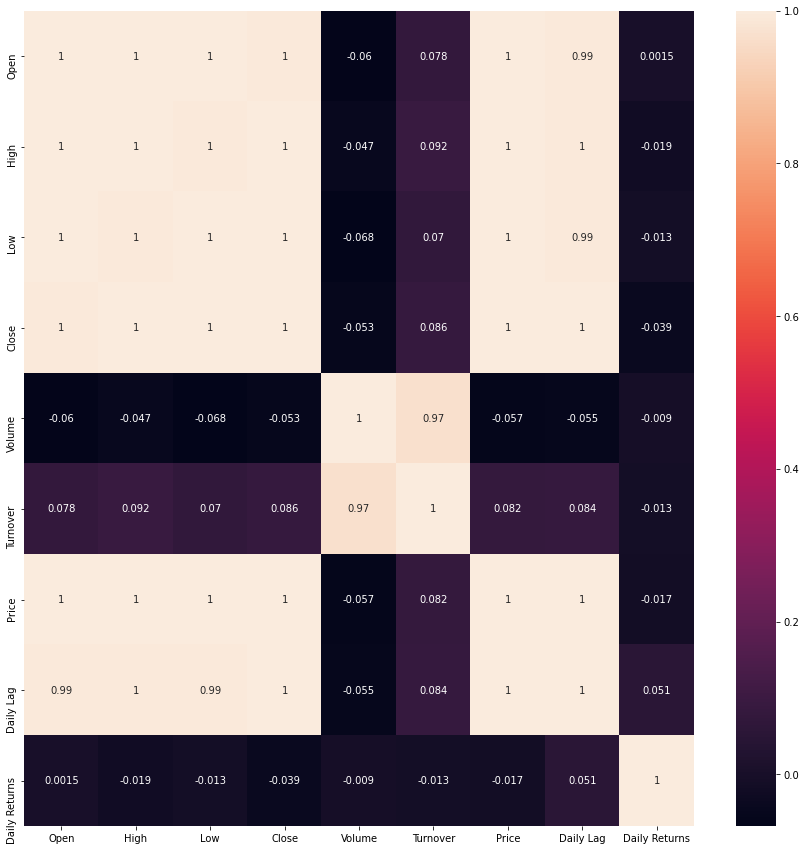

In [ ]:
#Plotting visualization of the correlation matrix for better clarity 
plt.figure(figsize=(15, 15))  
sns.heatmap(corrMatrix, annot = True)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

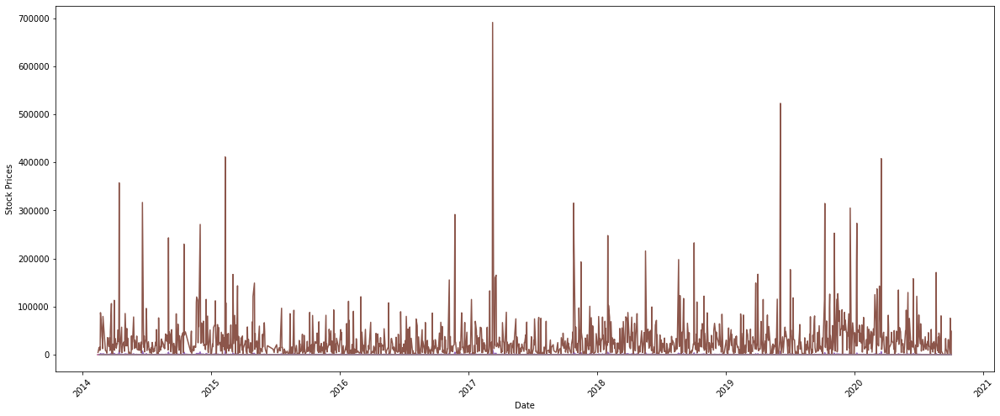

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Open',data=merck_data)
plt.plot('Date','High',data=merck_data)
plt.plot('Date','Low',data=merck_data)
plt.plot('Date','Close',data=merck_data)
plt.plot('Date','Volume',data=merck_data)
plt.plot('Date','Turnover',data=merck_data)
plt.plot('Date','Price',data=merck_data)
plt.plot('Date','Daily Returns',data=merck_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

This plots are not so clear due to the difference in values of each column. We'll plot individual columns of each column for clarity.

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

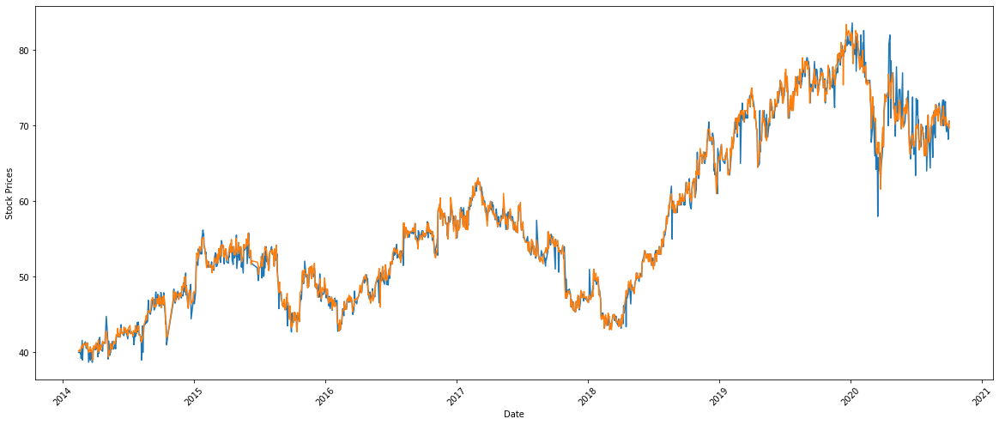

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Open',data=merck_data)
plt.plot('Date','Close',data=merck_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

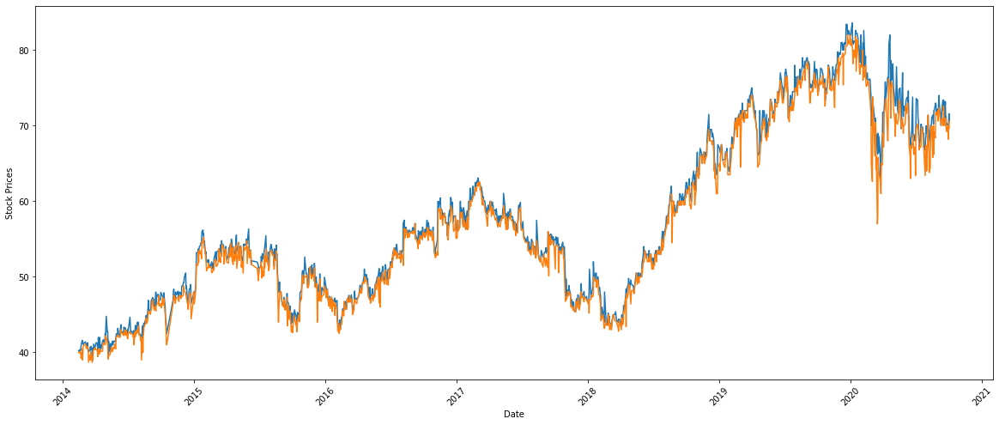

In [ ]:
#Visualizing the stock prices over the years
plt.figure(figsize=(20,8))
plt.plot('Date','High',data=merck_data)
plt.plot('Date','Low',data=merck_data)
plt.xlabel('Date')
plt.ylabel('Stock Prices')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

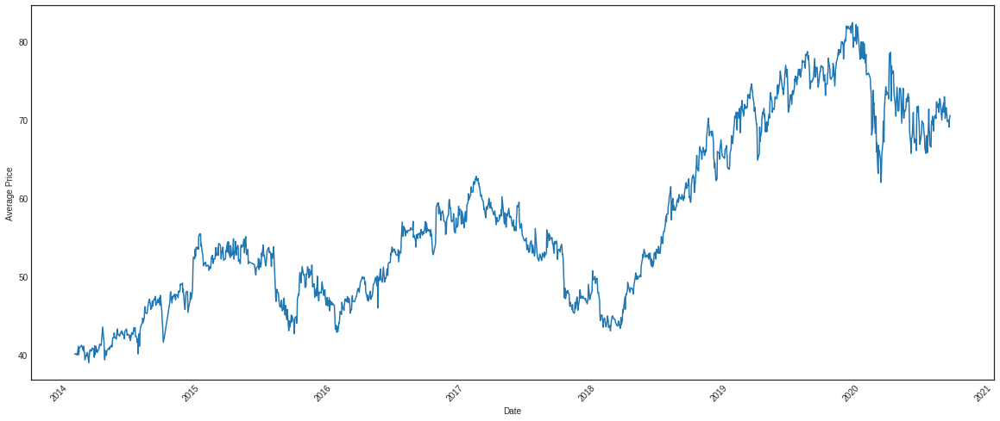

In [ ]:
#Visualizing the average price over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Price',data=merck_data)
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

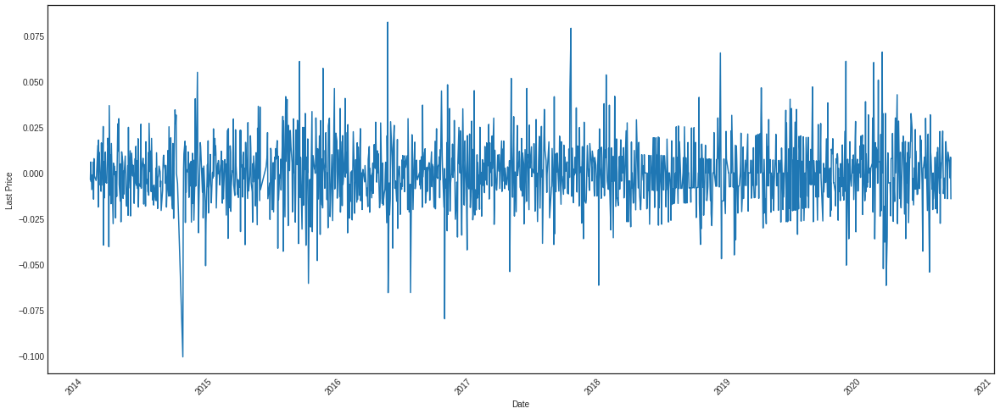

In [ ]:
#Visualizing the Daily Returns over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Daily Returns',data=merck_data)
plt.xlabel('Date')
plt.ylabel('Last Price')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

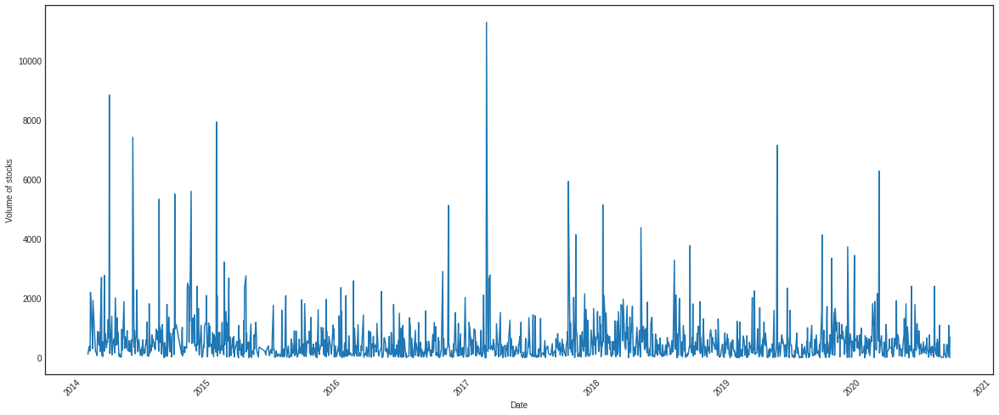

In [ ]:
#Visualizing the Volume over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Volume',data=merck_data)
plt.xlabel('Date')
plt.ylabel('Volume of stocks')
plt.xticks(rotation=45)

(array([734869., 735234., 735599., 735964., 736330., 736695., 737060.,
        737425., 737791.]), <a list of 9 Text major ticklabel objects>)

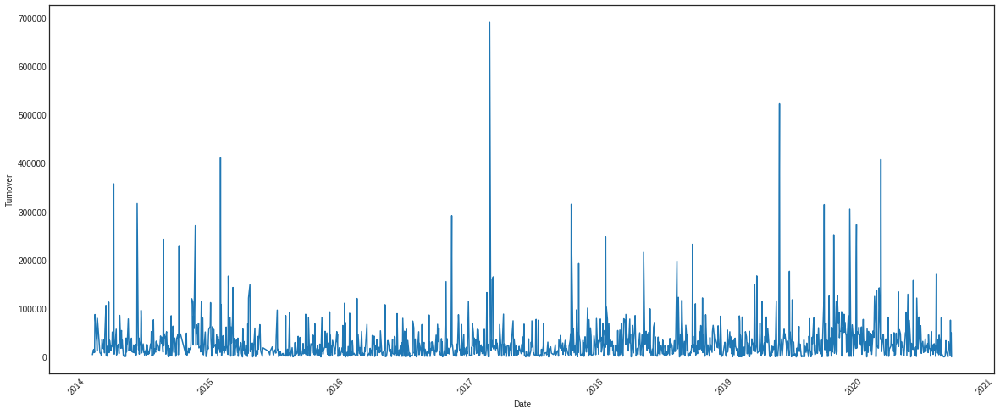

In [ ]:
#Visualizing the Turnover over the years
plt.figure(figsize=(20,8))
plt.plot('Date','Turnover',data=merck_data)
plt.xlabel('Date')
plt.ylabel('Turnover')
plt.xticks(rotation=45)

The stock prices seem to be increasing gradually over the years although there was a significant drop in 2018 then a very significant increase in 2019. However the prices decreased in 2020 and this might be attributed to the pandemic.

Candlestick charts

In [ ]:
import plotly.graph_objects as go
from datetime import datetime
fig = go.Figure(data=[go.Candlestick(x=merck_data['Date'],
                open=merck_data['Open'],
                high=merck_data['High'],
                low=merck_data['Low'],
                close=merck_data['Close'])])
fig.show()

Quarter Reports

In [ ]:
from sklearn.model_selection import train_test_split as tts
merck = merck_data[["Date","Last"]]
train, test = tts(merck, test_size = 0.3)
train_length = len(train)
print('train_length:',train_length, '\n test_length:', len(test))

train_length: 1078 
 test_length: 462


In [ ]:
#collapse-hide
alt.Chart(train.reset_index()).mark_line(point=True).encode(
    x='quarter(Date)', 
    y='Last',
    column='year(Date)',
    tooltip=['Date', 'Last']).properties(
    title="Last: Yearly Subseries plot",
    width=100).configure_header(
    titleColor='black',
    titleFontSize=14,
    labelColor='blue',
    labelFontSize=14
)

alt.Chart(...)

In [ ]:
from sklearn.model_selection import train_test_split as tts
merck = merck_data[["Date","Open"]]
train, test = tts(merck, test_size = 0.3)
train_length = len(train)
print('train_length:',train_length, '\n test_length:', len(test))

train_length: 1078 
 test_length: 462


In [ ]:
#collapse-hide
alt.Chart(train.reset_index()).mark_line(point=True).encode(
    x='quarter(Date)', 
    y='Open',
    column='year(Date)',
    tooltip=['Date', 'Open']).properties(
    title="Last: Yearly Subseries plot",
    width=100).configure_header(
    titleColor='black',
    titleFontSize=14,
    labelColor='blue',
    labelFontSize=14
)

alt.Chart(...)

MERCK AND CO INC Stock Growth and Decline Analysis

In [ ]:
merck_data["Company"] = "MERCK"
day_prices = merck_data[merck_data.Date == merck_data.Date.min()].Price
stock_name = merck_data.Company.unique()
price_mapping = {n : c for n, c in zip(stock_name, day_prices)}
base_mapping = np.array(list(map(lambda x : price_mapping[x], merck_data['Company'].values)))
merck_data['Growth'] = merck_data['Price'] / base_mapping - 1
merck_data.Growth.describe()

count    1540.000000
mean        0.426740
std         0.279625
min        -0.027431
25%         0.194794
50%         0.352868
75%         0.675810
max         1.056110
Name: Growth, dtype: float64

## Anomaly Detection

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
import numpy as np

import plotly.graph_objects as go

np.random.seed(1)
tf.random.set_seed(1)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, RepeatVector, TimeDistributed

In [ ]:
import pandas as pd
anomaly_ibm_detection['Date'] = pd.to_datetime(anomaly_ibm_detection['Date'])

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=anomaly_ibm_detection['Date'], y=anomaly_ibm_detection['Last'], name='Last price'))
fig.update_layout(showlegend=True, title='IBM Stock Prices')
fig.show()

In [ ]:
train, test = anomaly_ibm_detection.loc[anomaly_ibm_detection['Date'] <= '2019-12-31'], anomaly_ibm_detection.loc[anomaly_ibm_detection['Date'] > '2020-01-01']
train.shape, test.shape

((72, 2), (22, 2))

In [ ]:
scaler = StandardScaler()
scaler = scaler.fit(train[['Last']])

train['Last'] = scaler.transform(train[['Last']])
test['Last'] = scaler.transform(test[['Last']])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
TIME_STEPS=5

def create_sequences(X, y, time_steps=TIME_STEPS):
    Xs, ys = [], []
    for i in range(len(X)-time_steps):
        Xs.append(X.iloc[i:(i+time_steps)].values)
        ys.append(y.iloc[i+time_steps])
    
    return np.array(Xs), np.array(ys)

X_train, y_train = create_sequences(train[['Last']], train['Last'])
X_test, y_test = create_sequences(test[['Last']], test['Last'])

print(f'Training shape: {X_train.shape}')
print(f'Testing shape: {X_test.shape}')

Training shape: (67, 5, 1)
Testing shape: (17, 5, 1)


In [ ]:
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(rate=0.2))
model.add(RepeatVector(X_train.shape[1]))
model.add(LSTM(128, return_sequences=True))
model.add(Dropout(rate=0.2))
model.add(TimeDistributed(Dense(X_train.shape[2])))
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 128)               66560     
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
repeat_vector (RepeatVector) (None, 5, 128)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 5, 128)            131584    
_________________________________________________________________
dropout_1 (Dropout)          (None, 5, 128)            0         
_________________________________________________________________
time_distributed (TimeDistri (None, 5, 1)              129       
Total params: 198,273
Trainable params: 198,273
Non-trainable params: 0
__________________________________________________

In [ ]:
history = model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.1,
                    callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)


Epoch 1/5
2/2 [==============================] - 0s 31ms/step - loss: 0.5163 - val_loss: 0.5232
Epoch 2/5
2/2 [==============================] - 0s 17ms/step - loss: 0.5119 - val_loss: 0.5232
Epoch 3/5
2/2 [==============================] - 0s 15ms/step - loss: 0.5100 - val_loss: 0.5189
Epoch 4/5
2/2 [==============================] - 0s 17ms/step - loss: 0.5143 - val_loss: 0.5087
Epoch 5/5
2/2 [==============================] - 0s 18ms/step - loss: 0.5075 - val_loss: 0.4950


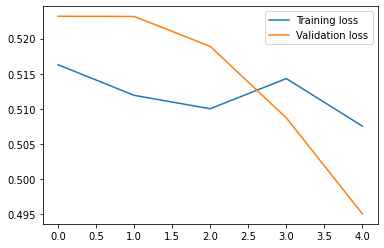

In [ ]:
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend();

In [ ]:
model.evaluate(X_test, y_test)

1/1 [==============================] - 0s 2ms/step - loss: 0.5261


0.526131272315979

Reconstruction error threshold: 1.7884321114351327


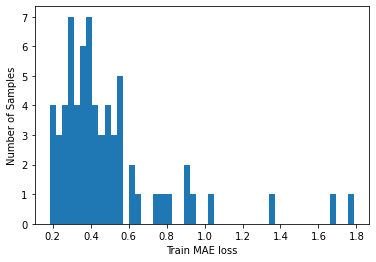

In [ ]:
X_train_pred = model.predict(X_train, verbose=0)
train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel('Train MAE loss')
plt.ylabel('Number of Samples');

threshold = np.max(train_mae_loss)
print(f'Reconstruction error threshold: {threshold}')

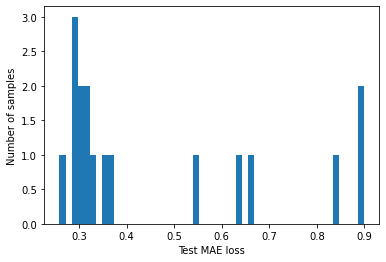

In [ ]:
X_test_pred = model.predict(X_test, verbose=0)
test_mae_loss = np.mean(np.abs(X_test_pred-X_test), axis=1)

plt.hist(test_mae_loss, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of samples');

In [ ]:
test_score_df = pd.DataFrame(test[TIME_STEPS:])
test_score_df['loss'] = test_mae_loss
test_score_df['threshold'] = threshold
test_score_df['anomaly'] = test_score_df['loss'] > test_score_df['threshold']
test_score_df['Last'] = test[TIME_STEPS:]['Last']

fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Date'], y=test_score_df['loss'], name='Test loss'))
fig.add_trace(go.Scatter(x=test_score_df['Date'], y=test_score_df['threshold'], name='Threshold'))
fig.update_layout(showlegend=True, title='Test loss vs. Threshold')
fig.show()

In [ ]:
anomalies = test_score_df.loc[test_score_df['anomaly'] == True]
anomalies.shape

(0, 5)

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Date'], y=scaler.inverse_transform(test_score_df['Last']), name='Close price'))
fig.add_trace(go.Scatter(x=anomalies['Date'], y=scaler.inverse_transform(anomalies['Last']), mode='markers', name='Anomaly'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

There are no anomalies on the IBM Dataset. 

### LVMH

In [ ]:
#Visualizing the last stock prices.
fig = go.Figure()
fig.add_trace(go.Scatter(x=anomaly_lvmh_detection['Date'], y=anomaly_lvmh_detection['Last'], name='Close price'))
fig.update_layout(showlegend=True, title='LVMH Stock Prices')
fig.show()

In [ ]:
#Creating the train and test set
train, test = anomaly_lvmh_detection.loc[anomaly_lvmh_detection['Date'] <= '2019-12-31'], anomaly_lvmh_detection.loc[anomaly_lvmh_detection['Date'] > '2020-01-01']
train.shape, test.shape

((1471, 2), (191, 2))

In [ ]:
#Scaling the data
scaler = StandardScaler()
scaler = scaler.fit(train[['Last']])

train['Last'] = scaler.transform(train[['Last']])
test['Last'] = scaler.transform(test[['Last']])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Convert input data into 3-D array combining TIME_STEPS. The shape of the array should be Samples, Time steps and Features as required for LSTM network.


Setting the network to be a memory of 30 days.

In [ ]:
TIME_STEPS=30

def create_sequences(X, y, time_steps=TIME_STEPS):
    Xs, ys = [], []
    for i in range(len(X)-time_steps):
        Xs.append(X.iloc[i:(i+time_steps)].values)
        ys.append(y.iloc[i+time_steps])
    
    return np.array(Xs), np.array(ys)

X_train, y_train = create_sequences(train[['Last']], train['Last'])
X_test, y_test = create_sequences(test[['Last']], test['Last'])

print(f'Training shape: {X_train.shape}')
print(f'Testing shape: {X_test.shape}')

Training shape: (1441, 30, 1)
Testing shape: (161, 30, 1)


We define the reconstruction LSTM Autoencoder architecture that expects input sequences with 30 time steps and one feature and outputs a sequence with 30 time steps and one feature.

In [ ]:
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(rate=0.2))
model.add(RepeatVector(X_train.shape[1]))
model.add(LSTM(128, return_sequences=True))
model.add(Dropout(rate=0.2))
model.add(TimeDistributed(Dense(X_train.shape[2])))
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 128)               66560     
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
repeat_vector_1 (RepeatVecto (None, 30, 128)           0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 30, 128)           131584    
_________________________________________________________________
dropout_3 (Dropout)          (None, 30, 128)           0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, 30, 1)             129       
Total params: 198,273
Trainable params: 198,273
Non-trainable params: 0
________________________________________________

In [ ]:
#Training the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1,
                    callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)


Epoch 1/100
41/41 [==============================] - 4s 86ms/step - loss: 0.2433 - val_loss: 0.3230
Epoch 2/100
41/41 [==============================] - 3s 69ms/step - loss: 0.2138 - val_loss: 0.1528
Epoch 3/100
41/41 [==============================] - 3s 69ms/step - loss: 0.1414 - val_loss: 0.2418
Epoch 4/100
41/41 [==============================] - 3s 69ms/step - loss: 0.1018 - val_loss: 0.1803
Epoch 5/100
41/41 [==============================] - 3s 68ms/step - loss: 0.1200 - val_loss: 0.2350


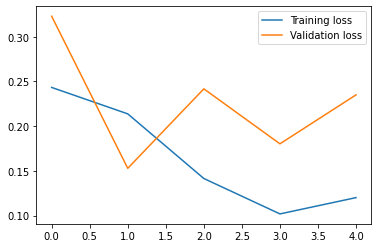

In [ ]:
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend();

In [ ]:
model.evaluate(X_test, y_test)

6/6 [==============================] - 0s 14ms/step - loss: 0.2631


0.26312851905822754

Reconstruction error threshold: 0.5266583763660789


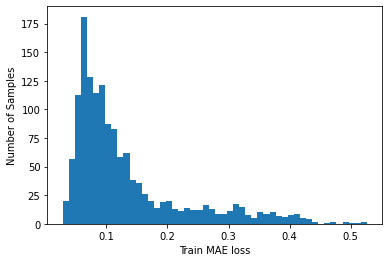

In [ ]:
X_train_pred = model.predict(X_train, verbose=0)
train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel('Train MAE loss')
plt.ylabel('Number of Samples');

threshold = np.max(train_mae_loss)
print(f'Reconstruction error threshold: {threshold}')

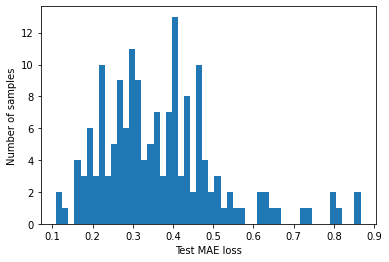

In [ ]:
X_test_pred = model.predict(X_test, verbose=0)
test_mae_loss = np.mean(np.abs(X_test_pred-X_test), axis=1)

plt.hist(test_mae_loss, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of samples');

In [ ]:
test_score_df = pd.DataFrame(test[TIME_STEPS:])
test_score_df['loss'] = test_mae_loss
test_score_df['threshold'] = threshold
test_score_df['anomaly'] = test_score_df['loss'] > test_score_df['threshold']
test_score_df['Last'] = test[TIME_STEPS:]['Last']

fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Date'], y=test_score_df['loss'], name='Test loss'))
fig.add_trace(go.Scatter(x=test_score_df['Date'], y=test_score_df['threshold'], name='Threshold'))
fig.update_layout(showlegend=True, title='Test loss vs. Threshold')
fig.show()

In [ ]:
#Getting the number of anomalies in the dataset.
anomalies = test_score_df.loc[test_score_df['anomaly'] == True]
anomalies.shape

(17, 5)

There is 17 anomalies in the LVMH dataset.

In [ ]:
#Visualizing the anomalies.
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Date'], y=scaler.inverse_transform(test_score_df['Last']), name='Close price'))
fig.add_trace(go.Scatter(x=anomalies['Date'], y=scaler.inverse_transform(anomalies['Last']), mode='markers', name='Anomaly'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()

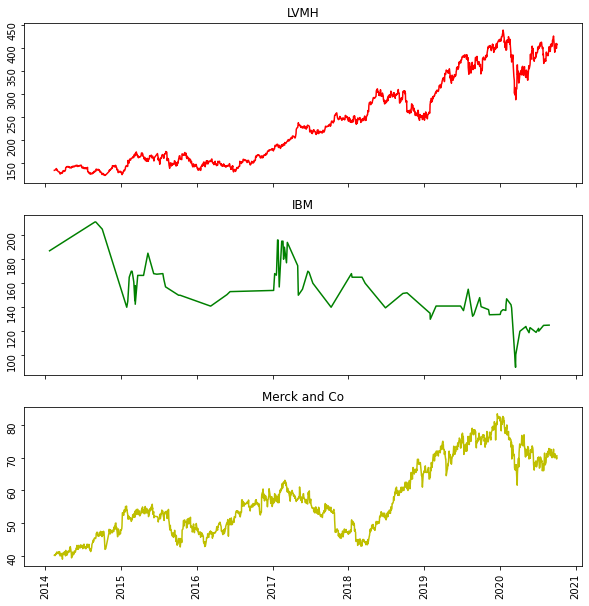

In [ ]:
# subplots
f, ax = plt.subplots(3, figsize = (10,10), sharex = True)
f.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
f.gca().xaxis.set_major_locator(mdates.YearLocator())

#plotting
ax[0].plot(lvmh_data.index, lvmh_data["Last"], color = 'r')
#ax[0].grid(True)
ax[0].tick_params(labelrotation = 90)
ax[0].set_title('LVMH');

ax[1].plot(ibm_data.index, ibm_data["Last"], color = 'g')
#ax[1].grid(True)
ax[1].tick_params(labelrotation=90)
ax[1].set_title('IBM');

ax[2].plot(merck_data.index, merck_data["Last"], color = 'y')
#ax[2].grid(True)
ax[2].tick_params(labelrotation=90)
ax[2].set_title('Merck and Co');

We observe an upward trend in the LVMH and Merck and Co stocks while the IBM stock seems to have a stationary trend i.e it is neither increasing nor decreasing

### Zooming In

We will zoom in the stock prices for all the three companies to observe their yearly trends 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
# load lvmh data
lvmh_data = quandl.get('EURONEXT/MC')

#load ibm data
ibm_data = quandl.get('EURONEXT/IBMA')

#load merck data
merck_data = quandl.get('EURONEXT/MRK')

#previewing
lvmh_data.head(3)

,Open,High,Low,Last,Volume,Turnover
Date,,,,,,
2014-02-14,133.95,135.05,132.75,134.80,884136.0,1.189604e+08
2014-02-17,135.50,135.75,134.85,135.20,453221.0,6.131023e+07
2014-02-18,135.65,136.10,134.80,135.75,682066.0,9.245102e+07


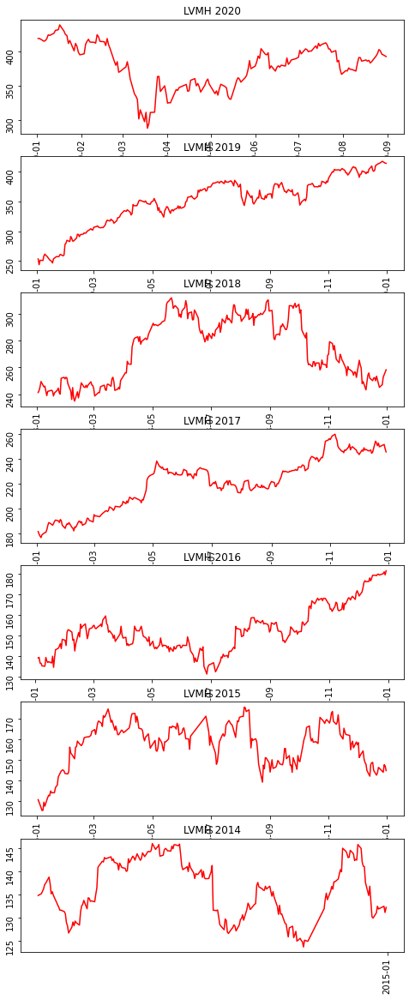

In [ ]:
# subplots
f, ax = plt.subplots(7, figsize = (8,20), sharex = False)
f.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
f.gca().xaxis.set_major_locator(mdates.YearLocator())

# zooming in the closing stock prices for lvmh for the year 2020
lvmh_20 = lvmh_data.loc[pd.Timestamp('2020-01-01'):pd.Timestamp('2020-08-31')]
ax[0].plot(lvmh_20.index, lvmh_20['Last'], color='r')
ax[0].tick_params(rotation=90)
ax[0].set_title('LVMH 2020');


# zooming in the closing stock prices for lvmh for the year 2019
lvmh_19 = lvmh_data.loc[pd.Timestamp('2019-01-01'):pd.Timestamp('2019-12-31')]
ax[1].plot(lvmh_19.index, lvmh_19['Last'], color='r')
ax[1].tick_params(rotation=90)
ax[1].set_title('LVMH 2019');

# zooming in the closing stock prices for lvmh for the year 2018
lvmh_18 = lvmh_data.loc[pd.Timestamp('2018-01-01'):pd.Timestamp('2018-12-31')]
ax[2].plot(lvmh_18.index, lvmh_18['Last'], color='r')
ax[2].tick_params(rotation=90)
ax[2].set_title('LVMH 2018');

# zooming in the closing stock prices for lvmh for the year 2017
lvmh_17 = lvmh_data.loc[pd.Timestamp('2017-01-01'):pd.Timestamp('2017-12-31')]
ax[3].plot(lvmh_17.index, lvmh_17['Last'], color='r')
ax[3].tick_params(rotation=90)
ax[3].set_title('LVMH 2017');

# zooming in the closing stock prices for lvmh for the year 2016
lvmh_16 = lvmh_data.loc[pd.Timestamp('2016-01-01'):pd.Timestamp('2016-12-31')]
ax[4].plot(lvmh_16.index, lvmh_16['Last'], color='r')
ax[4].tick_params(rotation=90)
ax[4].set_title('LVMH 2016');

# zooming in the closing stock prices for lvmh for the year 2015
lvmh_15 = lvmh_data.loc[pd.Timestamp('2015-01-01'):pd.Timestamp('2015-12-31')]
ax[5].plot(lvmh_15.index, lvmh_15['Last'], color='r')
ax[5].tick_params(rotation=90)
ax[5].set_title('LVMH 2015');

# zooming in the closing stock prices for lvmh for the year 2014
lvmh_14 = lvmh_data.loc[pd.Timestamp('2014-01-01'):pd.Timestamp('2014-12-31')]
ax[6].plot(lvmh_14.index, lvmh_14['Last'], color='r')
ax[6].tick_params(rotation=90)
ax[6].set_title('LVMH 2014');

For the LVMH data, the years 2019 and 2017 recorded upward trends throughout while the rest of the years show both upward and downward trends. In general, stock prices have rised from 130 to 400 in the 6 years.

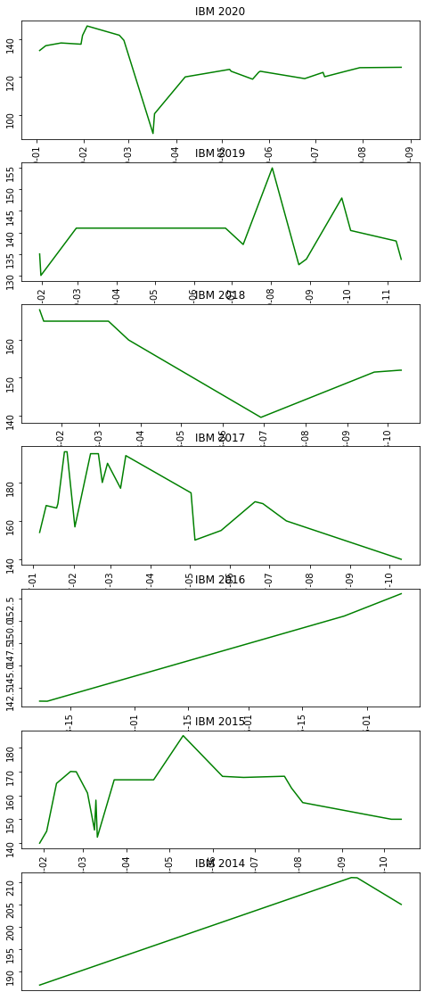

In [ ]:
# subplots
f, ax = plt.subplots(7, figsize = (8,20), sharex = False)
f.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
f.gca().xaxis.set_major_locator(mdates.YearLocator())

# zooming in the closing stock prices for IBM for the year 2020
ibm_20 = ibm_data.loc[pd.Timestamp('2020-01-01'):pd.Timestamp('2020-08-31')]
ax[0].plot(ibm_20.index, ibm_20['Last'], color='g')
ax[0].tick_params(rotation=90)
ax[0].set_title('IBM 2020');


# zooming in the closing stock prices for ibm for the year 2019
ibm_19 = ibm_data.loc[pd.Timestamp('2019-01-01'):pd.Timestamp('2019-12-31')]
ax[1].plot(ibm_19.index, ibm_19['Last'], color='g')
ax[1].tick_params(rotation=90)
ax[1].set_title('IBM 2019');

# zooming in the closing stock prices for ibm for the year 2018
ibm_18 = ibm_data.loc[pd.Timestamp('2018-01-01'):pd.Timestamp('2018-12-31')]
ax[2].plot(ibm_18.index, ibm_18['Last'], color='g')
ax[2].tick_params(rotation=90)
ax[2].set_title('IBM 2018');

# zooming in the closing stock prices for ibm for the year 2017
ibm_17 = ibm_data.loc[pd.Timestamp('2017-01-01'):pd.Timestamp('2017-12-31')]
ax[3].plot(ibm_17.index, ibm_17['Last'], color='g')
ax[3].tick_params(rotation=90)
ax[3].set_title('IBM 2017');

# zooming in the closing stock prices for ibm for the year 2016
ibm_16 = ibm_data.loc[pd.Timestamp('2016-01-01'):pd.Timestamp('2016-12-31')]
ax[4].plot(ibm_16.index, ibm_16['Last'], color='g')
ax[4].tick_params(rotation=90)
ax[4].set_title('IBM 2016');

# zooming in the closing stock prices for ibm for the year 2015
ibm_15 = ibm_data.loc[pd.Timestamp('2015-01-01'):pd.Timestamp('2015-12-31')]
ax[5].plot(ibm_15.index, ibm_15['Last'], color='g')
ax[5].tick_params(rotation=90)
ax[5].set_title('IBM 2015');

# zooming in the closing stock prices for ibm for the year 2014
ibm_14 = ibm_data.loc[pd.Timestamp('2014-01-01'):pd.Timestamp('2014-12-31')]
ax[6].plot(ibm_14.index, ibm_14['Last'], color='g')
ax[6].tick_params(rotation=90)
ax[6].set_title('IBM 2014');

The year 2016 recorded an upward tren throughout while there have been fluctuating patterns recorded for the rest of the years. Over the years, the stock prices seem to have decreased with 2014 recording the highest price at 210 and 2020 recording very low prices

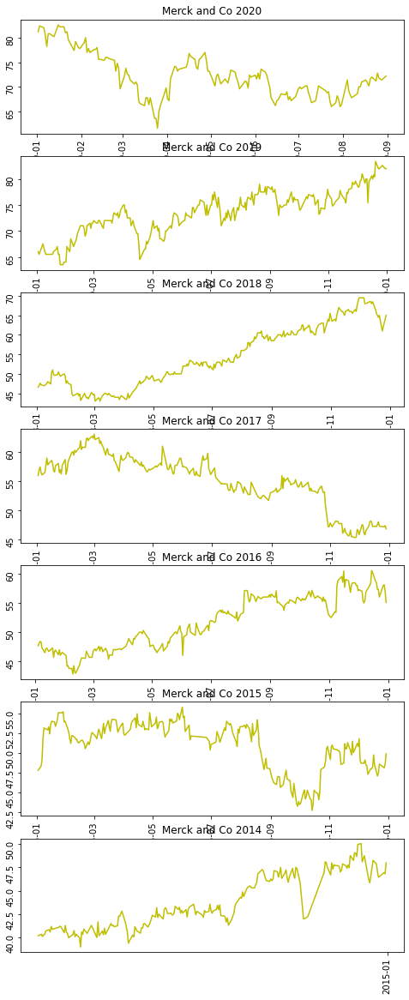

In [ ]:
# subplots
f, ax = plt.subplots(7, figsize = (8,20), sharex = False)
f.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
f.gca().xaxis.set_major_locator(mdates.YearLocator())

# zooming in the closing stock prices for merck and Co for the year 2020
merck_20 = merck_data.loc[pd.Timestamp('2020-01-01'):pd.Timestamp('2020-08-31')]
ax[0].plot(merck_20.index, merck_20['Last'], color='y')
ax[0].tick_params(rotation=90)
ax[0].set_title('Merck and Co 2020');


# zooming in the closing stock prices for Merck and Co for the year 2019
merck_19 = merck_data.loc[pd.Timestamp('2019-01-01'):pd.Timestamp('2019-12-31')]
ax[1].plot(merck_19.index, merck_19['Last'], color='y')
ax[1].tick_params(rotation=90)
ax[1].set_title('Merck and Co 2019');

# zooming in the closing stock prices for Merck and Co for the year 2018
merck_18 = merck_data.loc[pd.Timestamp('2018-01-01'):pd.Timestamp('2018-12-31')]
ax[2].plot(merck_18.index, merck_18['Last'], color='y')
ax[2].tick_params(rotation=90)
ax[2].set_title('Merck and Co 2018');

# zooming in the closing stock prices for Merck and Co for the year 2017
merck_17 = merck_data.loc[pd.Timestamp('2017-01-01'):pd.Timestamp('2017-12-31')]
ax[3].plot(merck_17.index, merck_17['Last'], color='y')
ax[3].tick_params(rotation=90)
ax[3].set_title('Merck and Co 2017');

# zooming in the closing stock prices for Merck and Co for the year 2016
merck_16 = merck_data.loc[pd.Timestamp('2016-01-01'):pd.Timestamp('2016-12-31')]
ax[4].plot(merck_16.index, merck_16['Last'], color='y')
ax[4].tick_params(rotation=90)
ax[4].set_title('Merck and Co 2016');

# zooming in the closing stock prices for Merck and Co for the year 2015
merck_15 = merck_data.loc[pd.Timestamp('2015-01-01'):pd.Timestamp('2015-12-31')]
ax[5].plot(merck_15.index, merck_15['Last'], color='y')
ax[5].tick_params(rotation=90)
ax[5].set_title('Merck and Co 2015');

# zooming in the closing stock prices for Merck and Co for the year 2014
merck_14 = merck_data.loc[pd.Timestamp('2014-01-01'):pd.Timestamp('2014-12-31')]
ax[6].plot(merck_14.index, merck_14['Last'], color='y')
ax[6].tick_params(rotation=90)
ax[6].set_title('Merck and Co 2014');

Merck and Co stocks have been doing very well over the years. The years 2014, 2016, 2018 and 2019 have recorded upward trends while the rest of the years did not really record a stable trend. The stocks prices have generally increased over time, starting from a unit price of 40 to 80

### Resampling weekly

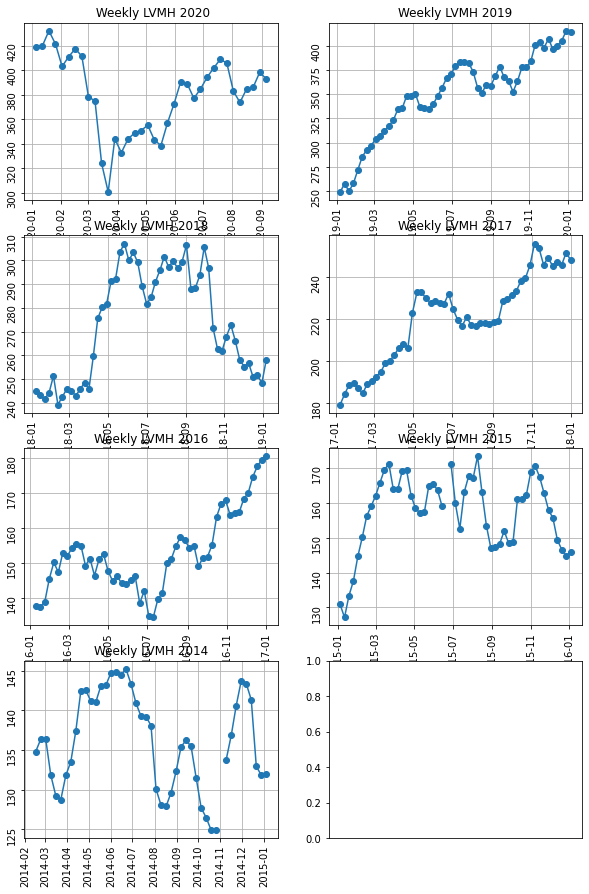

In [ ]:
#sampling lvmh stocks weekly

# subplots
f, ax = plt.subplots(4,2, figsize = (10,15), sharex = False)
f.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
f.gca().xaxis.set_major_locator(mdates.YearLocator())

# zooming in the closing stock prices for LVMH for the year 2020
weekly_lvmh_20 = lvmh_20.resample('W').mean()
ax[0,0].plot(weekly_lvmh_20.index, weekly_lvmh_20['Last'], '-o')
ax[0,0].grid(True)
ax[0,0].tick_params(rotation=90)
ax[0,0].set_title(' Weekly LVMH 2020');


# zooming in the closing stock prices for LVMH for the year 2019
weekly_lvmh_19 = lvmh_19.resample('W').mean()
ax[0,1].plot(weekly_lvmh_19.index, weekly_lvmh_19['Last'], '-o')
ax[0,1].grid(True)
ax[0,1].tick_params(rotation=90)
ax[0,1].set_title('Weekly LVMH 2019');

# zooming in the closing stock prices for LVMH for the year 2018
weekly_lvmh_18 = lvmh_18.resample('W').mean()
ax[1,0].grid(True)
ax[1,0].plot(weekly_lvmh_18.index, weekly_lvmh_18['Last'], '-o')
ax[1,0].tick_params(rotation=90)
ax[1,0].set_title('Weekly LVMH 2018');

# zooming in the closing stock prices for LVMH for the year 2017
weekly_lvmh_17 = lvmh_17.resample('W').mean()
ax[1,1].grid(True)
ax[1,1].plot(weekly_lvmh_17.index, weekly_lvmh_17['Last'], '-o')
ax[1,1].tick_params(rotation=90)
ax[1,1].set_title('Weekly LVMH 2017');

# zooming in the closing stock prices for LVMH for the year 2016
weekly_lvmh_16 = lvmh_16.resample('W').mean()
ax[2,0].plot(weekly_lvmh_16.index, weekly_lvmh_16['Last'], '-o')
ax[2,0].grid(True)
ax[2,0].tick_params(rotation=90)
ax[2,0].set_title('Weekly LVMH 2016');

# zooming in the closing stock prices for LVMH for the year 2015
weekly_lvmh_15 = lvmh_15.resample('W').mean()
ax[2,1].plot(weekly_lvmh_15.index, weekly_lvmh_15['Last'], '-o')
ax[2,1].grid(True)
ax[2,1].tick_params(rotation=90)
ax[2,1].set_title('Weekly LVMH 2015');

# zooming in the closing stock prices for LVMH for the year 2014
weekly_lvmh_14 = lvmh_14.resample('W').mean()
ax[3,0].plot(weekly_lvmh_14.index, weekly_lvmh_14['Last'], '-o')
ax[3,0].grid(True)
ax[3,0].tick_params(rotation=90)
ax[3,0].set_title('Weekly LVMH 2014');

From the weekly plots, the performance of the stocks can easily be monitored. It is clear that trading of the lvmh stocks has been very consistent excpet for the year 2014 where there was no trading for some time between November and December.

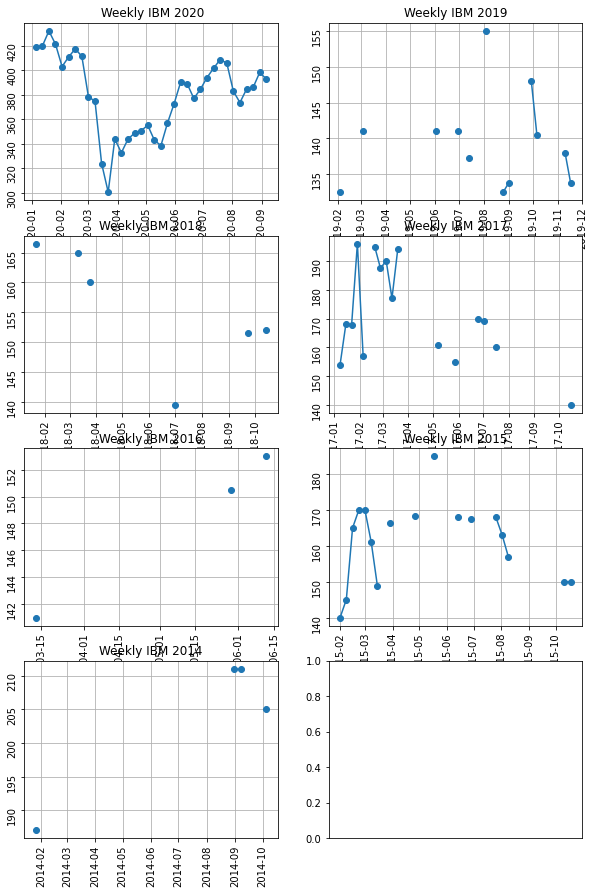

In [ ]:
#sampling ibm stocks weekly

# subplots
f, ax = plt.subplots(4,2, figsize = (10,15), sharex = False)
f.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
f.gca().xaxis.set_major_locator(mdates.YearLocator())

# zooming in the closing stock prices for IBM for the year 2020
weekly_ibm_20 = ibm_20.resample('W').mean()
ax[0,0].plot(weekly_lvmh_20.index, weekly_lvmh_20['Last'], '-o')
ax[0,0].grid(True)
ax[0,0].tick_params(rotation=90)
ax[0,0].set_title(' Weekly IBM 2020');


# zooming in the closing stock prices for IBM for the year 2019
weekly_ibm_19 = ibm_19.resample('W').mean()
ax[0,1].plot(weekly_ibm_19.index, weekly_ibm_19['Last'], '-o')
ax[0,1].grid(True)
ax[0,1].tick_params(rotation=90)
ax[0,1].set_title('Weekly IBM 2019');

# zooming in the closing stock prices for IBM for the year 2018
weekly_ibm_18 = ibm_18.resample('W').mean()
ax[1,0].grid(True)
ax[1,0].plot(weekly_ibm_18.index, weekly_ibm_18['Last'], '-o')
ax[1,0].tick_params(rotation=90)
ax[1,0].set_title('Weekly IBM 2018');

# zooming in the closing stock prices for IBM for the year 2017
weekly_ibm_17 = ibm_17.resample('W').mean()
ax[1,1].grid(True)
ax[1,1].plot(weekly_ibm_17.index, weekly_ibm_17['Last'], '-o')
ax[1,1].tick_params(rotation=90)
ax[1,1].set_title('Weekly IBM 2017');

# zooming in the closing stock prices for IBM for the year 2016
weekly_ibm_16 = ibm_16.resample('W').mean()
ax[2,0].plot(weekly_ibm_16.index, weekly_ibm_16['Last'], '-o')
ax[2,0].grid(True)
ax[2,0].tick_params(rotation=90)
ax[2,0].set_title('Weekly IBM 2016');

# zooming in the closing stock prices for IBM for the year 2015
weekly_ibm_15 = ibm_15.resample('W').mean()
ax[2,1].plot(weekly_ibm_15.index, weekly_ibm_15['Last'], '-o')
ax[2,1].grid(True)
ax[2,1].tick_params(rotation=90)
ax[2,1].set_title('Weekly IBM 2015');

# zooming in the closing stock prices for IBM for the year 2014
weekly_ibm_14 = ibm_14.resample('W').mean()
ax[3,0].plot(weekly_ibm_14.index, weekly_ibm_14['Last'], '-o')
ax[3,0].grid(True)
ax[3,0].tick_params(rotation=90)
ax[3,0].set_title('Weekly IBM 2014');

From the above plot, it is clear that the trading of the IBM stock has not been as consistent, this explains why the IBM dataset is very small. 

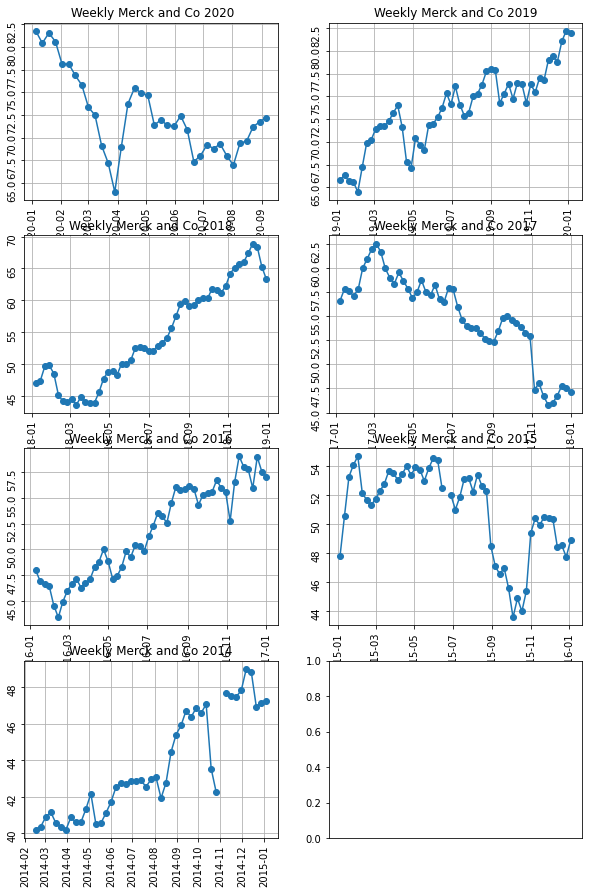

In [ ]:
#sampling merck and co stocks weekly

# subplots
f, ax = plt.subplots(4,2, figsize = (10,15), sharex = False)
f.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
f.gca().xaxis.set_major_locator(mdates.YearLocator())

# zooming in the closing stock prices for merck and Co for the year 2020
#merck_20 = merck_data.loc[pd.Timestamp('2020-01-01'):pd.Timestamp('2020-08-31')]
weekly_merck_20 = merck_20.resample('W').mean()
ax[0,0].plot(weekly_merck_20.index, weekly_merck_20['Last'], '-o')
ax[0,0].grid(True)
ax[0,0].tick_params(rotation=90)
ax[0,0].set_title(' Weekly Merck and Co 2020');


# zooming in the closing stock prices for Merck and Co for the year 2019
#merck_19 = merck_data.loc[pd.Timestamp('2019-01-01'):pd.Timestamp('2019-12-31')]
weekly_merck_19 = merck_19.resample('W').mean()
ax[0,1].plot(weekly_merck_19.index, weekly_merck_19['Last'], '-o')
ax[0,1].grid(True)
ax[0,1].tick_params(rotation=90)
ax[0,1].set_title('Weekly Merck and Co 2019');

# zooming in the closing stock prices for Merck and Co for the year 2018
#merck_18 = merck_data.loc[pd.Timestamp('2018-01-01'):pd.Timestamp('2018-12-31')]
weekly_merck_18 = merck_18.resample('W').mean()
ax[1,0].grid(True)
ax[1,0].plot(weekly_merck_18.index, weekly_merck_18['Last'], '-o')
ax[1,0].tick_params(rotation=90)
ax[1,0].set_title('Weekly Merck and Co 2018');

# zooming in the closing stock prices for Merck and Co for the year 2017
#merck_17 = merck_data.loc[pd.Timestamp('2017-01-01'):pd.Timestamp('2017-12-31')]
weekly_merck_17 = merck_17.resample('W').mean()
ax[1,1].grid(True)
ax[1,1].plot(weekly_merck_17.index, weekly_merck_17['Last'], '-o')
ax[1,1].tick_params(rotation=90)
ax[1,1].set_title('Weekly Merck and Co 2017');

# zooming in the closing stock prices for Merck and Co for the year 2016
#merck_16 = merck_data.loc[pd.Timestamp('2016-01-01'):pd.Timestamp('2016-12-31')]
weekly_merck_16 = merck_16.resample('W').mean()
ax[2,0].plot(weekly_merck_16.index, weekly_merck_16['Last'], '-o')
ax[2,0].grid(True)
ax[2,0].tick_params(rotation=90)
ax[2,0].set_title('Weekly Merck and Co 2016');

# zooming in the closing stock prices for Merck and Co for the year 2015
#merck_15 = merck_data.loc[pd.Timestamp('2015-01-01'):pd.Timestamp('2015-12-31')]
weekly_merck_15 = merck_15.resample('W').mean()
ax[2,1].plot(weekly_merck_15.index, weekly_merck_15['Last'], '-o')
ax[2,1].grid(True)
ax[2,1].tick_params(rotation=90)
ax[2,1].set_title('Weekly Merck and Co 2015');

# zooming in the closing stock prices for Merck and Co for the year 2014
#merck_14 = merck_data.loc[pd.Timestamp('2014-01-01'):pd.Timestamp('2014-12-31')]
weekly_merck_14 = merck_14.resample('W').mean()
ax[3,0].plot(weekly_merck_14.index, weekly_merck_14['Last'], '-o')
ax[3,0].grid(True)
ax[3,0].tick_params(rotation=90)
ax[3,0].set_title('Weekly Merck and Co 2014');

Merck and Co has recorded consistent trading throughout the years except for the year 2014 where we don't have data between the month of November and December

### Volatility

The volatility of a stock is the measurement of the change in variance in the returns of a stock over a specific period of time. Here, we compare the volatility of a stock with another stock to get a feel for which may have less risk or to a market index to examine the stocks volatility to examine the overall market. Generally, the higher the volatility, the riskier the investment in that stock

#### Daily Percentages

In [ ]:
#daily percentages for lvmh stock
daily_close_lvmh = lvmh_data[['Last']]
# daily returns
daily_pct_change_lvmh = daily_close_lvmh.pct_change()
# replace NA values with 0
daily_pct_change_lvmh.fillna(0, inplace=True)

#daily percentages for ibm stock
daily_close_ibm = ibm_data[['Last']]
# daily returns
daily_pct_change_ibm = daily_close_ibm.pct_change()
# replace NA values with 0
daily_pct_change_ibm.fillna(0, inplace=True)

#daily percentages for merck and co stock
daily_close_merck = merck_data[['Last']]
# daily returns
daily_pct_change_merck = daily_close_merck.pct_change()
# replace NA values with 0
daily_pct_change_merck.fillna(0, inplace=True)
#previewing 
daily_pct_change_merck.head()

,Last
Date,
2014-02-14,0.000000
2014-02-17,0.003731
2014-02-18,-0.005948
2014-02-19,0.004737
2014-02-20,0.000993


In [ ]:
min_periods = 75

# calculate the volatility of lvmh
vol_lvmh = daily_pct_change_lvmh.rolling(min_periods).std() * np.sqrt(min_periods)
#filling missing values
vol_lvmh.fillna(0, inplace=True)

# calculate the volatility of ibm
vol_ibm = daily_pct_change_ibm.rolling(min_periods).std() * np.sqrt(min_periods)
#filling missing values
vol_ibm.fillna(0, inplace=True)

# calculate the volatility of merck and co
vol_merck = daily_pct_change_merck.rolling(min_periods).std() * np.sqrt(min_periods)
#filling missing values
vol_merck.fillna(0, inplace=True)

#previewing volatility 
vol_ibm.tail()

,Last
Date,
2020-07-06,0.754721
2020-07-07,0.754951
2020-07-22,0.755117
2020-07-30,0.749918
2020-08-26,0.744248


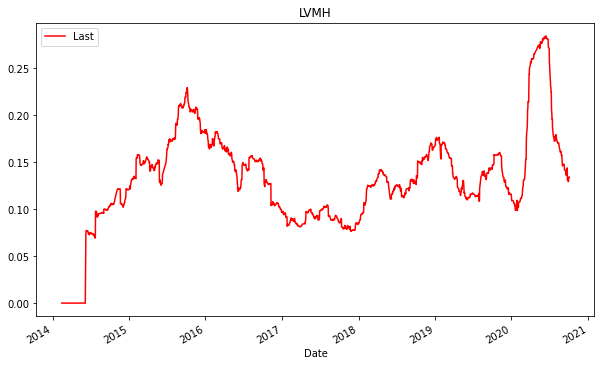

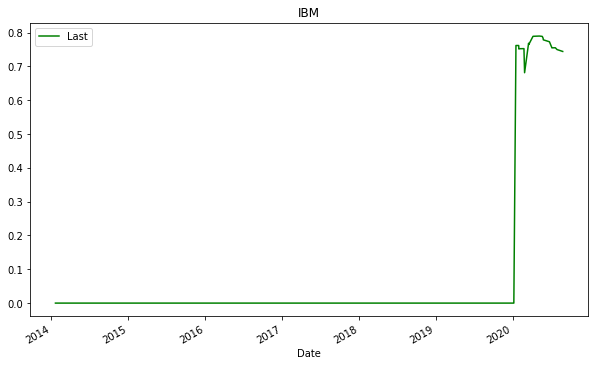

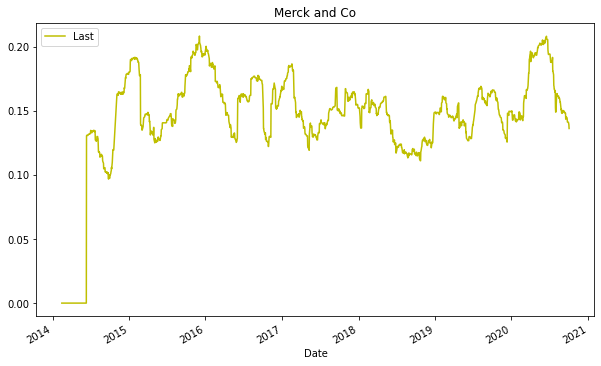

In [ ]:
#visualizing volatility for the stocks
vol_lvmh.plot(figsize=(10,6), color = 'r', title = "LVMH");

vol_ibm.plot(figsize=(10,6), color = 'g', title = "IBM");

vol_merck.plot(figsize=(10,6), color = 'y', title = "Merck and Co");


Merck and Co stock has the lowest volatility rate of around 0.2, followed by LVMH stock with a volatility rate of around 0.25 and IBM with the highest volatility rate of 0.8. Hence, IBM is a highly volatile stock hence it is the most unstable

### Rolling Means

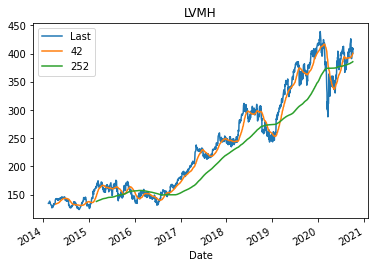

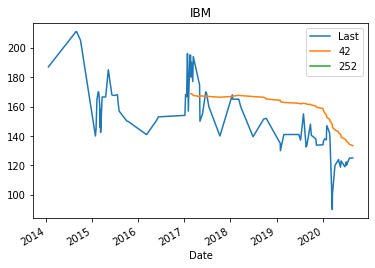

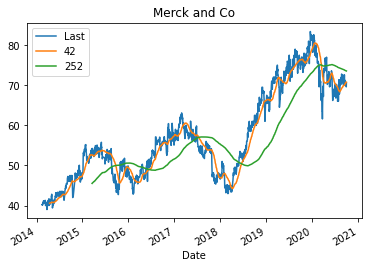

In [ ]:
lvmh_close_px = lvmh_data[['Last']]
# short moving window rolling mean
lvmh_data['42']= lvmh_close_px.rolling(window=40).mean()
# long moving window rolling mean
lvmh_data['252'] = lvmh_close_px.rolling(window=252).mean()
#plot the last price, short and long windows of rolling means
lvmh_data[['Last', '42', '252']].plot(title='LVMH');

###
ibm_close_px = ibm_data[['Last']]
# short moving window rolling mean
ibm_data['42']= ibm_close_px.rolling(window=40).mean()
# long moving window rolling mean
ibm_data['252'] = ibm_close_px.rolling(window=252).mean()
#plot the last price, short and long windows of rolling means
ibm_data[['Last', '42', '252']].plot(title='IBM');

###
merck_close_px = merck_data[['Last']]
# short moving window rolling mean
merck_data['42']= merck_close_px.rolling(window=40).mean()
# long moving window rolling mean
merck_data['252'] = merck_close_px.rolling(window=252).mean()
#plot the last price, short and long windows of rolling means
merck_data[['Last', '42', '252']].plot(title='Merck and Co');

### Exponential Smoothing

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


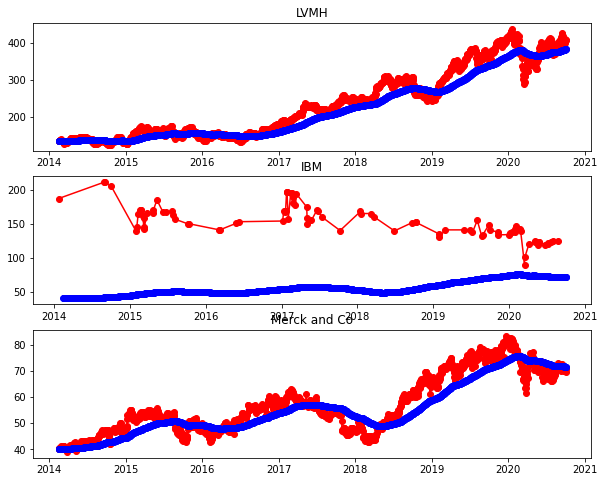

In [ ]:
#Exponential smoothing-this gives a higher rate to nearer observations
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

#exponential smoothing for lvmh stock
lvmh_model= SimpleExpSmoothing(lvmh_data['Last']).fit(smoothing_level=.01,optimized=False)

# subplots
f, ax = plt.subplots(3, figsize = (10,8), sharex = False)

ax[0].plot(lvmh_data['Last'], marker ='o', color ='red')
ax[0].plot(lvmh_model.fittedvalues, marker='o',color='blue')
ax[0].set_title('LVMH');

ax[1].plot(ibm_data['Last'], marker ='o', color ='red')
ax[1].plot(ibm_model.fittedvalues, marker='o',color='blue')
ax[1].set_title('IBM');


ax[2].plot(merck_data['Last'], marker ='o', color ='red')
ax[2].plot(merck_model.fittedvalues, marker='o',color='blue')
ax[2].set_title('Merck and Co');



From the smoothing, we can clearly see the trend the different stocks have taken throughout the years. For the LVMH and Merck and Co data, there has been  a significant upward trend over the years while for the IBM stock, the trend seems to be somewhat stagnated but also a very minimal upward trend as the years go by.

### Lag plots

Lag plot-it is used to check if the series is random or not (checking for stationarity)


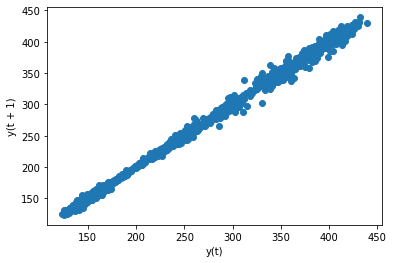

In [ ]:
# checking for stationarity of the lvmh data
from pandas.plotting import lag_plot

lag_plot(lvmh_data['Last']);


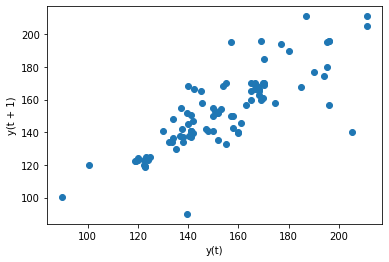

In [ ]:
# checking for stationarity for ibm stock
lag_plot(ibm_data['Last']);


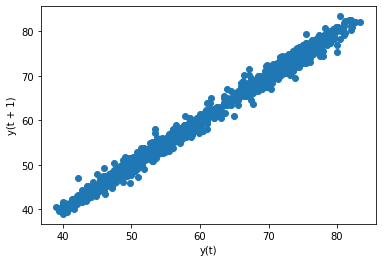

In [ ]:
# checking for stationarity for Merck and Co stock
lag_plot(merck_data['Last']);

LVMH and Merck and Co stocks exhibit a clear linear structure hence they are not random. IBM on the other hand does Not exhibit a clear structure hence the stocks are random

### Autocorrelation plots

Autocorrelation plots are often used for checking randomness in time series. This is done by computing autocorrelations for data values at varying time lags. If time series is random, such autocorrelations should be near zero for any and all time-lag separations. If time series is non-random then one or more of the autocorrelations will be significantly non-zero. The horizontal lines displayed in the plot correspond to 95% and 99% confidence bands. The dashed line is 99% confidence band

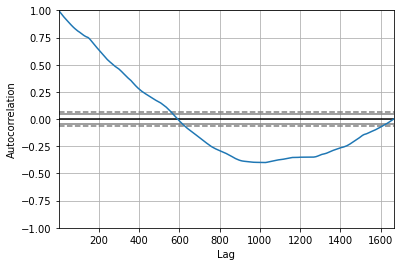

In [ ]:
# autocorrelation plot for lvmh data
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(lvmh_data['Last'])

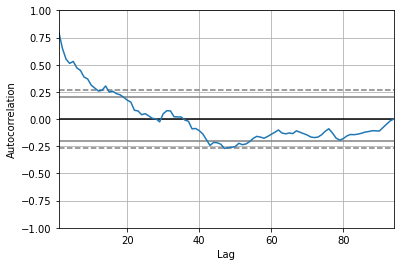

In [ ]:
# autocorrelation plots for IBM data
autocorrelation_plot(ibm_data['Last']);


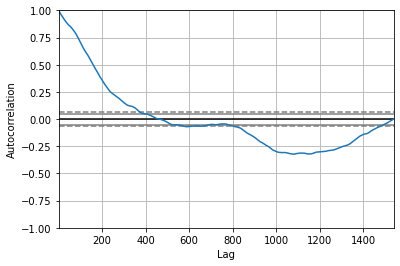

In [ ]:
# autocorrelation plots for IBM data
autocorrelation_plot(merck_data['Last']);

From the Autocorrelation plots, the IBM stocks are closer to zero as compared to the LVMH and Merck and Co stocks hence the IBM stocks are random 

### Partial correlation plots

Partial autocorrelation (Take out the intermediate lags k-lags)
Useful in getting the order for AR, ARIMA Models 

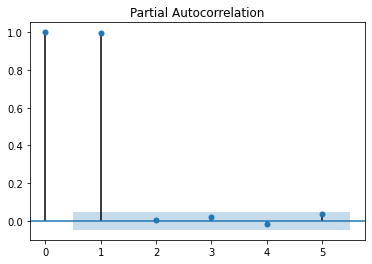

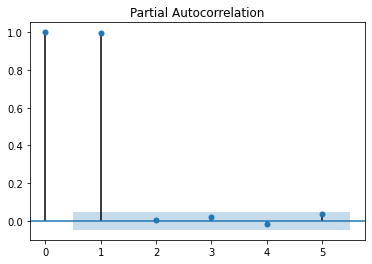

In [ ]:
# partial correlation plots for lvmh data
from pandas import Series
from statsmodels.graphics.tsaplots import plot_pacf

plot_pacf(lvmh_data['Last'], lags=5)

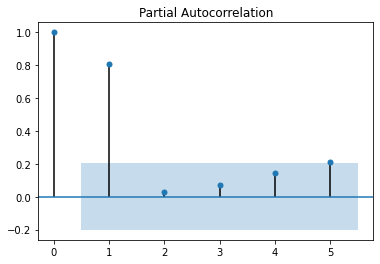

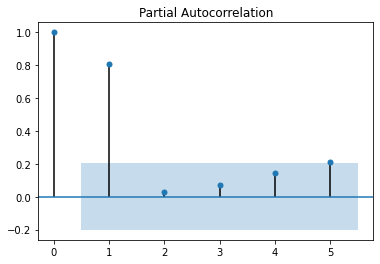

In [ ]:
# partial correlation plots for lvmh data
from pandas import Series
from statsmodels.graphics.tsaplots import plot_pacf

plot_pacf(ibm_data['Last'], lags=5)

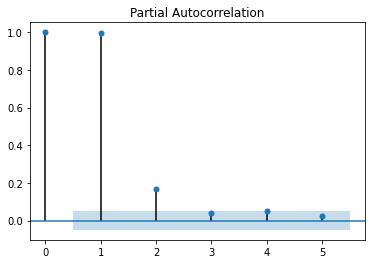

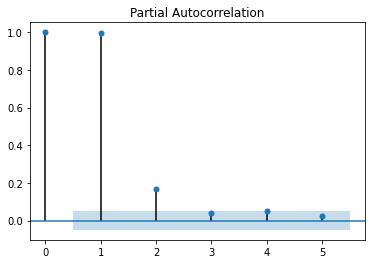

In [ ]:
# partial correlation plots for lvmh data
from pandas import Series
from statsmodels.graphics.tsaplots import plot_pacf

plot_pacf(merck_data['Last'], lags=5)

### Stationarity and Normality

** Apply ADFuller Test for stationarity**

Augmented Dicky Fuller test is a statistical test for stationarity. If the p value is less than 0.05, the series is stationary, otherwise non-stationary

#MERCK & CO Inc

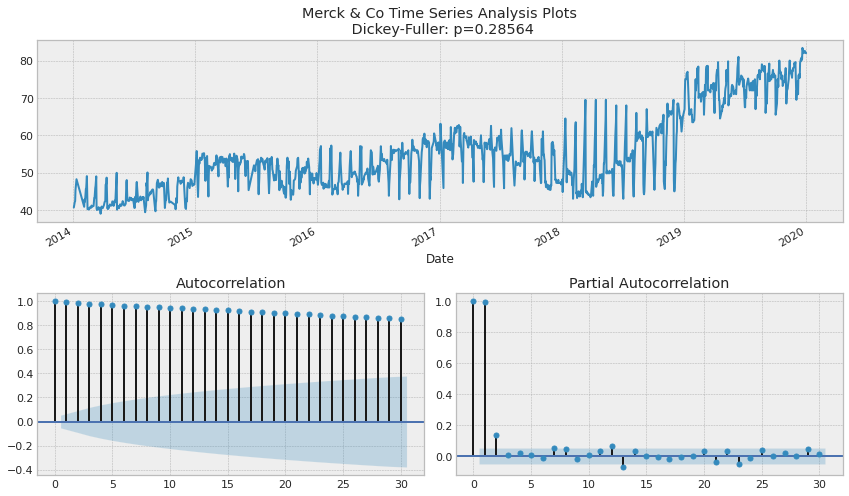

In [ ]:
#Checking for stationarity in Merck and Co dataset
def tsplot(y, lags=None, figsize=(12, 7), syle='bmh'):
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Merck & Co Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
        
tsplot(merck_data.Close, lags=30)


#IBM

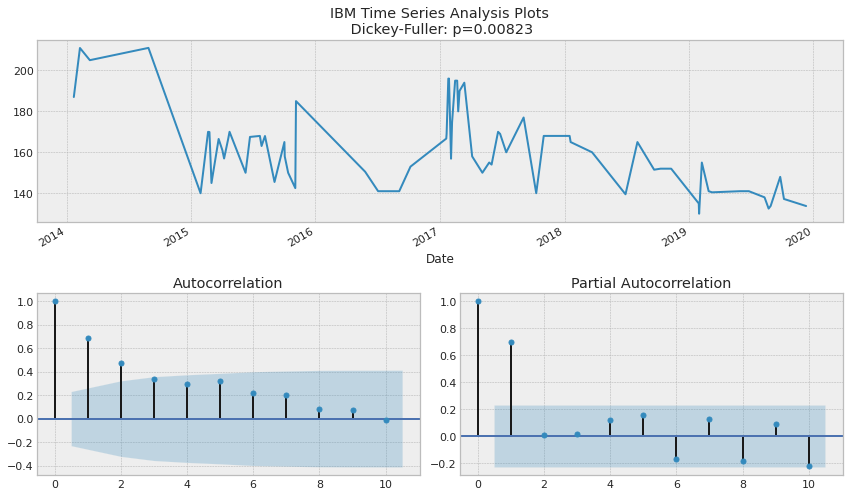

In [ ]:
#Checking for stationarity in IBM dataset
def tsplot(y, lags=None, figsize=(12, 7), syle='bmh'):
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('IBM Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
        
tsplot(IBM_data.Close, lags=10)

#LVMH

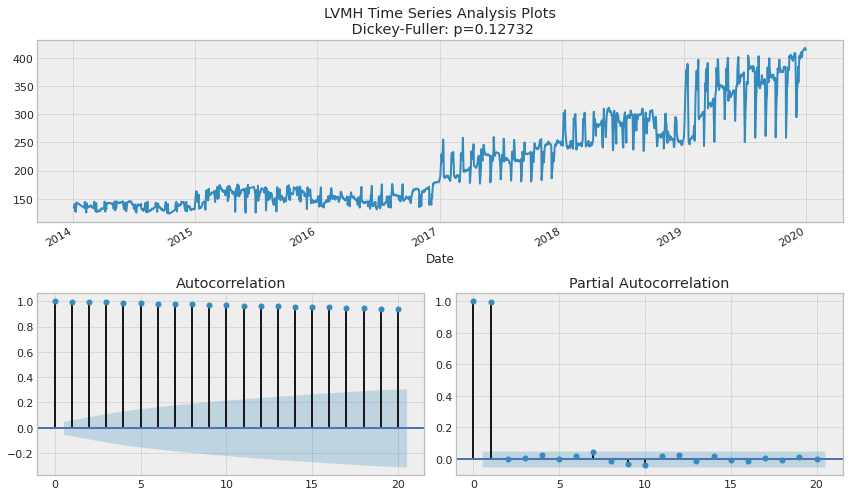

In [ ]:
#Checking for stationarity in LVMH dataset
def tsplot(y, lags=None, figsize=(12, 7), syle='bmh'):
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style='bmh'):
        fig = plt.figure(figsize=figsize)
        layout = (2,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('LVMH Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()
        
tsplot(LVMH_data.Close, lags=20)


Observations: It is clear that time series for Merck & Co and LVMH is non stationery, while th eone for IBM is stationary. The Auto correlation is highest in Merck & Co and LVMH followed by IBM.

#Transforming the data using the shift method
To get rid of the high autocorrelation and to make the process stationary,we simply subtract the time series from itself with a lag of one day.

Merck & Co

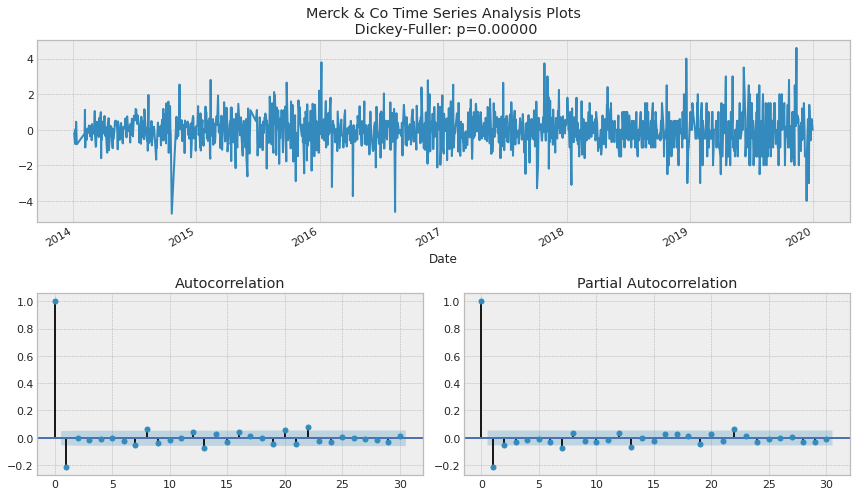

In [ ]:
# Take the first difference to remove to make the process stationary
merck_data_diff = merck_data.Close - merck_data.Close.shift(1)

tsplot(merck_data_diff[1:], lags=30)

LVMH

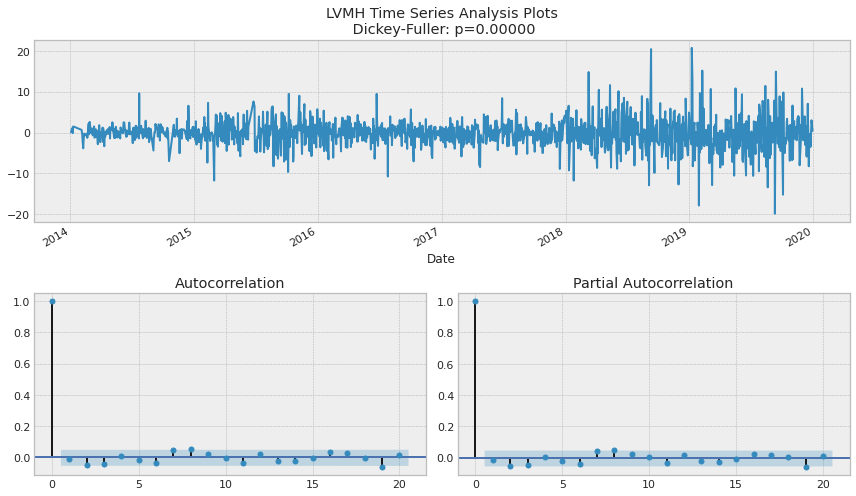

In [ ]:
# Take the first difference to remove to make the process stationary
LVMH_data_diff = LVMH_data.Close - LVMH_data.Close.shift(1)

tsplot(LVMH_data_diff[1:], lags=20)

**Jarque-Bera Test for Normality**

This is a test used to check for normality of datasets especially with large datasets. If the p value is small, the series is NOT normal, otherwise, the series is normal.



In [ ]:
#checking for stationarity and normality for lvmh stock
from statsmodels.tsa.stattools import adfuller

#Calculate ad fuller statistic
adf = adfuller(lvmh_data["Last"])[1]
print(f"p value:{adf}", ", Series is Stationary" if adf <0.05 else ", Series is Non-Stationary")

#Jarque Bera Stastical Test for Normality
from scipy.stats import jarque_bera as jb
is_norm=jb(lvmh_data["Last"])[1]
print(f"p value:{is_norm.round(2)}", ", Series is Normal" if is_norm >0.05 else ", Series is Non-Normal")

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


p value:0.9290434040312533 , Series is Non-Stationary
p value:0.0 , Series is Non-Normal


In [ ]:
#checking for stationarity and normality for ibm stock
from statsmodels.tsa.stattools import adfuller

#Calculate ad fuller statistic
adf = adfuller(ibm_data["Last"])[1]
print(f"p value:{adf}", ", Series is Stationary" if adf <0.05 else ", Series is Non-Stationary")

#Jarque Bera Stastical Test for Normality
from scipy.stats import jarque_bera as jb
is_norm=jb(ibm_data["Last"])[1]
print(f"p value:{is_norm.round(2)}", ", Series is Normal" if is_norm >0.05 else ", Series is Non-Normal")

p value:0.6694566423994943 , Series is Non-Stationary
p value:0.64 , Series is Normal


In [ ]:
#checking for stationarity and normality for merck and co stock
from statsmodels.tsa.stattools import adfuller

#Calculate ad fuller statistic
adf = adfuller(merck_data["Last"])[1]
print(f"p value:{adf}", ", Series is Stationary" if adf <0.05 else ", Series is Non-Stationary")

#Jarque Bera Stastical Test for Normality
from scipy.stats import jarque_bera as jb
is_norm=jb(merck_data["Last"])[1]
print(f"p value:{is_norm.round(2)}", ", Series is Normal" if is_norm >0.05 else ", Series is Non-Normal")

p value:0.5284903690426467 , Series is Non-Stationary
p value:0.0 , Series is Non-Normal


The p-values of the ADF test from the three stocks are all greater than 0.05 hence our series are all non-stationary. LVMH and Merck and Co are both non-normally distributed while IBM stocks are normally distributed.

# 6.Modeling

#Implementing Moving average

Using the moving average model to smooth our time series. For that, we will use a helper function that will run the moving average model on a specified time window and it will plot the result smoothed curve:

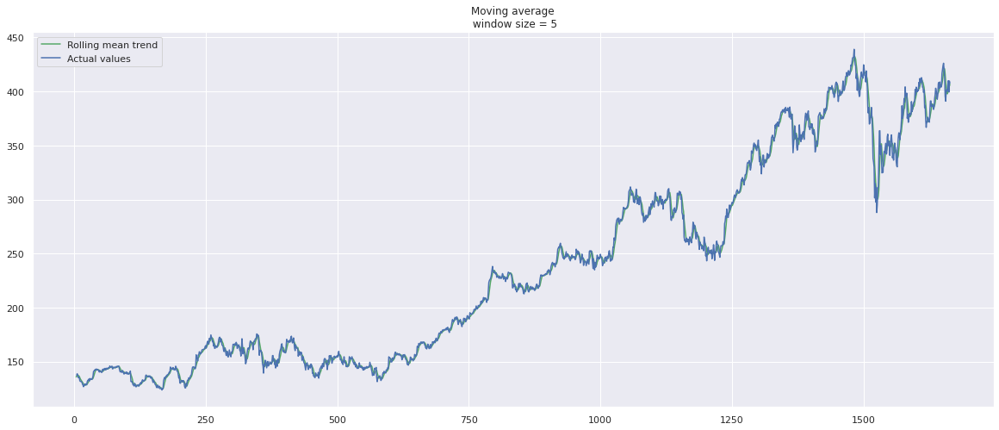

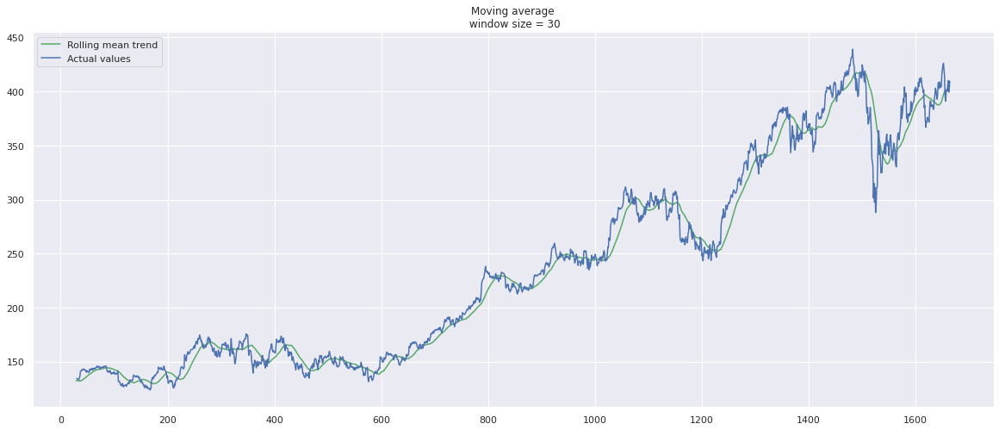

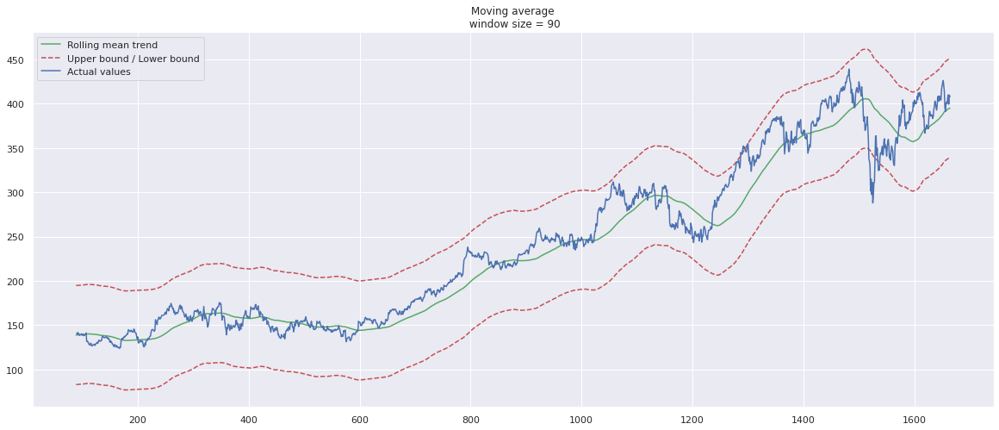

In [ ]:
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):

    rolling_mean = series.rolling(window=window).mean()
    
    plt.figure(figsize=(20,8))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Rolling mean trend')
    
    #Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
            
    plt.plot(series[window:], label='Actual values')
    plt.legend(loc='best')
    plt.grid(True)
    
#Smooth by the previous 5 days (by week)
plot_moving_average(merck_data.Close, 5)

#Smooth by the previous month (30 days)
plot_moving_average(merck_data.Close, 30)

#Smooth by previous quarter (90 days)
plot_moving_average(merck_data.Close, 90, plot_intervals=True)

#Implementing ARIMA Model

ARIMA MODEL
 
An autoregressive integrated moving average(ARIMA) is a statistical analysis model that uses time series data to either better understand the data set or to predict future trends.

ARIMA models allow both autoregressive (AR) components as well as moving average (MA) components. The (I) in ARIMA determines the level of differencing to use, which helps make the data stationary. 
 
The main advantage of ARIMA forecasting is that it requires data on the time series in question only. First, this feature is advantageous if one is forecasting a large number of time series, second, it avoids a problem that occurs sometimes with multivariate models.


#MERCK & CO

In [ ]:
#import packages
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error
import numpy as np


#to plot within notebook
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [ ]:
#Import and preview
merck_data=pd.read_csv('EURONEXT-MRK.csv', index_col=[0], parse_dates=[0])
merck_data= merck_data.rename(columns={'Last':'Close'})
merck_data.head(3)

,Open,High,Low,Close,Volume,Turnover
Date,,,,,,
2019-12-31,82.0,82.0,82.0,82.0,15,1230.0
2019-12-30,81.2,82.0,81.2,82.0,489,39952.0
2019-12-27,80.8,82.6,80.8,82.6,815,66276.0


In [ ]:
merck_data.shape

(1356, 6)

In [ ]:
#Create a dataset with Last and Dat columns only
merck_data.drop(['Open','High','Low','Volume','Turnover'], axis='columns', inplace=True)
merck_data.head()


,Close
Date,
2019-12-31,82.0
2019-12-30,82.0
2019-12-27,82.6
2019-12-24,82.0
2019-12-23,82.0


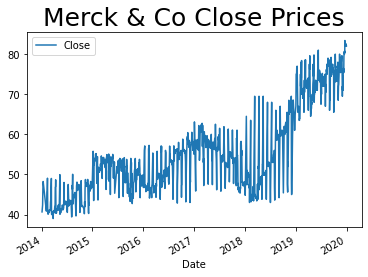

In [ ]:
#Plotting the trend for close prices
x=merck_data['Close'].plot(style=['-']) 
plt.title('Merck & Co Close Prices',fontsize=25)

x.legend()
plt.plot

# display graph
plt.show()

In [ ]:
#Check series in array
merck_data_array=merck_data.values
merck_data_array

array([[82.  ],
       [82.  ],
       [82.6 ],
       ...,
       [40.11],
       [40.35],
       [40.2 ]])

In [ ]:
#Specify Scaler to apply normalization
scaler=MinMaxScaler(feature_range=(0,1))

In [ ]:
#Fit
scaler= scaler.fit(merck_data_array)

In [ ]:
#Check min value
scaler.data_min_

array([39.])

In [ ]:
#Check max value
scaler.data_max_

array([83.4])

In [ ]:
#Transform the merck data
merck_data_normalize=scaler.transform(merck_data_array)

In [ ]:
#Preview normalized data
merck_data_normalize[0]

array([0.96846847])

In [ ]:
#Preview first 5 values of normalizeed data
for i in range(5):
  print(merck_data_normalize[i])

[0.96846847]
[0.96846847]
[0.98198198]
[0.96846847]
[0.96846847]


In [ ]:
#Split train and test
merck_train=merck_data_normalize[0:1000]
merck_test=merck_data_normalize[1001:1356]

In [ ]:
#Checking size of train
merck_train.size

1000

In [ ]:
#Checking size of test
merck_test.size

355

In [ ]:
#train the model
merck_model=ARIMA(merck_train,order=(2,1,2))

In [ ]:
#fit the model
merck_model_fit=merck_model.fit()

In [ ]:
#print aic, the lower the better the model
merck_model_fit.aic

-4760.840821431495

Got aic value of -4760.8 we will compare this with our optimized model

In [ ]:
#forecast the prices
merck_forecast=merck_model_fit.forecast(steps=355)[0]
merck_forecast

array([ 0.15944314,  0.15789963,  0.15620498,  0.15463235,  0.15315702,
        0.15176687,  0.15045099,  0.14919987,  0.14800524,  0.14685986,
        0.14575743,  0.14469245,  0.14366014,  0.14265632,  0.14167733,
        0.14072001,  0.13978157,  0.13885962,  0.13795202,  0.13705696,
        0.13617282,  0.1352982 ,  0.1344319 ,  0.13357284,  0.1327201 ,
        0.13187287,  0.13103044,  0.1301922 ,  0.12935762,  0.12852622,
        0.12769761,  0.12687141,  0.12604733,  0.12522509,  0.12440446,
        0.12358523,  0.12276722,  0.12195028,  0.12113427,  0.12031907,
        0.11950457,  0.11869069,  0.11787735,  0.11706448,  0.11625202,
        0.11543991,  0.11462811,  0.11381659,  0.1130053 ,  0.11219422,
        0.11138331,  0.11057257,  0.10976196,  0.10895147,  0.10814108,
        0.10733079,  0.10652057,  0.10571042,  0.10490033,  0.1040903 ,
        0.10328031,  0.10247036,  0.10166045,  0.10085056,  0.1000407 ,
        0.09923087,  0.09842106,  0.09761126,  0.09680148,  0.09

In [ ]:
#Checking the error
np.sqrt(mean_squared_error(merck_test,merck_forecast))

0.19104799206833492

Error of 0.19 we will reverse to original values and check the error

In [ ]:
#Reshape merck data
merck_forecast_reshape=merck_forecast.reshape(len(merck_forecast),1)

In [ ]:
#Fetching the original forecast values
merck_forecast_reverse=scaler.inverse_transform(merck_forecast_reshape)
merck_forecast_reverse
                                          

array([[46.07927556],
       [46.01074379],
       [45.93550104],
       [45.86567635],
       [45.80017177],
       [45.7384491 ],
       [45.68002394],
       [45.62447441],
       [45.57143258],
       [45.52057761],
       [45.4716297 ],
       [45.42434485],
       [45.37851027],
       [45.33394042],
       [45.29047348],
       [45.24796833],
       [45.20630193],
       [45.16536695],
       [45.12506981],
       [45.08532891],
       [45.04607308],
       [45.00724025],
       [44.96877631],
       [44.93063405],
       [44.89277232],
       [44.85515523],
       [44.81775148],
       [44.78053377],
       [44.74347829],
       [44.7065643 ],
       [44.66977368],
       [44.63309066],
       [44.59650146],
       [44.55999409],
       [44.52355807],
       [44.48718427],
       [44.45086474],
       [44.41459253],
       [44.37836158],
       [44.34216662],
       [44.30600304],
       [44.26986683],
       [44.23375448],
       [44.19766294],
       [44.16158956],
       [44

In [ ]:
#Reshape merck test data
merck_test_reshape=merck_test.reshape(len(merck_test),1)

In [ ]:
#Fetching the original test values
merck_test_reverse=scaler.inverse_transform(merck_test_reshape)
merck_test_reverse

array([[47.81],
       [47.27],
       [46.  ],
       [45.65],
       [47.  ],
       [47.  ],
       [47.  ],
       [46.  ],
       [46.26],
       [46.92],
       [48.01],
       [48.07],
       [49.32],
       [47.9 ],
       [48.55],
       [50.5 ],
       [50.82],
       [52.94],
       [54.2 ],
       [52.9 ],
       [52.22],
       [53.71],
       [51.41],
       [53.  ],
       [53.6 ],
       [53.1 ],
       [53.5 ],
       [53.35],
       [53.3 ],
       [52.52],
       [53.  ],
       [50.82],
       [51.4 ],
       [52.31],
       [52.71],
       [53.41],
       [53.72],
       [53.54],
       [54.  ],
       [52.85],
       [53.15],
       [52.4 ],
       [51.35],
       [52.  ],
       [52.7 ],
       [51.36],
       [51.08],
       [50.36],
       [51.47],
       [51.96],
       [52.13],
       [51.65],
       [53.51],
       [52.7 ],
       [54.62],
       [54.45],
       [55.78],
       [54.2 ],
       [54.8 ],
       [55.  ],
       [54.01],
       [53.77],
       [

In [ ]:
#Checking the error
np.sqrt(mean_squared_error(merck_test_reverse,merck_forecast_reverse))

8.482530847834072

We observe an error of 8.48

<function matplotlib.pyplot.show>

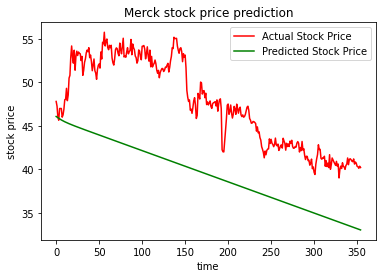

In [ ]:
#plotting actual vs predicted values

plt.plot(merck_test_reverse, color = 'red', label = "Actual Stock Price")
plt.plot(merck_forecast_reverse, color = 'green', label = "Predicted Stock Price")
plt.title('Merck stock price prediction')
plt.ylabel('stock price')
plt.xlabel('time')
plt.legend()
plt.show


The model predicts a downward trend which reflects the current trend. ARIMA model uses past data to understand the pattern in the time series. Using these values, the model captured the downward trend in the series. the model is not so good as predictions not close to the real values and omits the seasonality of the series.


#Hyperparameter tuning

In [ ]:
p_values= range(0,10)
d_values= range(0,3)
q_values= range (0,5)

In [ ]:
for p in p_values:
  for d in d_values:
    for q in q_values:
      order= (p,d,q)
      merck_train, merck_test= merck_data_normalize[0:1000],merck_data_normalize[1001:1356]
      predictions=list()
      for i in range(len(merck_test)):
        try:
             model=ARIMA(merck_train,order)
             model_fit = model.fit(disp=0)
             pred_y = model_fit.forecast()[0]
             predictions.append(pred_y)
             error = mean_squared_error(merck_test,predictions)
             print('ARIMA%s, MSE=.2f%'%(order,error))
        except:
           break
      

#IBM

In [ ]:
#Import and preview
IBM_data=pd.read_csv('EURONEXT-IBMA.csv', index_col=[0], parse_dates=[0])
IBM_data= IBM_data.rename(columns={'Last':'Close'})
IBM_data.head(3)

,Open,High,Low,Close,Volume,Turnover
Date,,,,,,
2019-12-11,133.75,133.75,133.75,133.75,501,60691.0
2019-08-11,138.00,138.00,138.00,138.00,52,6504.0
2019-03-10,139.70,140.45,139.70,140.45,20,2558.0


In [ ]:
#Checking shape of the data
IBM_data.shape

(72, 6)

In [ ]:
#Create a dataset with Close and Date columns only
IBM_data.drop(['Open','High','Low','Volume','Turnover'], axis='columns', inplace=True)
IBM_data.head()


,Close
Date,
2019-12-11,133.75
2019-08-11,138.00
2019-03-10,140.45
2019-09-26,148.00
2019-08-29,133.80


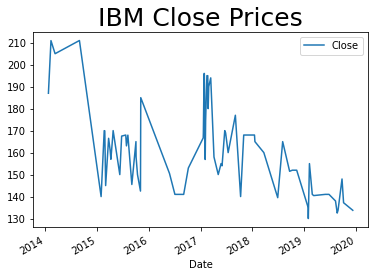

In [ ]:
#Plotting the trend for close prices
x=IBM_data['Close'].plot(style=['-']) 
plt.title('IBM Close Prices',fontsize=25)

x.legend()
plt.plot

# display graph
plt.show()

We observe a downward trend

In [ ]:
#Check series in array
IBM_data_array=IBM_data.values 
IBM_data_array

array([[133.75],
       [138.  ],
       [140.45],
       [148.  ],
       [133.8 ],
       [132.5 ],
       [155.  ],
       [137.2 ],
       [141.  ],
       [141.  ],
       [141.  ],
       [130.  ],
       [135.  ],
       [152.  ],
       [152.  ],
       [151.5 ],
       [139.5 ],
       [160.  ],
       [165.  ],
       [165.  ],
       [168.  ],
       [140.01],
       [160.  ],
       [169.  ],
       [170.  ],
       [155.  ],
       [150.02],
       [158.  ],
       [174.6 ],
       [194.  ],
       [177.  ],
       [190.  ],
       [180.  ],
       [195.  ],
       [195.  ],
       [156.88],
       [196.  ],
       [196.  ],
       [196.  ],
       [169.  ],
       [166.7 ],
       [168.  ],
       [154.  ],
       [153.  ],
       [150.5 ],
       [140.99],
       [141.  ],
       [150.  ],
       [150.  ],
       [156.97],
       [163.07],
       [168.  ],
       [167.51],
       [167.95],
       [185.  ],
       [170.01],
       [166.5 ],
       [166.51],
       [142.5 

In [ ]:
#Specify Scaler to apply normalization
scaler=MinMaxScaler(feature_range=(0,1))

In [ ]:
#Fit
scaler= scaler.fit(IBM_data_array)

In [ ]:
#Check min value
scaler.data_min_

array([130.])

In [ ]:
#Check max value
scaler.data_max_

array([211.])

In [ ]:
#Transform that merck data
IBM_data_normalize=scaler.transform(IBM_data_array)

In [ ]:
#Preview normalized data
IBM_data_normalize[0]

array([0.0462963])

In [ ]:
#Preview first 5 values of normalizeed data
for i in range(5):
  print(IBM_data_normalize[i])

[0.0462963]
[0.09876543]
[0.12901235]
[0.22222222]
[0.04691358]


In [ ]:
#Split train and test
IBM_train=IBM_data_normalize[0:50]
IBM_test=IBM_data_normalize[51:72]

In [ ]:
#Checking the size of train data
IBM_train.size

50

In [ ]:
#Checking size of test data
IBM_test.size

21

In [ ]:
#train model
IBM_model=ARIMA(IBM_train,order=(2,1,2))

In [ ]:
#fit the model
IBM_model_fit=IBM_model.fit()

In [ ]:
#print aic, the lower the better the model
IBM_model_fit.aic

-29.665127653963594

In [ ]:
#Make predictions
IBM_forecast=IBM_model_fit.forecast(steps=21)[0]
IBM_forecast

array([0.38734821, 0.45128358, 0.47530118, 0.51254362, 0.52390221,
       0.54795032, 0.55442742, 0.57169033, 0.57660979, 0.59020111,
       0.5949118 , 0.60639504, 0.61138693, 0.62158306, 0.62698574,
       0.63635026, 0.64215238, 0.65095394, 0.65709747, 0.66550436,
       0.67192313])

In [ ]:
#Checking the error
np.sqrt(mean_squared_error(IBM_test,IBM_forecast))

0.25326100667838103

We observe an error of 0.2 with normalized data. We will reverse to get the error for the original values

In [ ]:
#Reshape merck data
IBM_forecast_reshape=IBM_forecast.reshape(len(IBM_forecast),1)

In [ ]:
#Fetching the original forecast values
IBM_forecast_reverse=scaler.inverse_transform(IBM_forecast_reshape)
IBM_forecast_reverse
                                          

array([[161.37520537],
       [166.55396967],
       [168.49939554],
       [171.51603301],
       [172.43607889],
       [174.3839763 ],
       [174.90862067],
       [176.30691641],
       [176.70539279],
       [177.80628989],
       [178.18785555],
       [179.11799818],
       [179.52234158],
       [180.34822787],
       [180.78584499],
       [181.54437075],
       [182.0143427 ],
       [182.72726927],
       [183.22489479],
       [183.90585294],
       [184.42577354]])

In [ ]:
#Reshape merck test data
IBM_test_reshape=IBM_test.reshape(len(IBM_test),1)

In [ ]:
#Fetching the original test values
IBM_test_reverse=scaler.inverse_transform(IBM_test_reshape)
IBM_test_reverse

array([[168.  ],
       [167.51],
       [167.95],
       [185.  ],
       [170.01],
       [166.5 ],
       [166.51],
       [142.5 ],
       [158.  ],
       [145.5 ],
       [161.  ],
       [169.9 ],
       [169.9 ],
       [170.  ],
       [165.  ],
       [145.  ],
       [140.  ],
       [205.  ],
       [210.95],
       [211.  ],
       [187.  ]])

In [ ]:
#Checking the error
np.sqrt(mean_squared_error(IBM_test_reverse,IBM_forecast_reverse))

20.514141540948856

We observe an error of 20.5

<function matplotlib.pyplot.show>

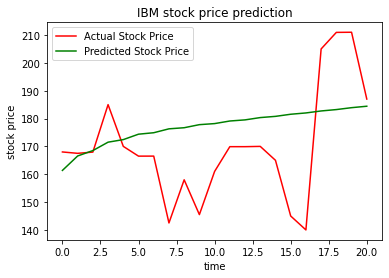

In [ ]:
#plotting actual vs predicted values

plt.plot(IBM_test_reverse, color = 'red', label = "Actual Stock Price")
plt.plot(IBM_forecast_reverse, color = 'green', label = "Predicted Stock Price")
plt.title('IBM stock price prediction')
plt.ylabel('stock price')
plt.xlabel('time')
plt.legend()
plt.show


The model has not captured the exact trend of the series as omits seasonality. It is therefore not the best to make predictions.



#LVMH

In [ ]:
#Import and preview
LVMH_data=pd.read_csv('EURONEXT-MC.csv', index_col=[0], parse_dates=[0])
LVMH_data= LVMH_data.rename(columns={'Last':'Close'})
LVMH_data.head(3)

,Open,High,Low,Close,Volume,Turnover
Date,,,,,,
2019-12-31,414.20,416.50,411.85,414.2,102945,42666999.0
2019-12-30,419.25,419.50,414.05,414.6,226651,94315628.0
2019-12-27,417.00,419.45,415.20,417.6,364536,152260335.0


In [ ]:
#Checking the shape of the data
LVMH_data.shape

(1471, 6)

In [ ]:
#Create a dataset with Last and Dat columns only
LVMH_data.drop(['Open','High','Low','Volume','Turnover'], axis='columns', inplace=True)
LVMH_data.head()


,Close
Date,
2019-12-31,414.2
2019-12-30,414.6
2019-12-27,417.6
2019-12-24,414.1
2019-12-23,413.8


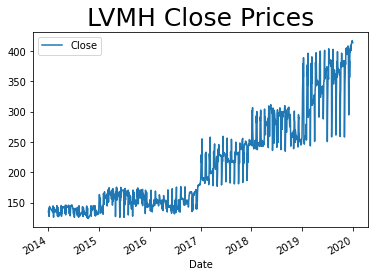

In [ ]:
#Plotting the trend for close prices
x=LVMH_data['Close'].plot(style=['-']) 
plt.title('LVMH Close Prices',fontsize=25)

x.legend()
plt.plot

# display graph
plt.show()

We observe an upward trend

In [ ]:
#Check series in array
LVMH_data_array=LVMH_data.values 
LVMH_data_array

array([[414.2 ],
       [414.6 ],
       [417.6 ],
       ...,
       [135.75],
       [135.2 ],
       [134.8 ]])

In [ ]:
#Specify Scaler to apply normalization
scaler=MinMaxScaler(feature_range=(0,1))

In [ ]:
#Fit
scaler= scaler.fit(LVMH_data_array)

In [ ]:
#Check min value
scaler.data_min_

array([123.75])

In [ ]:
#Check max value
scaler.data_max_

array([417.6])

In [ ]:
#Transform that merck data
LVMH_data_normalize=scaler.transform(LVMH_data_array)

In [ ]:
#Preview normalized data
LVMH_data_normalize[0]

array([0.98842947])

In [ ]:
#Preview first 5 values of normalizeed data
for i in range(5):
  print(LVMH_data_normalize[i])

[0.98842947]
[0.98979071]
[1.]
[0.98808916]
[0.98706823]


In [ ]:
#Split train and test
LVMH_train=LVMH_data_normalize[0:1000]
LVMH_test=LVMH_data_normalize[1001:1471]

In [ ]:
#Checking size of train
LVMH_train.size

1000

In [ ]:
#Checking size of test
LVMH_test.size

470

In [ ]:
#train model
LVMH_model=ARIMA(LVMH_train,order=(3,1,2))

In [ ]:
#fit the model
LVMH_model_fit=LVMH_model.fit()

In [ ]:
#print aic, the lower the better the model
LVMH_model_fit.aic

-5854.81031290589

In [ ]:
#Forecasting the prices
LVMH_forecast=LVMH_model_fit.forecast(steps=470)[0]
LVMH_forecast

array([ 0.06687437,  0.06647051,  0.06636919,  0.06564433,  0.06482691,
        0.06390373,  0.06298533,  0.0620597 ,  0.06113903,  0.060218  ,
        0.0592979 ,  0.05837764,  0.05745749,  0.05653728,  0.05561709,
        0.05469689,  0.05377669,  0.05285649,  0.05193629,  0.05101609,
        0.05009589,  0.04917569,  0.04825549,  0.0473353 ,  0.0464151 ,
        0.0454949 ,  0.0445747 ,  0.0436545 ,  0.0427343 ,  0.0418141 ,
        0.0408939 ,  0.0399737 ,  0.0390535 ,  0.0381333 ,  0.0372131 ,
        0.03629291,  0.03537271,  0.03445251,  0.03353231,  0.03261211,
        0.03169191,  0.03077171,  0.02985151,  0.02893131,  0.02801111,
        0.02709091,  0.02617071,  0.02525051,  0.02433032,  0.02341012,
        0.02248992,  0.02156972,  0.02064952,  0.01972932,  0.01880912,
        0.01788892,  0.01696872,  0.01604852,  0.01512832,  0.01420812,
        0.01328793,  0.01236773,  0.01144753,  0.01052733,  0.00960713,
        0.00868693,  0.00776673,  0.00684653,  0.00592633,  0.00

In [ ]:
#Checking the error
np.sqrt(mean_squared_error(LVMH_test,LVMH_forecast))

0.2505414148279098

In [ ]:
#Reshape merck data
LVMH_forecast_reshape=LVMH_forecast.reshape(len(LVMH_forecast),1)

In [ ]:
#Fetching the original forecast values
LVMH_forecast_reverse=scaler.inverse_transform(LVMH_forecast_reshape)
LVMH_forecast_reverse
                                          

array([[143.4010326 ],
       [143.28235984],
       [143.2525877 ],
       [143.0395877 ],
       [142.79938641],
       [142.52810999],
       [142.25824033],
       [141.98624264],
       [141.71570297],
       [141.44505956],
       [141.17468753],
       [140.90426926],
       [140.63388207],
       [140.36347998],
       [140.09308175],
       [139.82268069],
       [139.55228043],
       [139.28187976],
       [139.01147926],
       [138.7410787 ],
       [138.47067817],
       [138.20027763],
       [137.9298771 ],
       [137.65947656],
       [137.38907603],
       [137.11867549],
       [136.84827496],
       [136.57787442],
       [136.30747389],
       [136.03707335],
       [135.76667282],
       [135.49627228],
       [135.22587175],
       [134.95547121],
       [134.68507068],
       [134.41467014],
       [134.14426961],
       [133.87386907],
       [133.60346854],
       [133.333068  ],
       [133.06266747],
       [132.79226693],
       [132.5218664 ],
       [132

In [ ]:
#Reshape merck test data
LVMH_test_reshape=LVMH_test.reshape(len(LVMH_test),1)

In [ ]:
#Fetching the original test values
LVMH_test_reverse=scaler.inverse_transform(LVMH_test_reshape)
LVMH_test_reverse

array([[144.9 ],
       [143.9 ],
       [143.15],
       [139.2 ],
       [134.65],
       [140.  ],
       [136.75],
       [137.4 ],
       [137.  ],
       [137.75],
       [139.45],
       [135.2 ],
       [135.35],
       [136.6 ],
       [136.7 ],
       [139.45],
       [139.2 ],
       [144.9 ],
       [147.15],
       [147.75],
       [144.1 ],
       [146.05],
       [146.45],
       [143.8 ],
       [142.7 ],
       [145.  ],
       [148.9 ],
       [148.65],
       [147.95],
       [142.2 ],
       [144.95],
       [148.  ],
       [148.85],
       [150.5 ],
       [154.45],
       [152.25],
       [151.2 ],
       [158.45],
       [157.4 ],
       [158.75],
       [155.95],
       [159.1 ],
       [158.  ],
       [154.95],
       [161.9 ],
       [162.25],
       [162.4 ],
       [163.6 ],
       [165.4 ],
       [160.15],
       [162.4 ],
       [166.95],
       [171.9 ],
       [168.4 ],
       [167.3 ],
       [168.75],
       [173.5 ],
       [172.75],
       [169.75

In [ ]:
#Checking the error
np.sqrt(mean_squared_error(LVMH_test_reverse,LVMH_forecast_reverse))

73.6215947471813

<function matplotlib.pyplot.show>

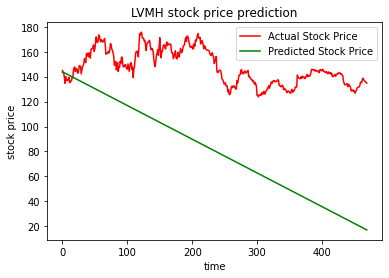

In [ ]:
#plotting actual vs predicted values

plt.plot(LVMH_test_reverse, color = 'red', label = "Actual Stock Price")
plt.plot(LVMH_forecast_reverse, color = 'green', label = "Predicted Stock Price")
plt.title('LVMH stock price prediction')
plt.ylabel('stock price')
plt.xlabel('time')
plt.legend()
plt.show


The model has not captured the exact trend of the series as omits seasonality. It is therefore not the best to make predictions.

#FACEBOOK'S PROPHET MODEL

We are going to build models for each of the three companies using prophet, an open source library published by Facebook which is a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects.

We'll use these models to perform timeseries analysis and predict the closing stock prices for the companies in 2020.

## 1.) Import necessary packages and read the dataset

In [ ]:
#Installing quandl
!pip install quandl
import quandl

In [ ]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
#prophet model 
from fbprophet import Prophet
#prophet preformance
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

In [ ]:
#Setting the configuration key
quandl.ApiConfig.api_key = "rX4jfEfpeNZb4ozAPj5c"

In [ ]:
#Loading the merck and co inc. data in our colab notebook.
merck_data = quandl.get('EURONEXT/MRK')
#Resetting the index
merck_data.reset_index(level=0, inplace=True)
merck_data = merck_data.rename(columns={'Last':'Close'})
merck_data.head()

,Date,Open,High,Low,Close,Volume,Turnover
0,2014-02-14,40.00,40.20,40.00,40.20,117.0,4687.00
1,2014-02-17,40.02,40.35,40.02,40.35,371.0,14909.01
2,2014-02-18,40.11,40.11,40.11,40.11,225.0,9024.75
3,2014-02-19,39.85,40.30,39.84,40.30,400.0,15973.10
4,2014-02-20,39.90,40.34,39.89,40.34,233.0,9318.10


In [ ]:
#Get new dataframe with date & Merck and Co Inc closing price
merck_data = merck_data[['Date','Close']]
merck_data.head()

,Date,Close
0,2014-02-14,40.20
1,2014-02-17,40.35
2,2014-02-18,40.11
3,2014-02-19,40.30
4,2014-02-20,40.34


In [ ]:
#Prophet looks for two fields from input data: time ds and values y
#Column names for prophet compliance
merck_data.columns = ['ds','y']

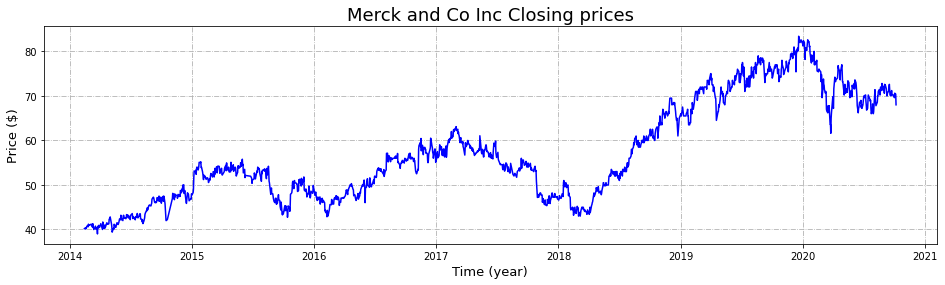

In [ ]:
#Plotting the data to see the trend in closing prices for Merck and Co Inc

plt.figure(figsize=(16,4))
plt.grid(linestyle='-.')
plt.plot(merck_data.ds, merck_data.y, 'b')

# set title & labels
plt.title('Merck and Co Inc Closing prices', fontsize=18)
plt.ylabel('Price ($)', fontsize=13)
plt.xlabel('Time (year)', fontsize=13)

# display graph
plt.show()

In [ ]:
#Dividing the dataset into train and test. The train has data up to December, 2019. Test Data has from January, 2020.
end_date = '2019-12-31'
mask1 = (merck_data['ds'] <= end_date)
mask2 = (merck_data['ds'] > end_date)
X_train = merck_data.loc[mask1]
X_test = merck_data.loc[mask2]
print("train shape",X_train.shape)
print("test shape",X_test.shape)

train shape (1356, 2)
test shape (186, 2)


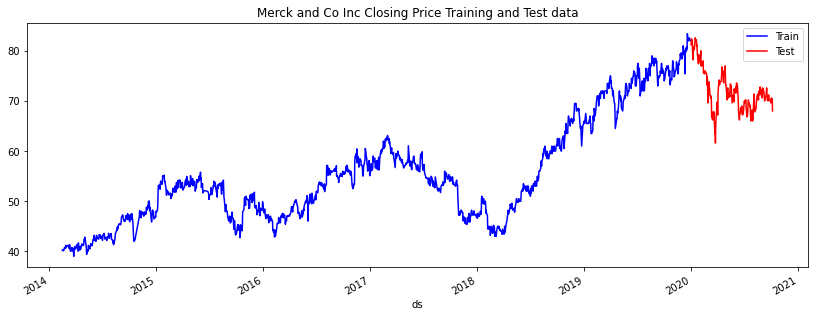

In [ ]:
#Plotting the Closing price for the train and test data
pd.plotting.register_matplotlib_converters()
f, ax = plt.subplots(figsize=(14,5))
X_train.plot(kind='line', x='ds', y='y', color='blue', label='Train', ax=ax)
X_test.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
plt.title('Merck and Co Inc Closing Price Training and Test data')
plt.show()

In [ ]:
#Fitting the model to the train data
model =Prophet()
model.fit(X_train)

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Now, we will predict by creating future dataframe next dates of train data. The predcition will be done for train data as well.

In [ ]:
#Making predictions
future = model.make_future_dataframe(periods=270, freq='D')
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1621,2020-09-22,89.762349,81.424502,98.556428
1622,2020-09-23,89.776963,81.349426,99.085435
1623,2020-09-24,89.762888,81.831569,98.692885
1624,2020-09-25,89.820122,81.082466,99.003430
1625,2020-09-26,90.399891,81.740437,100.344407


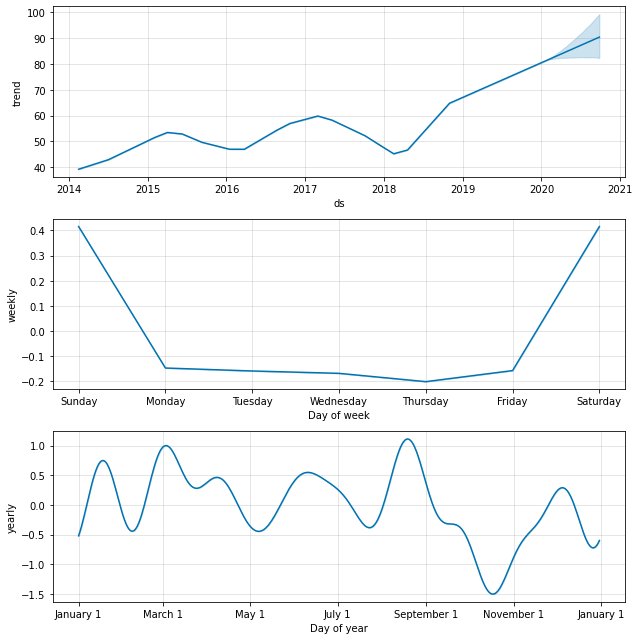

In [ ]:
# Plot the components of the model
fig = model.plot_components(forecast)

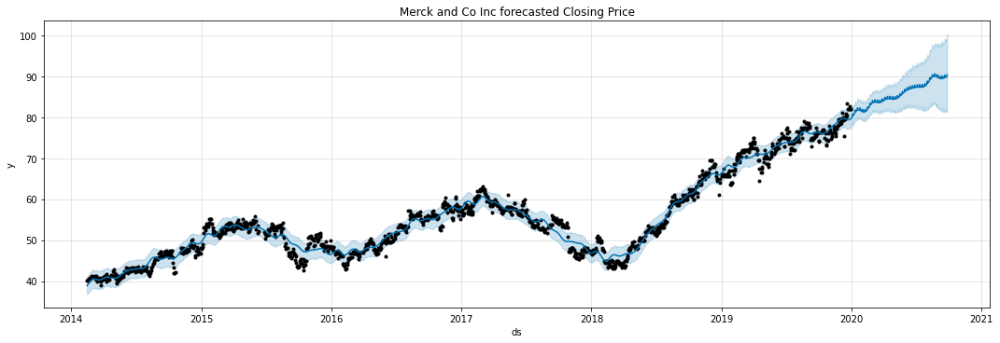

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model.plot(forecast,ax=ax)
plt.title('Merck and Co Inc forecasted Closing Price')
plt.show()

Actual vs Predicted

In [ ]:
#Creating dataframe for the predicted prices
X_test_forecast = model.predict(X_test)
X_test_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
179,2020-09-28,89.833432,81.171924,98.163358
180,2020-09-29,89.810308,80.950582,98.412715
181,2020-09-30,89.783858,80.958430,98.661453
182,2020-10-01,89.728553,80.739902,98.845502
183,2020-10-02,89.745688,81.081092,98.804628
184,2020-10-05,89.657888,80.445131,98.770262
185,2020-10-06,89.611169,80.617110,98.450168


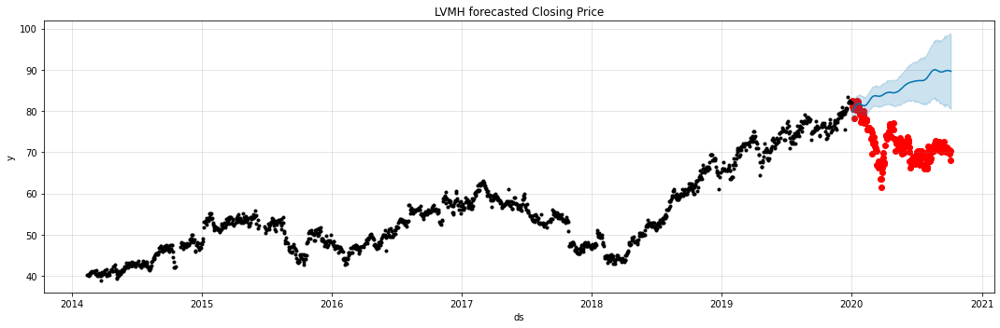

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(X_test.ds, X_test['y'], color='r')
plt.title('LVMH forecasted Closing Price')
fig = model.plot(X_test_forecast, ax=ax)

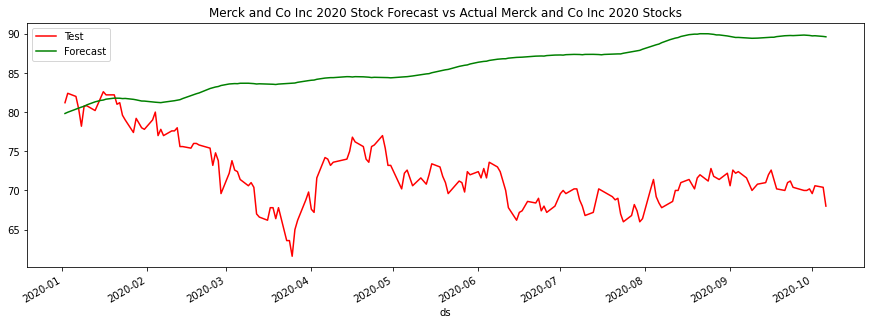

In [ ]:
#Compare the test Sales and forecasted Sales
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Test', ax=ax)
X_test_forecast.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Merck and Co Inc 2020 Stock Forecast vs Actual Merck and Co Inc 2020 Stocks')
plt.show()

We can see from the above plot, that there is huge gap in prediction.Our model did not do so well.

We'll now determine our model precision by cross validating on historical data. Here we'll cross-validate 1 year every half year after 500 days.

In [ ]:
#Cross-validate 1 year every half year after 500 days
merck_cv = cross_validation(model, initial='500 days', period='180 days', horizon='365 days')

INFO:fbprophet:Making 8 forecasts with cutoffs between 2015-07-20 00:00:00 and 2018-12-31 00:00:00


In [ ]:
#Extracting measures of performance
merck_pm = performance_metrics(merck_cv)
#Displaying the final inaccuracies
merck_pm.tail(3)

,horizon,mse,rmse,mae,mape,mdape,coverage
326,363 days,350.886812,18.731973,14.763132,0.240113,0.152025,0.502703
327,364 days,351.943855,18.760167,14.743747,0.239643,0.150175,0.514865
328,365 days,347.216524,18.633747,14.597272,0.236772,0.150159,0.523243


Facebook team prefers mean absolute percentage error (MAPE) when determining the accuracy of a forecast using prophet.

Prophet was able to achieve a 23.67% MAPE on a 365-day forecast of the IBM data.

We'll take a closer look by visualizing MAPE over varying horizon lengths.

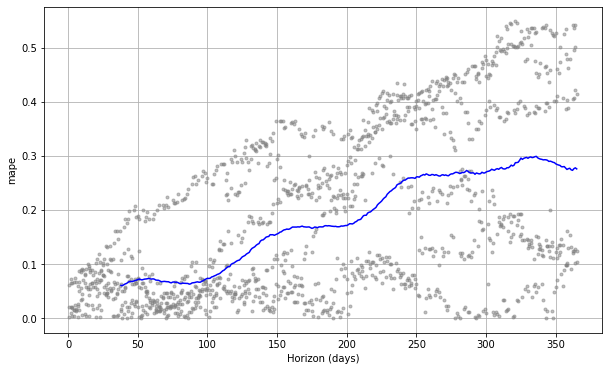

In [ ]:
# visualize mape across horizon 
fig = plot_cross_validation_metric(ibm_cv, metric='mape')

We need to optimize the model by adding other parameters like holidays, changepoints etc. in order to reduce the MAP Error.

In [ ]:
#Adding Holidays to the model.
#We will use holidays library to get the US holidays
import holidays
holiday = pd.DataFrame([])
for date, name in sorted(holidays.UnitedStates(years=[2014,2015,2016,2017,2018,2019,2020]).items()):
    holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': "US-Holidays"}, index=[0]), ignore_index=True)
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')
holiday.head()

,ds,holiday
0,2014-01-01,US-Holidays
1,2014-01-20,US-Holidays
2,2014-02-17,US-Holidays
3,2014-05-26,US-Holidays
4,2014-07-04,US-Holidays


In [ ]:
# Setup and train model with holidays
model_with_holidays = Prophet(holidays=holiday)
model_with_holidays.fit(X_train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
#Making predictions
future = model_with_holidays.make_future_dataframe(periods=270, freq='D')
forecast = model_with_holidays.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1621,2020-09-22,89.725348,80.953697,98.920781
1622,2020-09-23,89.739496,81.273589,99.122947
1623,2020-09-24,89.720451,80.688335,98.971025
1624,2020-09-25,89.780520,80.825416,98.990531
1625,2020-09-26,90.354871,81.461493,99.900253


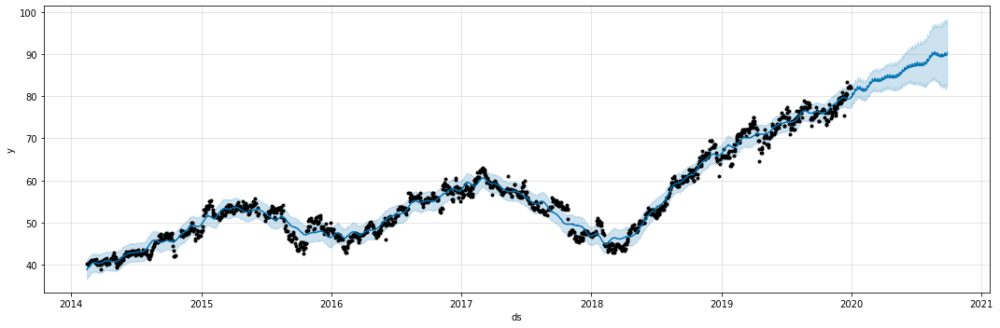

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model_with_holidays.plot(forecast,ax=ax)
plt.show()

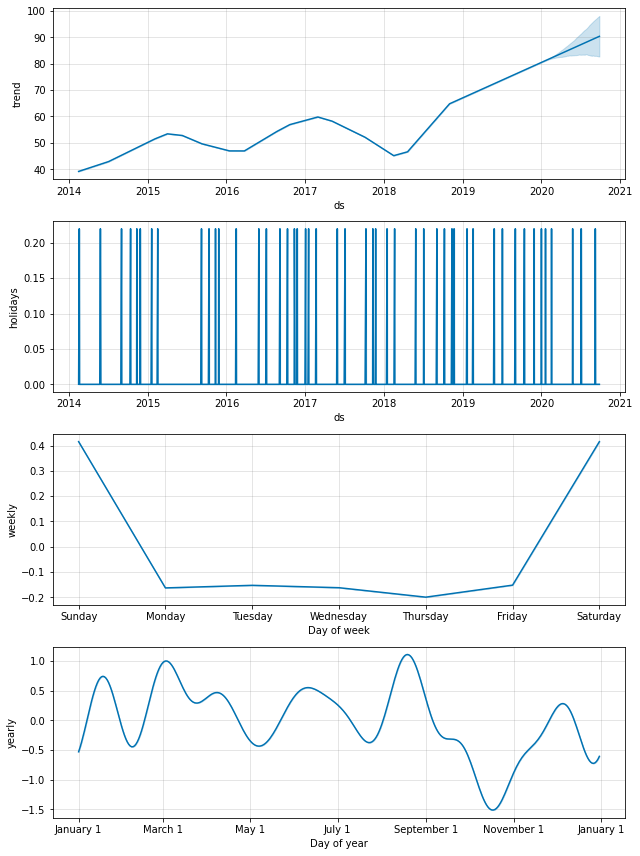

In [ ]:
# Plot the components of the model
fig = model_with_holidays.plot_components(forecast)

In [ ]:
#Creating dataframe for the predicted prices
X_test_forecast_holiday = model_with_holidays.predict(X_test)
X_test_forecast_holiday[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
180,2020-09-29,89.766794,81.552501,98.885061
181,2020-09-30,89.738804,81.315329,99.051331
182,2020-10-01,89.677595,81.055593,98.460228
183,2020-10-02,89.696794,81.278410,99.217666
184,2020-10-05,89.583263,80.476013,99.230348


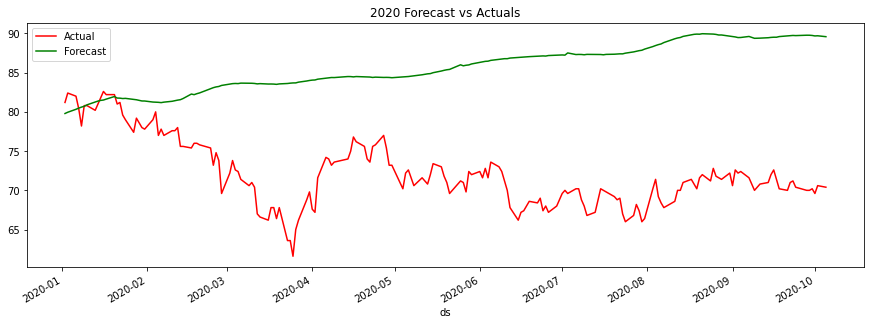

In [ ]:
#Actual vs Predicted
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Actual', ax=ax)
X_test_forecast_holiday.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('2020 Forecast vs Actuals')
plt.show()

In [ ]:
#Cross-validate 1 year every half year after 500 days
merck_cv = cross_validation(model_with_holidays, initial='500 days', period='180 days', horizon='365 days')

INFO:fbprophet:Making 8 forecasts with cutoffs between 2015-07-20 00:00:00 and 2018-12-31 00:00:00


In [ ]:
#Extracting measures of performance
merck_pm = performance_metrics(merck_cv)
#Displaying the final inaccuracies
merck_pm.tail(3)

,horizon,mse,rmse,mae,mape,mdape,coverage
326,363 days,352.993278,18.788115,14.903927,0.242937,0.154268,0.491892
327,364 days,354.134879,18.818472,14.886106,0.242502,0.151592,0.504054
328,365 days,349.240384,18.687974,14.733593,0.239524,0.149766,0.512432


From the above results, we can see that by adding holidays in the model, model performance decreased to 23.95% and we had a larger error although the difference in MAPE of the two models is not so large. We need to add other parameters to tune the model.

###HyperParameter Tuning using ParameterGrid

Along with holidays, there are many other hyperparameters which helps in optimizing the prophet model.

* Holidays
* Changepoints: (n_changepoints,changepoint_prior_scale)
* seasonality_mode
* holiday_prior_scale
* Seasonalities with fourier_order
We have added holidays to our model and saw its effect.

n_changepoints is the number of change happen in the data. Prophet model detects them by its own. By default, its value is 25, which are uniformly placed in the first 80% of the time series. Changing n_changepoints can add value to the model.

changepoint_prior_scale to indicate how flexible the changepoints are allowed to be. In other words, how much can the changepoints fit to the data. If you make it high it will be more flexible, but you can end up overfitting. By default, this parameter is set to 0.05

seasonality_mode There are 2 types model seasonality mode. Additive & multiplicaticative. By default Prophet fits additive seasonalities, meaning the effect of the seasonality is added to the trend to get the forecast. Prophet can model multiplicative seasonality by setting seasonality_mode='multiplicative' in the model.

holiday_prior_scale just like changepoint_prior_scale, holiday_prior_scale is used to smoothning the effect of holidays. By default its value is 10, which provides very little regularization. Reducing this parameter dampens holiday effects

Seasonalities with fourier_order Prophet model, by default finds the seasonalities and adds the default parameters of the seasonality. We can modify the seasonalities effect by adding custom seasonalities as add_seasonality in the model with different fourier order.Yy default Prophet uses a Fourier order of 3 for weekly seasonality and 10 for yearly seasonality.

Now, we will do the hyperparameters tuning using parametergrid. parametergrid will create all the possible parameters combination and will test the model prediction using every combination. I am taking 4 parameters: n_changepoints, changepoint_prior_scale,seasonality_mode, holiday_prior_scale for tuning.

In [ ]:
#Defining the MAP error 
import numpy as np
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
#Checking the total number of possible models
from sklearn.model_selection import ParameterGrid
params_grid = {'seasonality_mode':('multiplicative','additive'),
               'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'n_changepoints' : [25,50]}
grid = ParameterGrid(params_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

print('Total Possible Models',cnt)

Total Possible Models 100


Prophet model tuning

In [ ]:
import random
strt='2019-12-31'
end='2020-09-30'
model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
for p in grid:
    test = pd.DataFrame()
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_mode = p['seasonality_mode'],
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         holidays=holiday, 
                         interval_width=0.95)
    train_model.add_country_holidays(country_name='US')
    train_model.fit(X_train)
    train_forecast = train_model.make_future_dataframe(periods=270, freq='D',include_history = False)
    train_forecast = train_model.predict(train_forecast)
    test=train_forecast[['ds','yhat']]
    Actual = merck_data[(merck_data['ds']>strt) & (merck_data['ds']<=end)]
    MAPE = mean_absolute_percentage_error(X_test['y'],X_test_forecast['yhat'])
    print('Mean Absolute Percentage Error(MAPE)------------------------------------',MAPE)
    model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)

{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 19.4056404216291
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 19.4056404216291
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 19.4056404216291
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 19.4056404216291
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------

In [ ]:
parameters = model_parameters.sort_values(by=['MAPE'])
parameters = parameters.reset_index(drop=True)
parameters.head()

,MAPE,Parameters
0,19.40564,"{'changepoint_prior_scale': 0.1, 'holidays_pri..."
1,19.40564,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
2,19.40564,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
3,19.40564,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
4,19.40564,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."


Out of total 100 models, we will select the parameters which has the least MAPE to train the final model and predict the next monthly stocks of Merck and Co Inc.

In [ ]:
#Best Parameters on which the model has the least MAPE
parameters['Parameters'][0]

{'changepoint_prior_scale': 0.1,
 'holidays_prior_scale': 0.1,
 'n_changepoints': 25,
 'seasonality_mode': 'multiplicative'}

In [ ]:
# Setup and train model with holidays
final_model = Prophet(holidays=holiday,
                      changepoint_prior_scale= 0.1,
                      holidays_prior_scale = 0.1,
                      n_changepoints = 25,
                      seasonality_mode = 'multiplicative',
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)
final_model.add_country_holidays(country_name='US')
final_model.fit(X_train)

In [ ]:
#Making predictions
future = final_model.make_future_dataframe(periods=270, freq='D')
forecast = final_model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1621,2020-09-22,88.637550,43.665500,129.216435
1622,2020-09-23,88.632923,42.529424,129.155485
1623,2020-09-24,88.594345,42.023117,129.282078
1624,2020-09-25,88.759027,42.584861,130.539765
1625,2020-09-26,75.617038,37.247049,111.037686


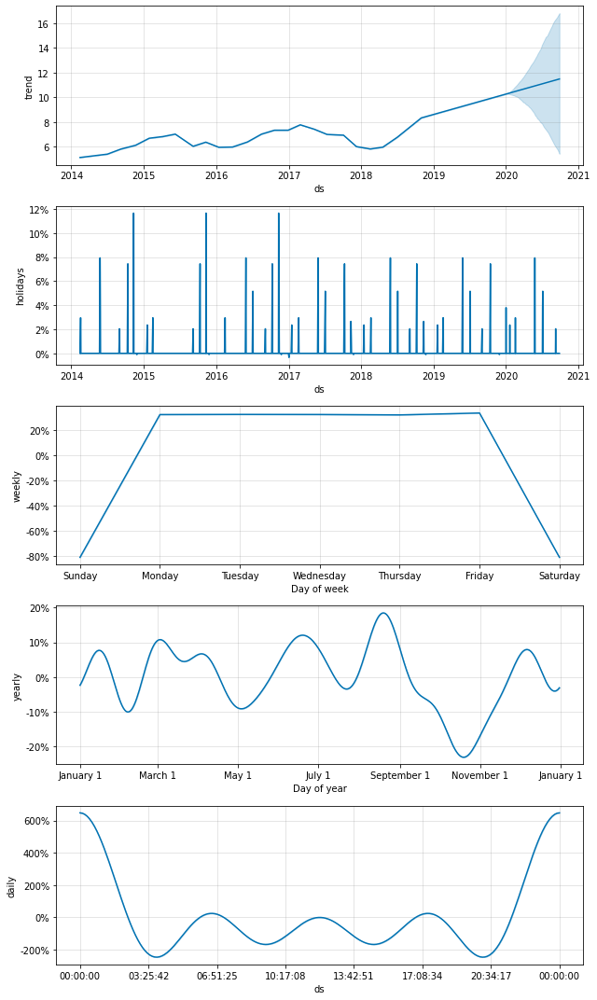

In [ ]:
# Plot the components of the model
fig = final_model.plot_components(forecast)

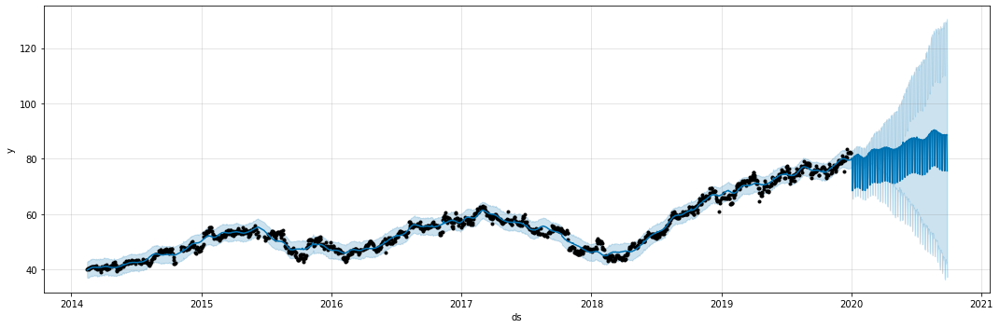

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_model.plot(forecast,ax=ax)
plt.show()

In [ ]:
##Creating dataframe for the predicted prices
X_test_final= final_model.predict(X_test)
X_test_final[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
180,2020-09-29,88.538073,47.974661,127.334313
181,2020-09-30,88.487928,46.233850,126.839103
182,2020-10-01,88.401213,47.239025,127.104975
183,2020-10-02,88.517457,45.670705,127.074234
184,2020-10-05,88.182046,45.546096,127.392152


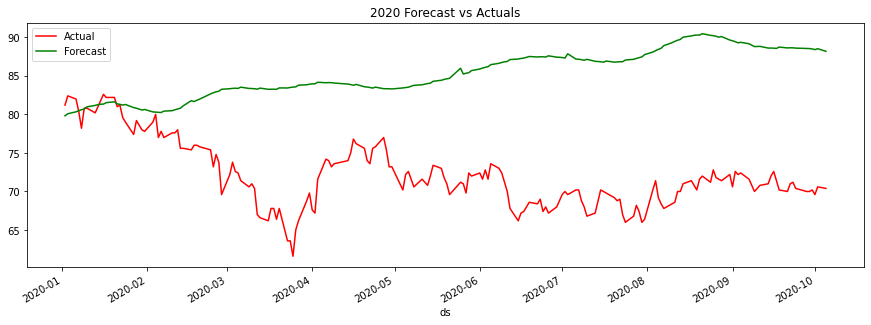

In [ ]:
#Actual vs Predicted
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Actual', ax=ax)
X_test_final.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('2020 Forecast vs Actuals')
plt.show()

In [ ]:
#Cross-validate 1 year every half year after 500 days
merck_cv = cross_validation(final_model, initial='500 days', period='180 days', horizon='365 days')
#Extracting measures of performance
merck_pm = performance_metrics(merck_cv)
#Displaying the final inaccuracies
merck_pm.tail(3)

INFO:fbprophet:Making 8 forecasts with cutoffs between 2015-07-20 00:00:00 and 2018-12-31 00:00:00


,horizon,mse,rmse,mae,mape,mdape,coverage
326,363 days,378.939383,19.466365,15.584777,0.263957,0.212462,1.0
327,364 days,379.448152,19.479429,15.523051,0.262949,0.212462,1.0
328,365 days,369.935657,19.233711,15.208681,0.257318,0.204044,1.0


Tuning our parameters did not help a lot, it actually got worse and we ended up with a larger error i.e. 25.73%

From the graph, we can also tell that there is still a huge gap between the actual values and our predicted values.

In conclusion, the Prophet model does not do too well in predicting Merck and Co Inc's 2020 stocks.

#LVMH PROPHET MODEL

1.) Import necessary packages and read the dataset

In [ ]:
#Installing quandl
!pip install quandl
import quandl

In [ ]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
#prophet model 
from fbprophet import Prophet
#prophet preformance
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

In [ ]:
#Setting the configuration key
quandl.ApiConfig.api_key = "rX4jfEfpeNZb4ozAPj5c"

In [ ]:
#Loading the dataset in our colab notebook.
lvmh_data = quandl.get('EURONEXT/MC')
#Resetting the index
lvmh_data.reset_index(level=0, inplace=True)
#Changing the last column to close
lvmh_data = lvmh_data.rename(columns={'Last':'Close'})
lvmh_data.head()

,Date,Open,High,Low,Close,Volume,Turnover
0,2014-02-14,133.95,135.05,132.75,134.80,884136.0,1.189604e+08
1,2014-02-17,135.50,135.75,134.85,135.20,453221.0,6.131023e+07
2,2014-02-18,135.65,136.10,134.80,135.75,682066.0,9.245102e+07
3,2014-02-19,135.40,136.45,135.10,136.25,646308.0,8.783046e+07
4,2014-02-20,135.00,137.15,134.50,137.15,777457.0,1.060057e+08


In [ ]:
#Get new dataframe with date & lvmh closing price
lvmh_data = lvmh_data[['Date','Close']]
lvmh_data.head()

,Date,Close
0,2014-02-14,134.80
1,2014-02-17,135.20
2,2014-02-18,135.75
3,2014-02-19,136.25
4,2014-02-20,137.15


In [ ]:
#Prophet looks for two fields from input data: time ds and values y
#Column names for prophet compliance
lvmh_data.columns = ['ds','y']

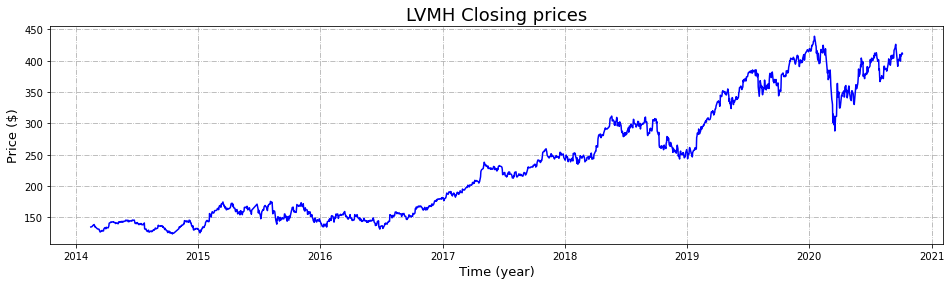

In [ ]:
#Plotting the data to see the trend in closing prices for lvmh

plt.figure(figsize=(16,4))
plt.grid(linestyle='-.')
plt.plot(lvmh_data.ds, lvmh_data.y, 'b')

# set title & labels
plt.title('LVMH Closing prices', fontsize=18)
plt.ylabel('Price ($)', fontsize=13)
plt.xlabel('Time (year)', fontsize=13)

# display graph
plt.show()

In [ ]:
#Dividing the dataset into train and test. The train has data up to December, 2019. Test Data has from January, 2020.
end_date = '2019-12-31'
mask1 = (lvmh_data['ds'] <= end_date)
mask2 = (lvmh_data['ds'] > end_date)
X_train = lvmh_data.loc[mask1]
X_test = lvmh_data.loc[mask2]
print("train shape",X_train.shape)
print("test shape",X_test.shape)

train shape (1471, 2)
test shape (196, 2)


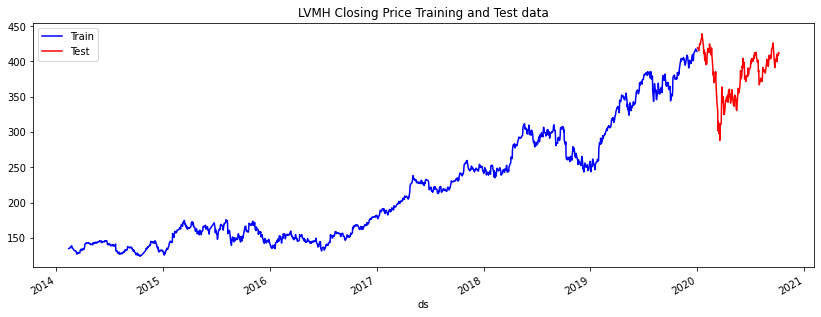

In [ ]:
#Plotting the Closing price for the train and test data
pd.plotting.register_matplotlib_converters()
f, ax = plt.subplots(figsize=(14,5))
X_train.plot(kind='line', x='ds', y='y', color='blue', label='Train', ax=ax)
X_test.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
plt.title('LVMH Closing Price Training and Test data')
plt.show()

In [ ]:
#Fitting the model to the train data
model =Prophet()
model.fit(X_train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Now, we will predict by creating future dataframe next dates of train data. The predcition will be done for train data as well.

In [ ]:
#Making predictions
future = model.make_future_dataframe(periods=57, freq='D')
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1523,2020-02-22,433.791259,422.126853,446.692450
1524,2020-02-23,434.432224,421.344429,446.957681
1525,2020-02-24,432.565662,421.978884,444.851061
1526,2020-02-25,433.397620,421.013263,446.015973
1527,2020-02-26,434.094850,421.762599,445.883470


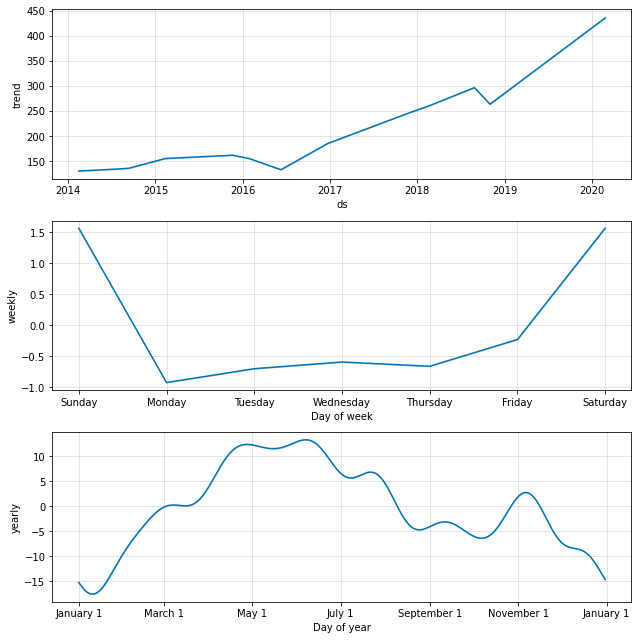

In [ ]:
# Plot the components of the model
fig = model.plot_components(forecast)

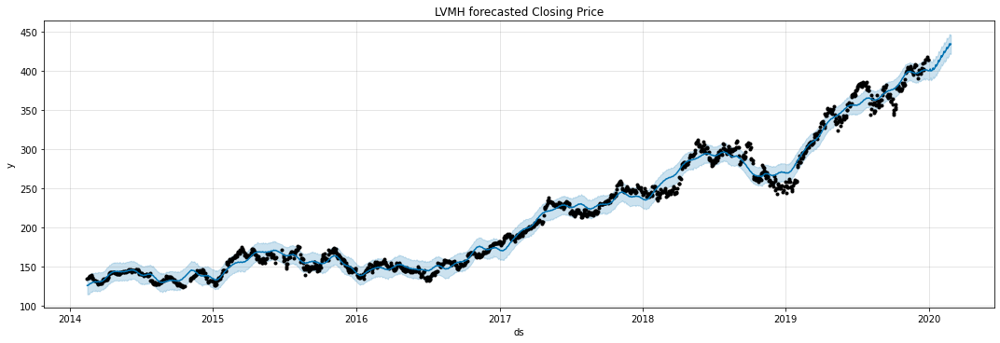

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model.plot(forecast,ax=ax)
plt.title('LVMH forecasted Closing Price')
plt.show()

Actual vs Predicted

In [ ]:
#Creating dataframe for the predicted prices
X_test_forecast = model.predict(X_test)
X_test_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
189,2020-09-28,505.813123,458.388016,551.556450
190,2020-09-29,506.220988,455.429397,552.463143
191,2020-09-30,506.526997,458.238876,552.846255
192,2020-10-01,506.673041,456.664561,554.654584
193,2020-10-02,507.339243,456.789013,553.952089
194,2020-10-05,507.488510,456.127029,554.484514
195,2020-10-06,508.048979,456.126445,555.762797


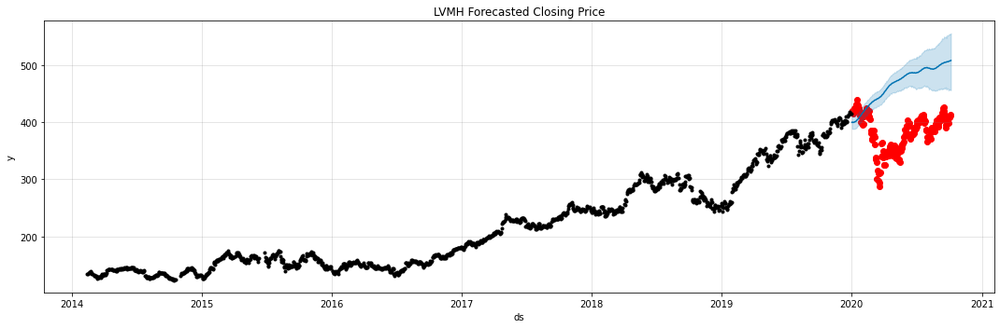

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(X_test.ds, X_test['y'], color='r')
plt.title('LVMH Forecasted Closing Price')
fig = model.plot(X_test_forecast, ax=ax)

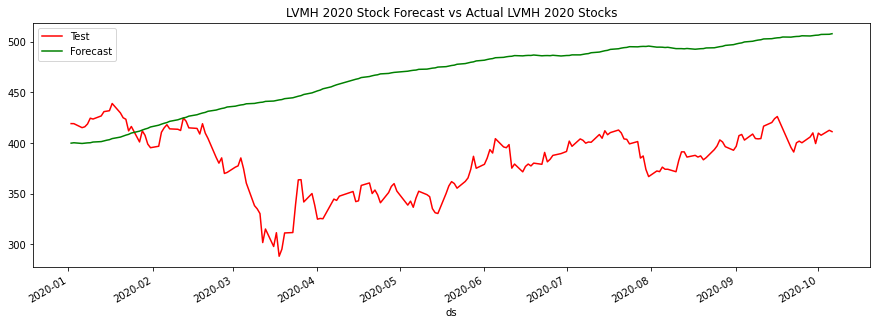

In [ ]:
#Compare the test Sales and forecasted Sales
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Test', ax=ax)
X_test_forecast.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('LVMH 2020 Stock Forecast vs Actual LVMH 2020 Stocks')
plt.show()

We can see from the above plot, that there is huge gap in prediction.Our model did not do so well.

We'll now determine our model precision by cross validating on historical data. Here we'll cross-validate 1 year every half year after 500 days.

In [ ]:
#Cross-validate 1 year every half year after 500 days
lvmh_cv = cross_validation(model, initial='500 days', period='180 days', horizon='365 days')

INFO:fbprophet:Making 8 forecasts with cutoffs between 2015-07-20 00:00:00 and 2018-12-31 00:00:00


In [ ]:
#Extracting measures of performance
lvmh_pm = performance_metrics(lvmh_cv)
#Displaying the final inaccuracies
lvmh_pm.tail(3)

,horizon,mse,rmse,mae,mape,mdape,coverage
327,363 days,4555.027238,67.490942,53.307136,0.218107,0.209426,0.311987
328,364 days,4598.910925,67.815271,53.697221,0.219040,0.209426,0.312315
329,365 days,4647.283027,68.170984,54.003483,0.219468,0.209426,0.312315


Facebook team prefers mean absolute percentage error (MAPE) when determining the accuracy of a forecast using prophet.

Prophet was able to achieve a 21.94% MAPE on a 365-day forecast of the IBM data.

We'll take a closer look by visualizing MAPE over varying horizon lengths.

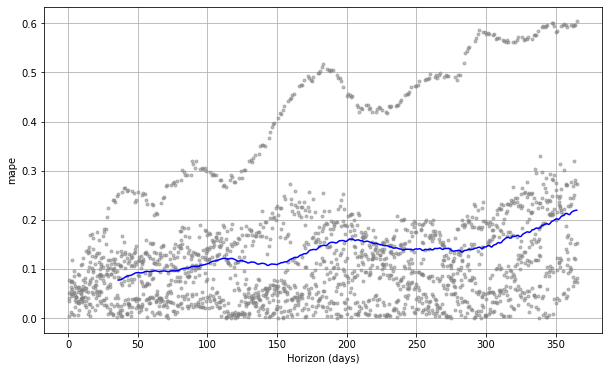

In [ ]:
# visualize mape across horizon 
fig = plot_cross_validation_metric(lvmh_cv, metric='mape')

We need to optimize the model by adding other parameters like holidays, changepoints etc. in order to reduce the MAP Error.

In [ ]:
#Adding Holidays to the model.
#We will use holidays library to get the US holidays
import holidays
holiday = pd.DataFrame([])
for date, name in sorted(holidays.UnitedStates(years=[2014,2015,2016,2017,2018,2019,2020]).items()):
    holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': "US-Holidays"}, index=[0]), ignore_index=True)
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')
holiday.head()

,ds,holiday
0,2014-01-01,US-Holidays
1,2014-01-20,US-Holidays
2,2014-02-17,US-Holidays
3,2014-05-26,US-Holidays
4,2014-07-04,US-Holidays


In [ ]:
# Setup and train model with holidays
model_with_holidays = Prophet(holidays=holiday)
model_with_holidays.fit(X_train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
#Making predictions
future = model_with_holidays.make_future_dataframe(periods=57, freq='D')
forecast = model_with_holidays.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1523,2020-02-22,433.777821,421.275514,446.685823
1524,2020-02-23,434.416862,422.667826,447.891600
1525,2020-02-24,432.313561,419.036527,444.239409
1526,2020-02-25,433.238278,421.695504,445.450185
1527,2020-02-26,433.933427,421.092278,446.304329


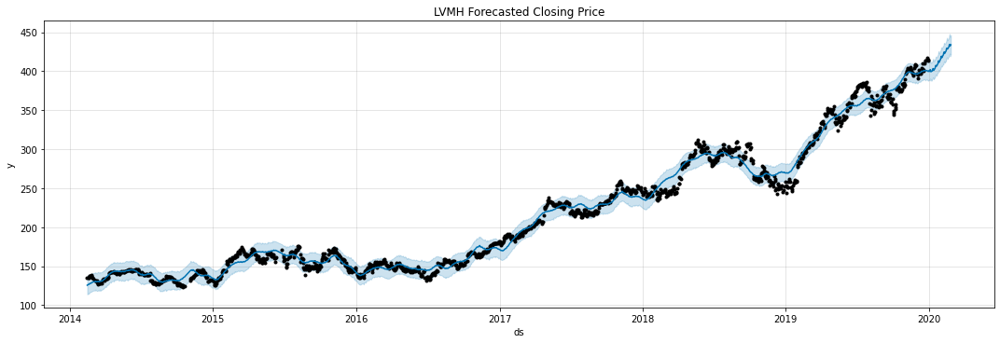

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model_with_holidays.plot(forecast,ax=ax)
plt.title('LVMH Forecasted Closing Price')
plt.show()

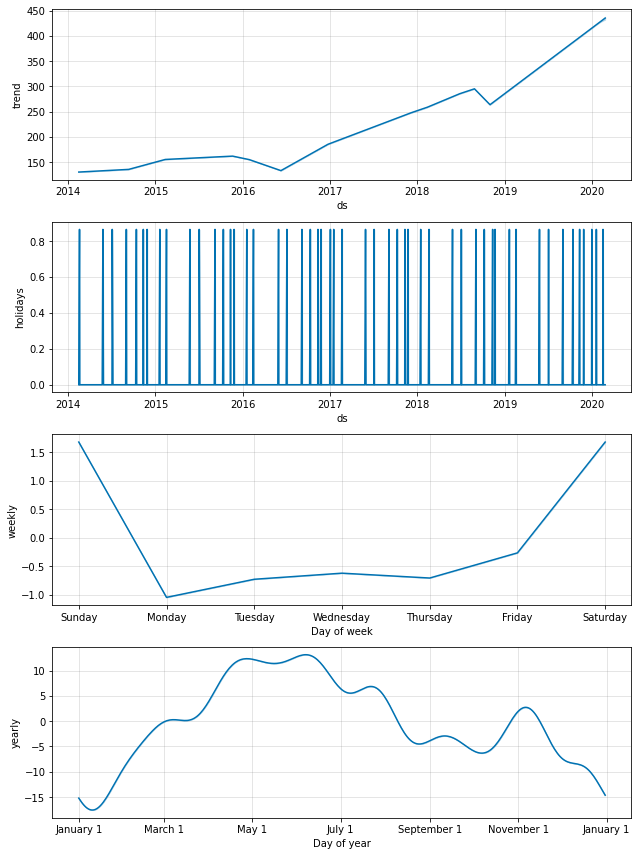

In [ ]:
# Plot the components of the model
fig = model_with_holidays.plot_components(forecast)

In [ ]:
#Creating dataframe for the predicted prices
X_test_forecast_holiday = model_with_holidays.predict(X_test)
X_test_forecast_holiday[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
191,2020-09-30,506.301184,459.056473,547.517167
192,2020-10-01,506.421786,458.296610,545.860399
193,2020-10-02,507.088391,457.900305,549.012642
194,2020-10-05,507.123329,457.047489,550.556318
195,2020-10-06,507.768674,457.696173,551.394650


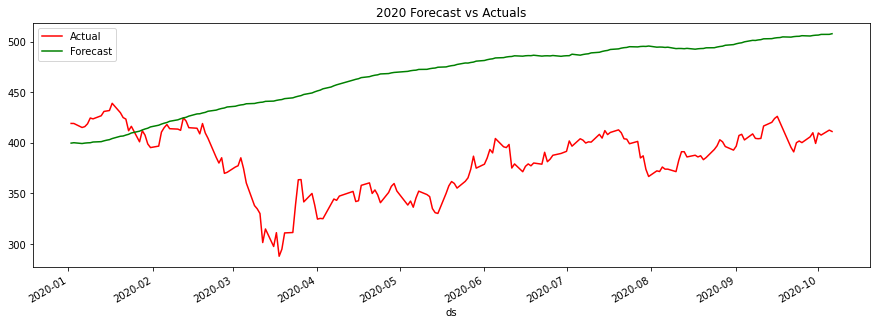

In [ ]:
#Actual vs Predicted
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Actual', ax=ax)
X_test_forecast_holiday.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('2020 Forecast vs Actuals')
plt.show()

There is no improvement in our prediction.

In [ ]:
#Cross-validate 1 year every half year after 500 days
lvmh_cv = cross_validation(model_with_holidays, initial='500 days', period='180 days', horizon='365 days')

INFO:fbprophet:Making 8 forecasts with cutoffs between 2015-07-20 00:00:00 and 2018-12-31 00:00:00


In [ ]:
#Extracting measures of performance
lvmh_pm = performance_metrics(lvmh_cv)
#Displaying the final inaccuracies
lvmh_pm.tail(3)

,horizon,mse,rmse,mae,mape,mdape,coverage
327,363 days,4569.285606,67.596491,53.509012,0.219571,0.216088,0.302135
328,364 days,4612.711987,67.916949,53.888010,0.220458,0.216088,0.302463
329,365 days,4661.137415,68.272523,54.194073,0.220892,0.216088,0.306404


From the above results, we can see that by adding holidays in the model, model performance further decreased and we had a larger error i.e. 22.08% We need to add other parameters to tune the model.

###HyperParameter Tuning using ParameterGrid

Along with holidays, there are many other hyperparameters which helps in optimizing the prophet model.

* Holidays
* Changepoints: (n_changepoints,changepoint_prior_scale)
* seasonality_mode
* holiday_prior_scale
* Seasonalities with fourier_order
We have added holidays to our model and saw its effect.

n_changepoints is the number of change happen in the data. Prophet model detects them by its own. By default, its value is 25, which are uniformly placed in the first 80% of the time series. Changing n_changepoints can add value to the model.

changepoint_prior_scale to indicate how flexible the changepoints are allowed to be. In other words, how much can the changepoints fit to the data. If you make it high it will be more flexible, but you can end up overfitting. By default, this parameter is set to 0.05

seasonality_mode There are 2 types model seasonality mode. Additive & multiplicaticative. By default Prophet fits additive seasonalities, meaning the effect of the seasonality is added to the trend to get the forecast. Prophet can model multiplicative seasonality by setting seasonality_mode='multiplicative' in the model.

holiday_prior_scale just like changepoint_prior_scale, holiday_prior_scale is used to smoothning the effect of holidays. By default its value is 10, which provides very little regularization. Reducing this parameter dampens holiday effects

Seasonalities with fourier_order Prophet model, by default finds the seasonalities and adds the default parameters of the seasonality. We can modify the seasonalities effect by adding custom seasonalities as add_seasonality in the model with different fourier order.Yy default Prophet uses a Fourier order of 3 for weekly seasonality and 10 for yearly seasonality.

Now, we will do the hyperparameters tuning using parametergrid. parametergrid will create all the possible parameters combination and will test the model prediction using every combination. I am taking 4 parameters: n_changepoints, changepoint_prior_scale,seasonality_mode, holiday_prior_scale for tuning.

In [ ]:
#Defining the MAP error 
import numpy as np
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
#Checking the total number of possible models
from sklearn.model_selection import ParameterGrid
params_grid = {'seasonality_mode':('multiplicative','additive'),
               'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'n_changepoints' : [25,50,75,100]}
grid = ParameterGrid(params_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

print('Total Possible Models',cnt)

Total Possible Models 200


Prophet model tuning

In [ ]:
import random
strt='2019-12-31'
end='2020-09-30'
model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
for p in grid:
    test = pd.DataFrame()
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_mode = p['seasonality_mode'],
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         holidays=holiday, 
                         interval_width=0.95)
    train_model.add_country_holidays(country_name='US')
    train_model.fit(X_train)
    train_forecast = train_model.make_future_dataframe(periods=270, freq='D',include_history = False)
    train_forecast = train_model.predict(train_forecast)
    test=train_forecast[['ds','yhat']]
    Actual = lvmh_data[(lvmh_data['ds']>strt) & (lvmh_data['ds']<=end)]
    MAPE = mean_absolute_percentage_error(X_test['y'],X_test_forecast['yhat'])
    print('Mean Absolute Percentage Error(MAPE)------------------------------------',MAPE)
    model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)

{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 23.526589190647552
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 23.526589190647552
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 23.526589190647552
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 23.526589190647552
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 75, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAP

In [ ]:
parameters = model_parameters.sort_values(by=['MAPE'])
parameters = parameters.reset_index(drop=True)
parameters.head()

,MAPE,Parameters
0,23.526589,"{'changepoint_prior_scale': 0.1, 'holidays_pri..."
1,23.526589,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
2,23.526589,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
3,23.526589,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
4,23.526589,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."


Out of total 100 models, we will select the parameters which has the least MAPE to train the final model and predict the next monthly stocks of LVMH.

In [ ]:
#Best Parameters on which the model has the least MAPE
parameters['Parameters'][0]

{'changepoint_prior_scale': 0.1,
 'holidays_prior_scale': 0.1,
 'n_changepoints': 25,
 'seasonality_mode': 'multiplicative'}

In [ ]:
# Setup and train model with holidays
final_model = Prophet(holidays=holiday,
                      changepoint_prior_scale= 0.1,
                      holidays_prior_scale = 0.1,
                      n_changepoints = 25,
                      seasonality_mode = 'multiplicative',
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)
final_model.add_country_holidays(country_name='US')
final_model.fit(X_train)

In [ ]:
#Making predictions
future = final_model.make_future_dataframe(periods=270, freq='D')
forecast = final_model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1736,2020-09-22,508.774887,264.994123,778.896832
1737,2020-09-23,508.616872,258.707098,773.656602
1738,2020-09-24,508.456658,258.406927,773.064269
1739,2020-09-25,510.003434,253.481185,777.041968
1740,2020-09-26,431.980900,216.782943,661.854887


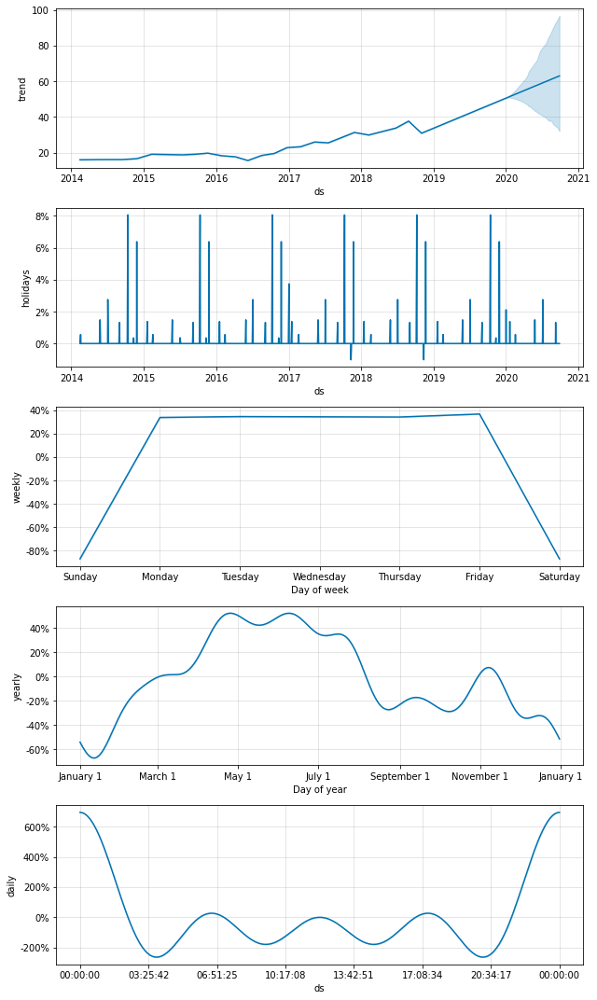

In [ ]:
# Plot the components of the model
fig = final_model.plot_components(forecast)

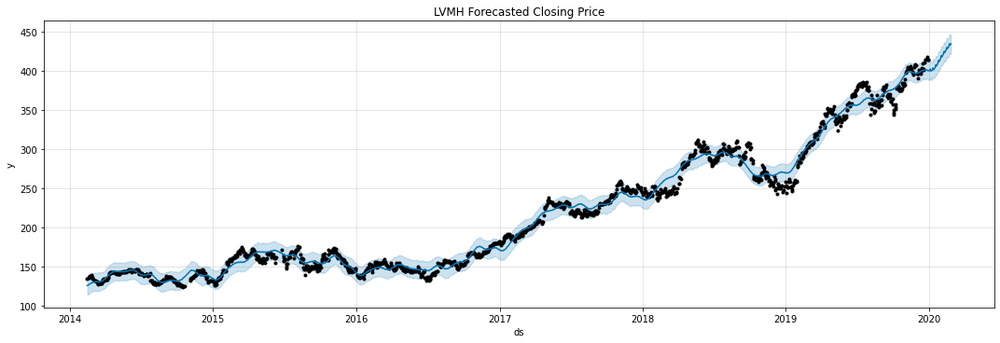

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_model.plot(forecast,ax=ax)
plt.title('LVMH Forecasted Closing Price')
plt.show()

In [ ]:
##Creating dataframe for the ACTUAL prices
X_test_final= final_model.predict(X_test)
X_test_final[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
191,2020-09-30,508.189810,243.896231,755.333983
192,2020-10-01,508.053111,243.475004,760.116503
193,2020-10-02,509.676344,240.881348,763.025302
194,2020-10-05,508.091017,234.308490,761.944612
195,2020-10-06,508.771241,237.652430,758.089047


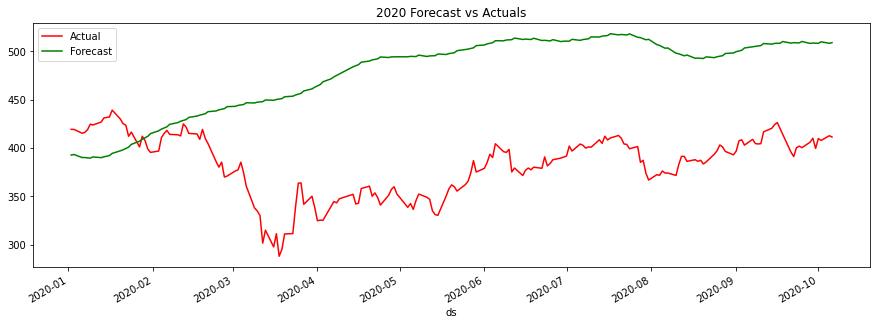

In [ ]:
#Actual vs Predicted
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Actual', ax=ax)
X_test_final.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('2020 Forecast vs Actuals')
plt.show()

In [ ]:
#Cross-validate 1 year every half year after 500 days
lvmh_cv = cross_validation(final_model, initial='500 days', period='180 days', horizon='365 days')
#Extracting measures of performance
lvmh_pm = performance_metrics(lvmh_cv)
#Displaying the final inaccuracies
lvmh_pm.tail(3)

INFO:fbprophet:Making 8 forecasts with cutoffs between 2015-07-20 00:00:00 and 2018-12-31 00:00:00


,horizon,mse,rmse,mae,mape,mdape,coverage
327,363 days,8261.088029,90.890528,74.389171,0.318076,0.284235,1.0
328,364 days,8355.909013,91.410661,74.766406,0.319430,0.287031,1.0
329,365 days,8510.939897,92.254755,75.671584,0.322835,0.289143,1.0


Tuning our parameters did not help a lot, it actually got worse and we ended up with a larger error i.e. 32.28%

From the graph, we can also tell that there is still a huge gap between the actual values and our predicted values.

In conclusion, the Prophet model does not do too well in predicting the LVMH's 2020 stocks.

#IBM FACEBOOK'SPROPHET MODEL

## Import necessary packages and read the dataset

In [ ]:
#Installing quandl
!pip install quandl
import quandl

In [ ]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
#prophet model 
from fbprophet import Prophet
#prophet preformance
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

In [ ]:
#Setting the configuration key
quandl.ApiConfig.api_key = "rX4jfEfpeNZb4ozAPj5c"

In [ ]:
#Loading the dataset in our colab notebook.
ibm = quandl.get('EURONEXT/IBMA')
#Resetting the index
ibm.reset_index(level=0, inplace=True)
#Changing the last column to close
ibm = ibm.rename(columns={'Last':'Close'})
ibm.head()

,Date,Open,High,Low,Close,Volume,Turnover
0,2014-01-22,187.00,187.00,187.00,187.00,25.0,3446.12
1,2014-08-29,211.00,211.00,211.00,211.00,8.0,1279.95
2,2014-09-02,210.95,210.95,210.95,210.95,44.0,7077.25
3,2014-10-03,205.00,205.00,205.00,205.00,20.0,3249.84
4,2015-01-29,140.00,140.00,140.00,140.00,50.0,6186.48


In [ ]:
#Get new dataframe with date & ibm closing price
ibm = ibm[['Date','Close']]
ibm.head()

,Date,Close
0,2014-01-22,187.00
1,2014-08-29,211.00
2,2014-09-02,210.95
3,2014-10-03,205.00
4,2015-01-29,140.00


In [ ]:
#Prophet looks for two fields from input data: time ds and values y
#Column names for prophet compliance
ibm.columns = ['ds','y']

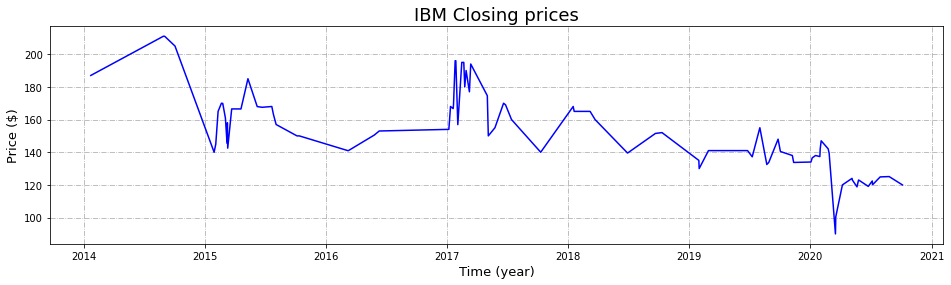

In [ ]:
#Plotting the data to see the trend in closing prices for ibm

plt.figure(figsize=(16,4))
plt.grid(linestyle='-.')
plt.plot(ibm.ds, ibm.y, 'b')

# set title & labels
plt.title('IBM Closing prices', fontsize=18)
plt.ylabel('Price ($)', fontsize=13)
plt.xlabel('Time (year)', fontsize=13)

# display graph
plt.show()

In [ ]:
#Dividing the dataset into train and test. The train has data up to December, 2019. Test Data has from January, 2020.
end_date = '2019-12-31'
mask1 = (ibm['ds'] <= end_date)
mask2 = (ibm['ds'] > end_date)
X_train = ibm.loc[mask1]
X_test = ibm.loc[mask2]
print("train shape",X_train.shape)
print("test shape",X_test.shape)

train shape (72, 2)
test shape (23, 2)


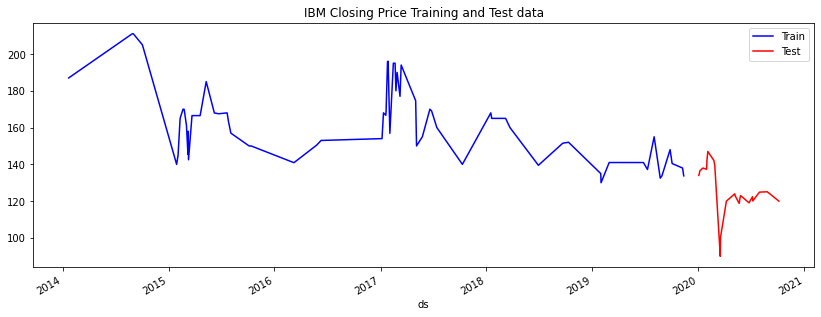

In [ ]:
#Plotting the Closing price for the train and test data
pd.plotting.register_matplotlib_converters()
f, ax = plt.subplots(figsize=(14,5))
X_train.plot(kind='line', x='ds', y='y', color='blue', label='Train', ax=ax)
X_test.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
plt.title('IBM Closing Price Training and Test data')
plt.show()

In [ ]:
#Fitting the model to the train data
model =Prophet()
model.fit(X_train)

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Now, we will predict by creating future dataframe next dates of train data. The predcition will be done for train data as well.

In [ ]:
#Making predictions
future = model.make_future_dataframe(periods=57, freq='D')
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
124,2020-01-04,-129.744512,-146.272942,-112.986741
125,2020-01-05,-120.017224,-137.355820,-104.466315
126,2020-01-06,116.984783,100.486249,134.834378
127,2020-01-07,118.132657,101.043872,134.923342
128,2020-01-08,126.102363,108.640523,144.481413


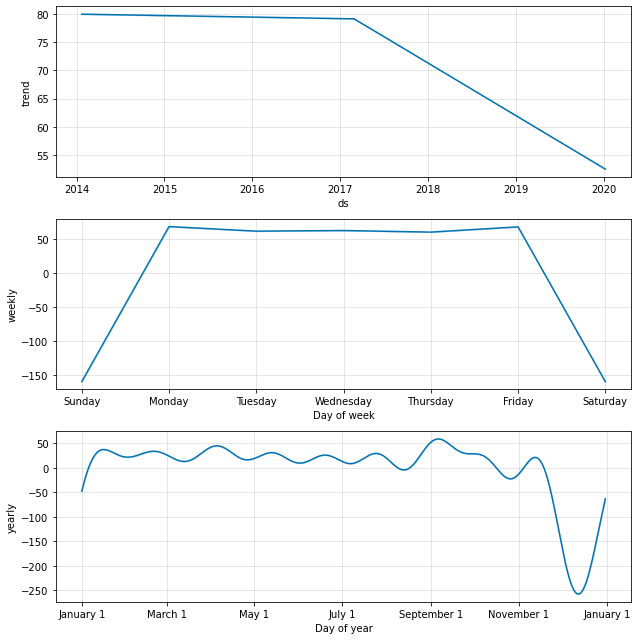

In [ ]:
# Plot the components of the model
fig = model.plot_components(forecast)

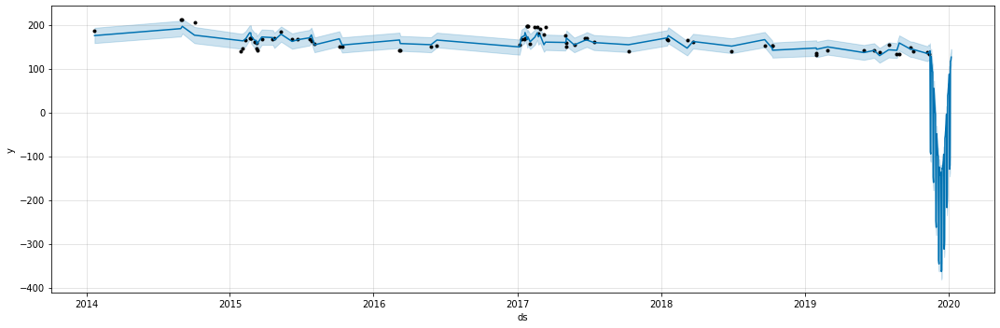

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model.plot(forecast,ax=ax)
plt.show()

Actual vs Predicted

In [ ]:
#Creating dataframe for the predicted prices
X_test_forecast = model.predict(X_test)
X_test_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
16,2020-06-24,133.629520,116.518721,150.093490
17,2020-07-06,125.005656,107.508040,142.126040
18,2020-07-07,118.186767,101.808448,136.421458
19,2020-07-22,138.631394,120.843315,156.850290
20,2020-07-30,130.917096,112.503162,148.317007
21,2020-08-26,142.566102,125.345933,161.764843
22,2020-10-05,140.929911,123.757061,159.323473


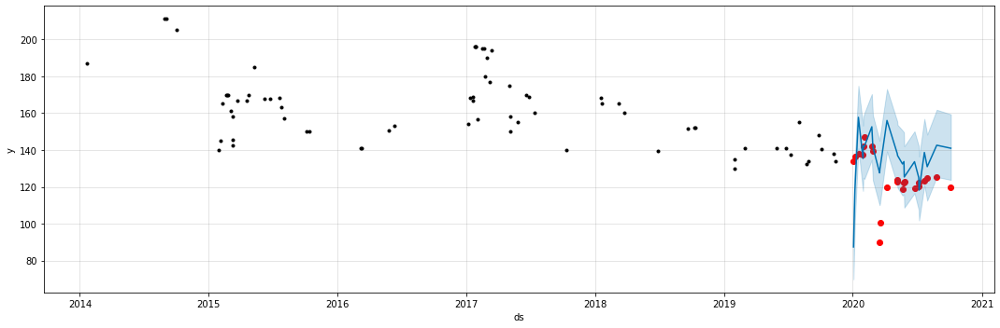

In [ ]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(X_test.ds, X_test['y'], color='r')
fig = model.plot(X_test_forecast, ax=ax)

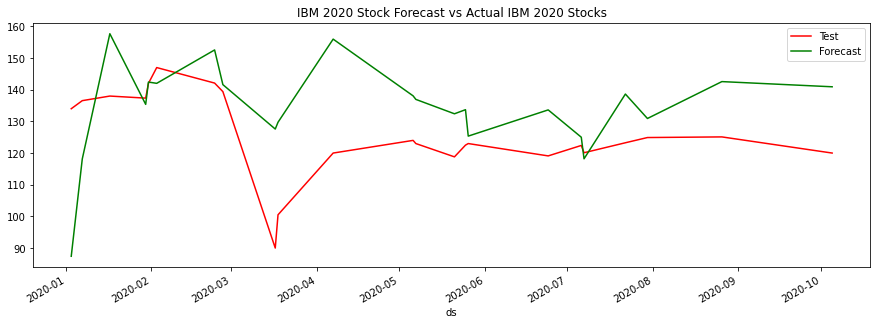

In [ ]:
#Compare the test Sales and forecasted Sales
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Test', ax=ax)
X_test_forecast.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('IBM 2020 Stock Forecast vs Actual IBM 2020 Stocks')
plt.show()

We can see from the above plot, that there is huge gap in prediction.Our model did not do so well.

We'll now determine our model precision by cross validating on historical data. Here we'll cross-validate 1 year every half year after 500 days.

In [ ]:
#Cross-validate 1 year every half year after 500 days
ibm_cv = cross_validation(model, initial='500 days', period='180 days', horizon='365 days')

INFO:fbprophet:Making 7 forecasts with cutoffs between 2015-11-28 00:00:00 and 2018-11-12 00:00:00


INFO:fbprophet:n_changepoints greater than number of observations. Using 19.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


In [ ]:
#Extracting measures of performance
ibm_pm = performance_metrics(ibm_cv)
#Displaying the final inaccuracies
ibm_pm.tail(3)

,horizon,mse,rmse,mae,mape,mdape,coverage
69,361 days,4.559800e+06,2135.368766,778.987309,5.635478,0.157166,0.125
70,364 days,4.559552e+06,2135.310700,774.644724,5.603496,0.129820,0.125
71,365 days,1.188258e+07,3447.111967,1722.618120,12.694294,0.129820,0.125


Facebook team prefers mean absolute percentage error (MAPE) when determining the accuracy of a forecast using prophet.

Prophet was able to achieve a 12.69 MAPE on a 365-day forecast of the IBM data.

We'll take a closer look by visualizing MAPE over varying horizon lengths.

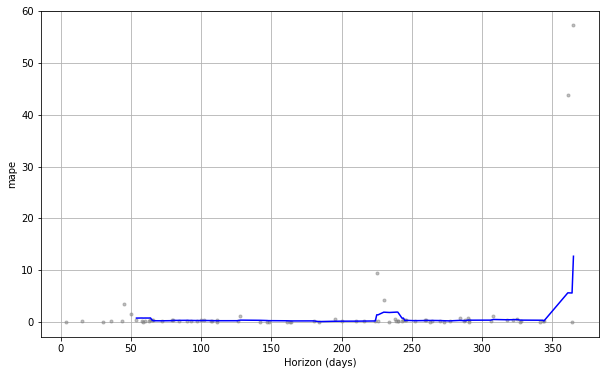

In [ ]:
# visualize mape across horizon 
fig = plot_cross_validation_metric(ibm_cv, metric='mape')

We need to optimize the model by adding other parameters like holidays, changepoints etc. in order to reduce the MAP Error.

In [ ]:
#Adding Holidays to the model.
#We will use holidays library to get the US holidays
import holidays
holiday = pd.DataFrame([])
for date, name in sorted(holidays.UnitedStates(years=[2014,2015,2016,2017,2018,2019,2020]).items()):
    holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': "US-Holidays"}, index=[0]), ignore_index=True)
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')
holiday.head()

,ds,holiday
0,2014-01-01,US-Holidays
1,2014-01-20,US-Holidays
2,2014-02-17,US-Holidays
3,2014-05-26,US-Holidays
4,2014-07-04,US-Holidays


In [ ]:
# Setup and train model with holidays
model_with_holidays = Prophet(holidays=holiday)
model_with_holidays.fit(X_train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
#Making predictions
future = model_with_holidays.make_future_dataframe(periods=57, freq='D')
forecast = model_with_holidays.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
124,2020-01-04,-129.388537,-145.193898,-111.456469
125,2020-01-05,-119.988312,-136.957452,-100.479318
126,2020-01-06,117.972498,101.422663,135.672167
127,2020-01-07,120.814861,104.454943,136.773874
128,2020-01-08,127.343195,110.915554,144.506601


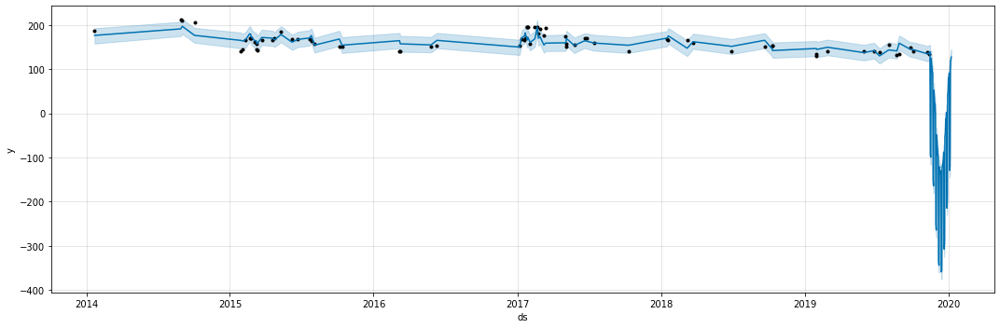

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model_with_holidays.plot(forecast,ax=ax)
plt.show()

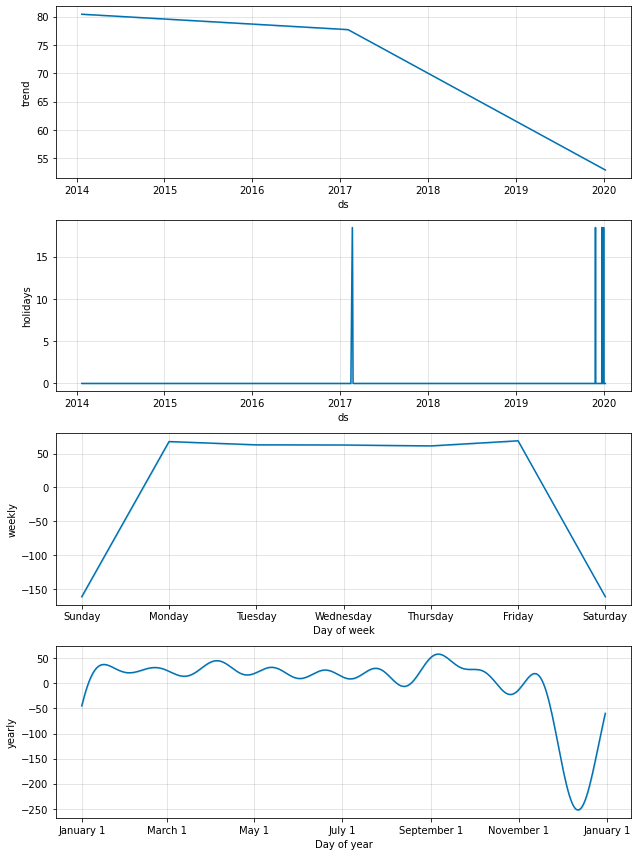

In [ ]:
# Plot the components of the model
fig = model_with_holidays.plot_components(forecast)

In [ ]:
#Creating dataframe for the predicted prices
X_test_forecast_holiday = model_with_holidays.predict(X_test)
X_test_forecast_holiday[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
18,2020-07-07,120.594629,103.663126,138.140249
19,2020-07-22,140.231002,122.958543,157.296381
20,2020-07-30,132.884201,115.686886,151.272500
21,2020-08-26,142.352891,125.599061,159.811300
22,2020-10-05,140.781884,123.346801,158.065921


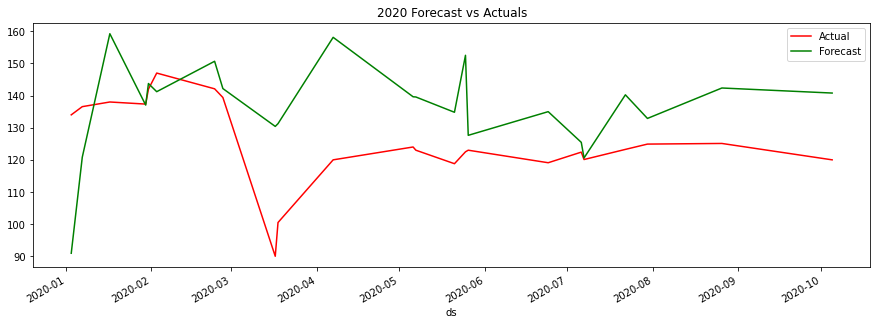

In [ ]:
#Actual vs Predicted
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Actual', ax=ax)
X_test_forecast_holiday.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('2020 Forecast vs Actuals')
plt.show()

In [ ]:
#Cross-validate 1 year every half year after 500 days
ibm_cv = cross_validation(model_with_holidays, initial='500 days', period='180 days', horizon='365 days')

INFO:fbprophet:Making 7 forecasts with cutoffs between 2015-11-28 00:00:00 and 2018-11-12 00:00:00


INFO:fbprophet:n_changepoints greater than number of observations. Using 19.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


In [ ]:
#Extracting measures of performance
ibm_pm = performance_metrics(ibm_cv)
#Displaying the final inaccuracies
ibm_pm.tail(3)

,horizon,mse,rmse,mae,mape,mdape,coverage
69,361 days,4.454391e+06,2110.542918,770.211618,5.571863,0.157174,0.125
70,364 days,4.454143e+06,2110.484169,765.869085,5.539882,0.130199,0.125
71,365 days,1.160309e+07,3406.330918,1702.441673,12.545426,0.130199,0.125


From the above results, we can see that by adding holidays in the model, model performance further increased and we had a smaller error although the difference in MAPE of the two models is not so different. We need to add other parameters to tune the model.

##HyperParameter Tuning using ParameterGrid

Along with holidays, there are many other hyperparameters which helps in optimizing the prophet model.

* Holidays
* Changepoints: (n_changepoints,changepoint_prior_scale)
* seasonality_mode
* holiday_prior_scale
* Seasonalities with fourier_order
We have added holidays to our model and saw its effect.

n_changepoints is the number of change happen in the data. Prophet model detects them by its own. By default, its value is 25, which are uniformly placed in the first 80% of the time series. Changing n_changepoints can add value to the model.

changepoint_prior_scale to indicate how flexible the changepoints are allowed to be. In other words, how much can the changepoints fit to the data. If you make it high it will be more flexible, but you can end up overfitting. By default, this parameter is set to 0.05

seasonality_mode There are 2 types model seasonality mode. Additive & multiplicaticative. By default Prophet fits additive seasonalities, meaning the effect of the seasonality is added to the trend to get the forecast. Prophet can model multiplicative seasonality by setting seasonality_mode='multiplicative' in the model.

holiday_prior_scale just like changepoint_prior_scale, holiday_prior_scale is used to smoothning the effect of holidays. By default its value is 10, which provides very little regularization. Reducing this parameter dampens holiday effects

Seasonalities with fourier_order Prophet model, by default finds the seasonalities and adds the default parameters of the seasonality. We can modify the seasonalities effect by adding custom seasonalities as add_seasonality in the model with different fourier order.Yy default Prophet uses a Fourier order of 3 for weekly seasonality and 10 for yearly seasonality.

Now, we will do the hyperparameters tuning using parametergrid. parametergrid will create all the possible parameters combination and will test the model prediction using every combination. We'll take 4 parameters: n_changepoints, changepoint_prior_scale,seasonality_mode, holiday_prior_scale for tuning.

In [ ]:
#MAP error 
import numpy as np
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
#Checking the total number of possible models
from sklearn.model_selection import ParameterGrid
params_grid = {'seasonality_mode':('multiplicative','additive'),
               'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
              'n_changepoints' : [25,50]}
grid = ParameterGrid(params_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

print('Total Possible Models',cnt)

Total Possible Models 100


Prophet model tuning

In [ ]:
import random
strt='2019-12-31'
end='2020-09-30'
model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
for p in grid:
    test = pd.DataFrame()
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_mode = p['seasonality_mode'],
                         weekly_seasonality=True,
                         daily_seasonality = True,
                         yearly_seasonality = True,
                         holidays=holiday, 
                         interval_width=0.95)
    train_model.add_country_holidays(country_name='US')
    train_model.fit(X_train)
    train_forecast = train_model.make_future_dataframe(periods=270, freq='D',include_history = False)
    train_forecast = train_model.predict(train_forecast)
    test=train_forecast[['ds','yhat']]
    Actual = ibm[(ibm['ds']>strt) & (ibm['ds']<=end)]
    MAPE = mean_absolute_percentage_error(X_test['y'],X_test_forecast['yhat'])
    print('Mean Absolute Percentage Error(MAPE)------------------------------------',MAPE)
    model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)

{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 12.487875155341312
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 12.487875155341312
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 12.487875155341312
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive'}
Mean Absolute Percentage Error(MAPE)------------------------------------ 12.487875155341312
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.2, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative'}
Mean Absolute Percentage Error(MAP

In [ ]:
parameters = model_parameters.sort_values(by=['MAPE'])
parameters = parameters.reset_index(drop=True)
parameters.head()

,MAPE,Parameters
0,12.487875,"{'changepoint_prior_scale': 0.1, 'holidays_pri..."
1,12.487875,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
2,12.487875,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
3,12.487875,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."
4,12.487875,"{'changepoint_prior_scale': 0.4, 'holidays_pri..."


Out of total 100 models, we will select the parameters which has the least MAPE to train the final model and predict the next monthly stocks of IBM.

In [ ]:
#Best Parameters on which the model has the least MAPE
parameters['Parameters'][0]

{'changepoint_prior_scale': 0.1,
 'holidays_prior_scale': 0.1,
 'n_changepoints': 25,
 'seasonality_mode': 'multiplicative'}

In [ ]:
# Setup and train model with holidays
final_model = Prophet(holidays=holiday,
                      changepoint_prior_scale= 0.1,
                      holidays_prior_scale = 0.1,
                      n_changepoints = 25,
                      seasonality_mode = 'multiplicative',
                      weekly_seasonality=True,
                      daily_seasonality = True,
                      yearly_seasonality = True,
                      interval_width=0.95)
final_model.add_country_holidays(country_name='US')
final_model.fit(X_train)

In [ ]:
#Making predictions
future = final_model.make_future_dataframe(periods=270, freq='D')
forecast = final_model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
337,2020-08-04,145.296981,17.930280,283.578374
338,2020-08-05,142.117127,17.575142,276.864187
339,2020-08-06,135.112576,17.227701,269.104267
340,2020-08-07,138.127743,18.916956,270.758329
341,2020-08-08,117.079605,11.825652,231.376099


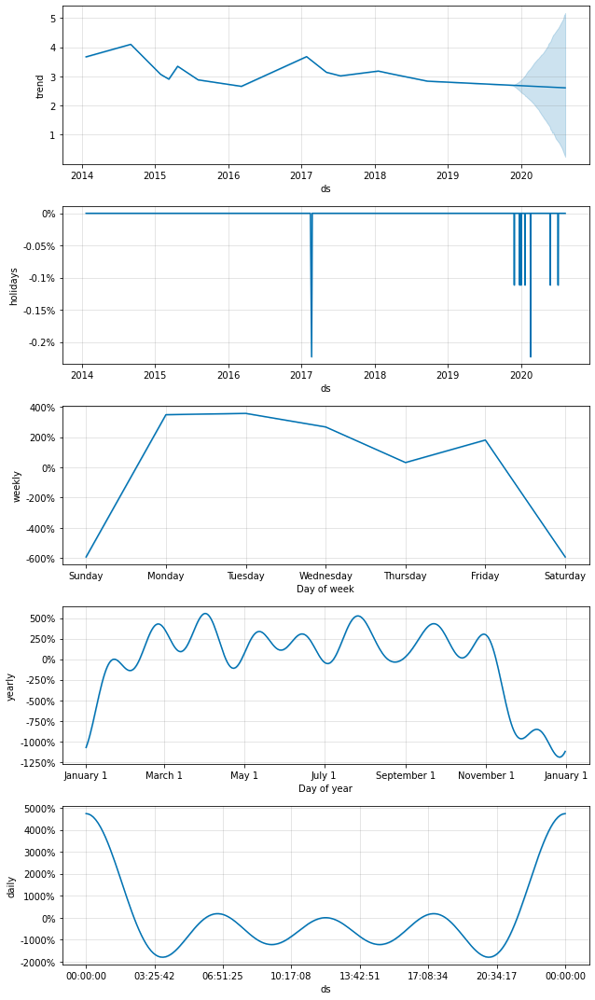

In [ ]:
# Plot the components of the model
fig = final_model.plot_components(forecast)

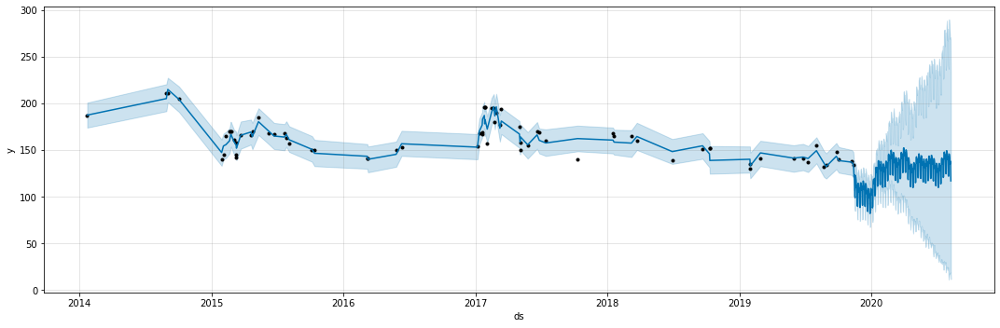

In [ ]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_model.plot(forecast,ax=ax)
plt.show()

In [ ]:
##Creating dataframe for the predicted prices
X_test_final= final_model.predict(X_test)
X_test_final[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
18,2020-07-07,135.764174,41.021896,243.317779
19,2020-07-22,146.193405,33.617489,270.876737
20,2020-07-30,140.182951,26.865765,265.863075
21,2020-08-26,132.276882,8.997508,265.151346
22,2020-10-05,138.589770,-14.403228,319.146051


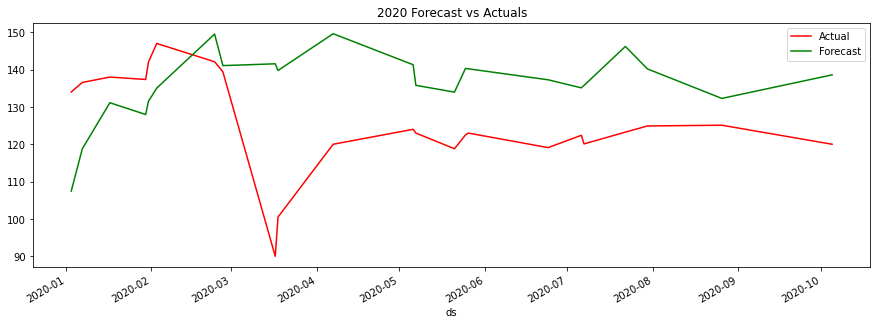

In [ ]:
#Actual vs Predicted
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
X_test.plot(kind='line',x='ds', y='y', color='red', label='Actual', ax=ax)
X_test_final.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('2020 Forecast vs Actuals')
plt.show()

In [ ]:
#Cross-validate 1 year every half year after 500 days
ibm_cv = cross_validation(final_model, initial='500 days', period='180 days', horizon='365 days')
#Extracting measures of performance
ibm_pm = performance_metrics(ibm_cv)
#Displaying the final inaccuracies
ibm_pm.tail(3)

INFO:fbprophet:Making 7 forecasts with cutoffs between 2015-11-28 00:00:00 and 2018-11-12 00:00:00


INFO:fbprophet:n_changepoints greater than number of observations. Using 19.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


,horizon,mse,rmse,mae,mape,mdape,coverage
69,361 days,9.449717e+06,3074.039127,1119.258038,8.095248,0.281272,0.250
70,364 days,9.449466e+06,3073.998444,1113.903311,8.056835,0.209560,0.375
71,365 days,2.466078e+07,4965.962140,2482.483486,18.292911,0.209560,0.375


Tuning our parameters did not help a lot, it actually got worse and we ended up with a larger error i.e. 18.29

From the graph, we can also tell that there is still a huge gap between the actual values and our predicted values.

In conclusion, the Prophet model does not do too well in predicting IBM 2020 stocks.

# Long Short Term Memory (LSTM)

LSTM are a special type of Recurrent Neural Networks (RNNs) that are capable of learning long term dependencies i.e in sequences, this is where the gap between relevant information and the point where it’s needed is very large. LSTMs remember information for a long period of time. In standard RNN, the repeating module contains a single layer while in LSTMs the repeating module contains four interacting layers

**Applications of LSTMs**

* Handwriting recognition
* Speech recognition
* Time series forecasting


In [ ]:
#Setting the configuration key
quandl.ApiConfig.api_key = "C9JjXb9RpJYezTkMJSyz"

In [ ]:
#Importing the libraries

import datetime as dt
from matplotlib import pyplot as plt
from sklearn import model_selection
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

### LVMH 

In [ ]:
#loading lvmh dataset
lvmh_data = quandl.get('EURONEXT/MC')


#resetting the index
lvmh_data.reset_index(level=0, inplace=True)

#previewing the data
lvmh_data.head()


,Date,Open,High,Low,Last,Volume,Turnover
0,2014-02-14,133.95,135.05,132.75,134.80,884136.0,1.189604e+08
1,2014-02-17,135.50,135.75,134.85,135.20,453221.0,6.131023e+07
2,2014-02-18,135.65,136.10,134.80,135.75,682066.0,9.245102e+07
3,2014-02-19,135.40,136.45,135.10,136.25,646308.0,8.783046e+07
4,2014-02-20,135.00,137.15,134.50,137.15,777457.0,1.060057e+08


In [ ]:
#checking the shape of the dataset
lvmh_data.shape

(1661, 7)

In [ ]:
#Creating the train set
lvmh_train = lvmh_data.loc[lvmh_data['Date'] <= '2019-12-31']

#obtaining only the closing price column from the train set
lvmh_train = lvmh_train.reset_index()['Last']

#previewing the data
print(lvmh_train.head())
print(lvmh_train.shape)

0    414.2
1    414.6
2    417.6
3    414.1
4    413.8
Name: Last, dtype: float64
(1471,)


In [ ]:
#Creating the test set
lvmh_test = lvmh_data.loc[lvmh_data['Date'] > '2020-01-01']

#obtaining only the closing price column from the train set
lvmh_test = lvmh_test.iloc[:, 4:5 ]

print(lvmh_test.head())
print(lvmh_test.shape)

     Last
0  405.90
1  400.20
2  401.80
3  400.10
4  391.05
(190, 1)


The train data has 1471 records while the test data has 190 records


In [ ]:
##Preparing the data for training
#scale lvmh train data
scaler = MinMaxScaler(feature_range = (0,1))
lvmh_train = scaler.fit_transform(np.array(lvmh_train).reshape(-1,1))
lvmh_train.shape

(1471, 1)

In [ ]:
#scaling lvmh test data
#scaler = MinMaxScaler(feature_range = (0,1))
#lvmh_test = scaler.fit_transform(np.array(lvmh_test).reshape(-1,1))
#lvmh_test.shape

(190, 1)

In [ ]:
import numpy
#convert an array of values into a dataset matrix
def create_dataset(dataset, time_step =1):
  dataX, dataY = [], []
  for i in range(len(dataset) - time_step -1):
    a = dataset[i:(i + time_step), 0]
    dataX.append(a)
    dataY.append(dataset[i + time_step, 0])
  return numpy.array(dataX), numpy.array(dataY)


In [ ]:
#reshape into x=t, t+1, t+2, t+3 and Y=t+4
time_step = 60
X_train, y_train = create_dataset(lvmh_train, time_step)
X_train.shape, y_train.shape

((1410, 60), (1410,))

With 60 timesteps, we get data with 1410 records

In [ ]:
#reshape input to be samples, timesteps, features
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
#X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
X_train.shape

(1410, 60, 1)

In [ ]:
#create LSTM Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM

model = Sequential()
model.add(LSTM(50, return_sequences = True, input_shape=(60,1)))
model.add(LSTM(50, return_sequences = True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss = "mean_squared_error", optimizer = "adam")
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 60, 50)            10400     
_________________________________________________________________
lstm_4 (LSTM)                (None, 60, 50)            20200     
_________________________________________________________________
lstm_5 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 51        
Total params: 50,851
Trainable params: 50,851
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#fitting the model
# using 15 epochs and a batch size of 64
hist = model.fit(X_train, y_train, epochs = 15, batch_size = 64, verbose = 1)

Epoch 1/15
23/23 [==============================] - 2s 95ms/step - loss: 7.4856e-04
Epoch 2/15
23/23 [==============================] - 2s 107ms/step - loss: 6.7850e-04
Epoch 3/15
23/23 [==============================] - 2s 105ms/step - loss: 7.4401e-04
Epoch 4/15
23/23 [==============================] - 3s 112ms/step - loss: 6.4727e-04
Epoch 5/15
23/23 [==============================] - 3s 109ms/step - loss: 0.0016
Epoch 6/15
23/23 [==============================] - 2s 106ms/step - loss: 7.1626e-04
Epoch 7/15
23/23 [==============================] - 2s 107ms/step - loss: 6.3001e-04
Epoch 8/15
23/23 [==============================] - 2s 107ms/step - loss: 5.7215e-04
Epoch 9/15
23/23 [==============================] - 3s 110ms/step - loss: 5.6968e-04
Epoch 10/15
23/23 [==============================] - 2s 105ms/step - loss: 5.6950e-04
Epoch 11/15
23/23 [==============================] - 2s 107ms/step - loss: 5.6196e-04
Epoch 12/15
23/23 [==============================] - 3s 110ms/step -

<function matplotlib.pyplot.show>

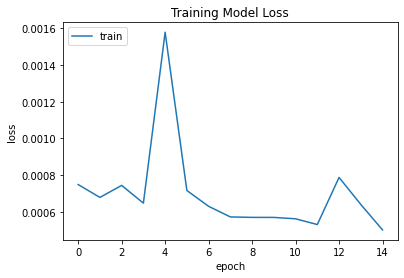

In [ ]:
#visualizing the loss
plt.plot(hist.history['loss'])
plt.title('Training Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show

In general, the errors are realy small, with the highest being 0.0016 at the fourth epoch while the lowest loss is at the last epoch

In [ ]:
#test data
y_test = lvmh_test.iloc[60:, 0:].values
y_test

array([[404.  ],
       [396.7 ],
       [401.85],
       [391.6 ],
       [390.5 ],
       [389.5 ],
       [387.7 ],
       [383.85],
       [381.35],
       [390.65],
       [378.9 ],
       [380.05],
       [377.3 ],
       [379.15],
       [376.8 ],
       [371.45],
       [379.15],
       [375.1 ],
       [398.4 ],
       [395.3 ],
       [396.1 ],
       [404.25],
       [390.05],
       [393.45],
       [384.95],
       [378.9 ],
       [375.  ],
       [386.8 ],
       [373.85],
       [365.4 ],
       [361.95],
       [355.3 ],
       [359.85],
       [361.75],
       [357.5 ],
       [350.05],
       [330.25],
       [331.  ],
       [335.05],
       [346.85],
       [348.9 ],
       [352.25],
       [345.55],
       [336.4 ],
       [342.5 ],
       [338.55],
       [352.45],
       [359.8 ],
       [357.  ],
       [350.95],
       [340.85],
       [348.65],
       [353.45],
       [350.  ],
       [360.45],
       [358.  ],
       [342.8 ],
       [342.  ],
       [352.  

In [ ]:
#input array for the model
inputClosing = lvmh_test.values.reshape(-1,1)  # 
inputClosing_scaled = scaler.transform(inputClosing)
inputClosing_scaled.shape

X_test = []  #creating a list for the xtest data
length = len(lvmh_test)
timestamp = 60
for i in range(timestamp, length):
  X_test.append(inputClosing_scaled[i-timestamp: i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_test.shape

(130, 60, 1)

In [ ]:
#predict on the test data 
test_predict = model.predict(X_test)

#transform back to original form
test_predict = scaler.inverse_transform(test_predict)

<function matplotlib.pyplot.show>

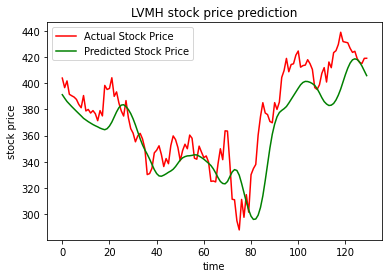

In [ ]:
#plotting actual vs predicted values

plt.plot(y_test, color = 'red', label = "Actual Stock Price")
plt.plot(test_predict, color = 'green', label = "Predicted Stock Price")
plt.title('LVMH stock price prediction')
plt.ylabel('stock price')
plt.xlabel('time')
plt.legend()
plt.show

From the above graph, the predicted prices are generally lower than the actual prices with an average differnce of approximately 20 units but we can observe that the trend is the same for both the actual and predicted prices

In [ ]:
#model evaluation metrics
import math
from sklearn.metrics import mean_squared_error

#train data RMSE
#print("train data rmse is: ", math.sqrt(mean_squared_error(y_train, train_predict)))

#test data RMSE
print("test data rmse is: ", math.sqrt(mean_squared_error(y_test, test_predict)))

test data rmse is:  21.964548003208222


The RMSE score is 21.96 which is fairly good hence the model is a good fit for the data

## IBM

In [ ]:
#loading ibm dataset
ibm_data = quandl.get('EURONEXT/IBMA')

#resetting the index
ibm_data.reset_index(level=0, inplace=True)

#previewing the data
ibm_data.head()

,Date,Open,High,Low,Last,Volume,Turnover
0,2014-01-22,187.00,187.00,187.00,187.00,25.0,3446.12
1,2014-08-29,211.00,211.00,211.00,211.00,8.0,1279.95
2,2014-09-02,210.95,210.95,210.95,210.95,44.0,7077.25
3,2014-10-03,205.00,205.00,205.00,205.00,20.0,3249.84
4,2015-01-29,140.00,140.00,140.00,140.00,50.0,6186.48


In [ ]:
#Creating the train set
ibm_train = ibm_data.loc[ibm_data['Date'] <= '2019-12-31']

#obtaining only the closing price column from the train set
ibm_train = ibm_train.reset_index()['Last']

#previewing the data
print(ibm_train.head())
print(ibm_train.shape)

0    187.00
1    211.00
2    210.95
3    205.00
4    140.00
Name: Last, dtype: float64
(72,)


In [ ]:
#Creating the test set
ibm_test = ibm_data.loc[ibm_data['Date'] > '2020-01-01']

#obtaining only the closing price column from the train set
ibm_test = ibm_test.iloc[:, 4:5 ]

print(ibm_test.head())
print(ibm_test.shape)

      Last
72  134.00
73  136.55
74  138.00
75  137.35
76  142.00
(23, 1)


The train data has 72 records while the test data has 23 records

In [ ]:
##Preparing the data for training
#scale ibm train data
scaler = MinMaxScaler(feature_range = (0,1))
ibm_train = scaler.fit_transform(np.array(ibm_train).reshape(-1,1))
ibm_train.shape

(72, 1)

In [ ]:
import numpy
#convert an array of values into a dataset matrix
def create_dataset(dataset, time_step =1):
  dataX, dataY = [], []
  for i in range(len(dataset) - time_step -1):
    a = dataset[i:(i + time_step), 0]
    dataX.append(a)
    dataY.append(dataset[i + time_step, 0])
  return numpy.array(dataX), numpy.array(dataY)

In [ ]:
#reshape into x=t, t+1, t+2, t+3 and Y=t+4
time_step = 10   #using 10 timesteps 
X_train_ibm, y_train_ibm = create_dataset(ibm_train, time_step)
X_train_ibm.shape, y_train_ibm.shape

((61, 10), (61,))

In [ ]:
#reshape input to be samples, timesteps, features
X_train_ibm = X_train_ibm.reshape(X_train_ibm.shape[0], X_train_ibm.shape[1], 1)
#X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
X_train_ibm.shape

(61, 10, 1)

In [ ]:
#create LSTM Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM

model = Sequential()
model.add(LSTM(50, return_sequences = True, input_shape=(10,1)))
model.add(LSTM(50, return_sequences = True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss = "mean_squared_error", optimizer = "adam")
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 10, 50)            10400     
_________________________________________________________________
lstm_10 (LSTM)               (None, 10, 50)            20200     
_________________________________________________________________
lstm_11 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 51        
Total params: 50,851
Trainable params: 50,851
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#fitting the model
ibm_hist = model.fit(X_train_ibm, y_train_ibm, epochs = 15, batch_size = 64, verbose = 1)

Epoch 1/15
1/1 [==============================] - 0s 1ms/step - loss: 0.1810
Epoch 2/15
1/1 [==============================] - 0s 1ms/step - loss: 0.1558
Epoch 3/15
1/1 [==============================] - 0s 1ms/step - loss: 0.1322
Epoch 4/15
1/1 [==============================] - 0s 1ms/step - loss: 0.1100
Epoch 5/15
1/1 [==============================] - 0s 1ms/step - loss: 0.0890
Epoch 6/15
1/1 [==============================] - 0s 1ms/step - loss: 0.0700
Epoch 7/15
1/1 [==============================] - 0s 1ms/step - loss: 0.0545
Epoch 8/15
1/1 [==============================] - 0s 2ms/step - loss: 0.0451
Epoch 9/15
1/1 [==============================] - 0s 1ms/step - loss: 0.0450
Epoch 10/15
1/1 [==============================] - 0s 1ms/step - loss: 0.0538
Epoch 11/15
1/1 [==============================] - 0s 1ms/step - loss: 0.0611
Epoch 12/15
1/1 [==============================] - 0s 1ms/step - loss: 0.0610
Epoch 13/15
1/1 [==============================] - 0s 1ms/step - loss: 0.

<function matplotlib.pyplot.show>

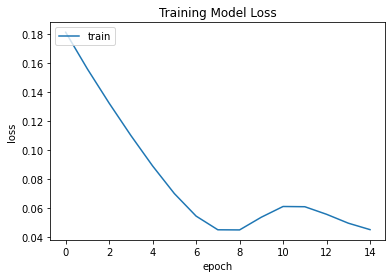

In [ ]:
#visualizing the loss
plt.plot(ibm_hist.history['loss'])
plt.title('Training Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show

The loss recorded decreases gradually from 0.18 to the lowest loss recorded of around 0.04 the we can see the loos flactuting between 0.06 and 0.04

In [ ]:
#test data
ibm_y_test = ibm_test.iloc[10:, 0:].values
ibm_y_test

array([[120.  ],
       [124.  ],
       [123.  ],
       [118.8 ],
       [122.5 ],
       [123.  ],
       [119.1 ],
       [122.4 ],
       [120.1 ],
       [123.25],
       [124.9 ],
       [125.1 ],
       [120.  ]])

In [ ]:
#input array for the model
inputClosing = ibm_test.values.reshape(-1,1)
inputClosing_scaled = scaler.transform(inputClosing)
inputClosing_scaled.shape

X_test_ibm = []
length = len(ibm_test)
timestamp = 10
for i in range(timestamp, length):
  X_test_ibm.append(inputClosing_scaled[i-timestamp: i,0])
X_test_ibm = np.array(X_test_ibm)
X_test_ibm = np.reshape(X_test_ibm, (X_test_ibm.shape[0], X_test_ibm.shape[1], 1))
X_test_ibm.shape

(13, 10, 1)

In [ ]:
#predict on the test data 
ibm_test_predict = model.predict(X_test_ibm)

#transform back to original form
ibm_test_predict = scaler.inverse_transform(ibm_test_predict)

<function matplotlib.pyplot.show>

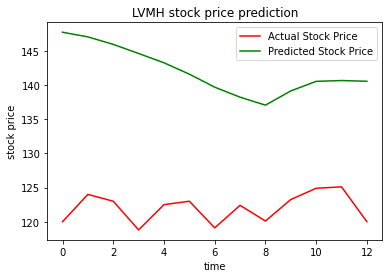

In [ ]:
#plotting actual vs predicted values

plt.plot(ibm_y_test, color = 'red', label = "Actual Stock Price")
plt.plot(ibm_test_predict, color = 'green', label = "Predicted Stock Price")
plt.title('LVMH stock price prediction')
plt.ylabel('stock price')
plt.xlabel('time')
plt.legend()
plt.show

The predicted prices are way high as compared to the actual prices, the average difference is approximately 20 units. We can also observe the trend is not in synch

In [ ]:
#model evaluation metrics
import math
from sklearn.metrics import mean_squared_error

#train data RMSE
#print("train data rmse is: ", math.sqrt(mean_squared_error(y_train, train_predict)))

#test data RMSE
print("test data rmse is: ", math.sqrt(mean_squared_error(ibm_y_test, ibm_test_predict)))

test data rmse is:  20.37634874142885


The model gives an RMSE score of 20.37, which is not bad hence the model performed fairly well on this data

## Merck and Co

In [ ]:
#loading merck and co dataset
merck_data = quandl.get('EURONEXT/MRK')

#resetting the index
merck_data.reset_index(level=0, inplace=True)

#previewing the data
merck_data.head()

,Date,Open,High,Low,Last,Volume,Turnover
0,2014-02-14,40.00,40.20,40.00,40.20,117.0,4687.00
1,2014-02-17,40.02,40.35,40.02,40.35,371.0,14909.01
2,2014-02-18,40.11,40.11,40.11,40.11,225.0,9024.75
3,2014-02-19,39.85,40.30,39.84,40.30,400.0,15973.10
4,2014-02-20,39.90,40.34,39.89,40.34,233.0,9318.10


In [ ]:
#Creating the train set
merck_train = merck_data.loc[merck_data['Date'] <= '2019-12-31']

#obtaining only the closing price column from the train set
merck_train = merck_train.reset_index()['Last']

#previewing the data
print(merck_train.head())
print(merck_train.shape)

0    40.20
1    40.35
2    40.11
3    40.30
4    40.34
Name: Last, dtype: float64
(1356,)


In [ ]:
#Creating the test set
merck_test = merck_data.loc[merck_data['Date'] > '2020-01-01']

#obtaining only the closing price column from the train set
merck_test = merck_test.iloc[:, 4:5 ]

print(merck_test.head())
print(merck_test.shape)

      Last
1356  81.2
1357  82.4
1358  82.0
1359  80.4
1360  78.2
(186, 1)


The train data has 1356 records while the test data has 186 records. 

In [ ]:
##Preparing the data for training
#scale lvmh train data
scaler = MinMaxScaler(feature_range = (0,1))
merck_train = scaler.fit_transform(np.array(merck_train).reshape(-1,1))
merck_train.shape

(1356, 1)

In [ ]:
import numpy
#convert an array of values into a dataset matrix
def create_dataset(dataset, time_step =1):
  dataX, dataY = [], []
  for i in range(len(dataset) - time_step -1):
    a = dataset[i:(i + time_step), 0]
    dataX.append(a)
    dataY.append(dataset[i + time_step, 0])
  return numpy.array(dataX), numpy.array(dataY)

In [ ]:
#reshape into x=t, t+1, t+2, t+3 and Y=t+4
time_step = 60
X_train_merck, y_train_merck= create_dataset(merck_train, time_step)
X_train_merck.shape, y_train_merck.shape

((1295, 60), (1295,))

In [ ]:
#reshape input to be samples, timesteps, features
X_train_merck = X_train_merck .reshape(X_train_merck .shape[0], X_train_merck .shape[1], 1)
#X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)
X_train_merck .shape

(1295, 60, 1)

In [ ]:
#create LSTM Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM

model = Sequential()
model.add(LSTM(50, return_sequences = True, input_shape=(60,1)))
model.add(LSTM(50, return_sequences = True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss = "mean_squared_error", optimizer = "adam")
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 60, 50)            10400     
_________________________________________________________________
lstm_13 (LSTM)               (None, 60, 50)            20200     
_________________________________________________________________
lstm_14 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 51        
Total params: 50,851
Trainable params: 50,851
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#fitting the model
merck_hist = model.fit(X_train_merck, y_train_merck, epochs = 15, batch_size = 64, verbose = 1)

Epoch 1/15
21/21 [==============================] - 2s 96ms/step - loss: 0.0340
Epoch 2/15
21/21 [==============================] - 2s 98ms/step - loss: 0.0042
Epoch 3/15
21/21 [==============================] - 2s 103ms/step - loss: 0.0022
Epoch 4/15
21/21 [==============================] - 2s 98ms/step - loss: 0.0019
Epoch 5/15
21/21 [==============================] - 2s 99ms/step - loss: 0.0019
Epoch 6/15
21/21 [==============================] - 2s 97ms/step - loss: 0.0019
Epoch 7/15
21/21 [==============================] - 2s 97ms/step - loss: 0.0018
Epoch 8/15
21/21 [==============================] - 2s 97ms/step - loss: 0.0018
Epoch 9/15
21/21 [==============================] - 2s 97ms/step - loss: 0.0017
Epoch 10/15
21/21 [==============================] - 2s 100ms/step - loss: 0.0017
Epoch 11/15
21/21 [==============================] - 2s 98ms/step - loss: 0.0017
Epoch 12/15
21/21 [==============================] - 2s 100ms/step - loss: 0.0017
Epoch 13/15
21/21 [===============

<function matplotlib.pyplot.show>

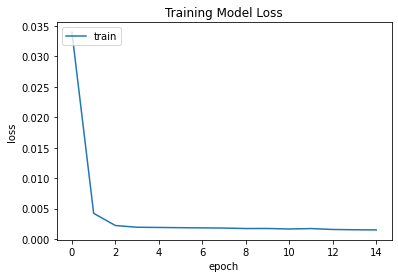

In [ ]:
#visualizing the loss
plt.plot(merck_hist.history['loss'])
plt.title('Training Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show

The loss obtained is generally small from 0.035 to a loss of less than 0.005. We the observe a steady and minimal decrease in the loss from the third epock to the last epoch

In [ ]:
#test data
merck_y_test = merck_test.iloc[60:, 0:].values
merck_y_test

array([[68.8],
       [69.8],
       [67.6],
       [67.2],
       [71.6],
       [74.2],
       [74. ],
       [73.2],
       [73.6],
       [74. ],
       [75. ],
       [76.8],
       [76.2],
       [75.6],
       [74. ],
       [73.6],
       [75.6],
       [75.8],
       [77. ],
       [75.4],
       [73.2],
       [73.2],
       [70.2],
       [72.2],
       [72.6],
       [70.6],
       [71.6],
       [70.8],
       [72. ],
       [73.4],
       [73. ],
       [71.8],
       [71. ],
       [69.6],
       [71.2],
       [71. ],
       [69.8],
       [72.4],
       [72. ],
       [72.4],
       [71.6],
       [72.8],
       [71.6],
       [73.6],
       [73. ],
       [72.4],
       [71.2],
       [70. ],
       [67.8],
       [66.2],
       [67.2],
       [67.4],
       [68.6],
       [68.4],
       [69. ],
       [67.4],
       [68. ],
       [67.2],
       [68. ],
       [68.8],
       [69.6],
       [70. ],
       [69.6],
       [70.2],
       [70.2],
       [68.8],
       [68

In [ ]:
#input array for the model
inputClosing = merck_test.values.reshape(-1,1)
inputClosing_scaled = scaler.transform(inputClosing)
inputClosing_scaled.shape

X_test_merck= []
length = len(merck_test)
timestamp = 60
for i in range(timestamp, length):
  X_test_merck.append(inputClosing_scaled[i-timestamp: i,0])
X_test_merck = np.array(X_test_merck)
X_test_merck = np.reshape(X_test_merck, (X_test_merck.shape[0], X_test_merck.shape[1], 1))
X_test_merck.shape

(126, 60, 1)

In [ ]:
#predict on the test data 
merck_test_predict = model.predict(X_test_merck)

#transform back to original form
merck_test_predict = scaler.inverse_transform(merck_test_predict)

<function matplotlib.pyplot.show>

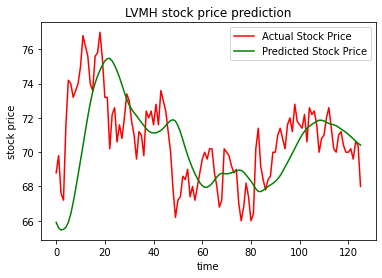

In [ ]:
#plotting actual vs predicted values

plt.plot(merck_y_test, color = 'red', label = "Actual Stock Price")
plt.plot(merck_test_predict, color = 'green', label = "Predicted Stock Price")
plt.title('LVMH stock price prediction')
plt.ylabel('stock price')
plt.xlabel('time')
plt.legend()
plt.show

From the graph, the predicted prices seem to be slightly lower than the actual prices with an a difference of approximately 2 units. The trend of the stocks seems to be in synch

In [ ]:
#model evaluation metrics
import math
from sklearn.metrics import mean_squared_error

#train data RMSE
#print("train data rmse is: ", math.sqrt(mean_squared_error(y_train, train_predict)))

#test data RMSE
print("test data rmse is: ", math.sqrt(mean_squared_error(merck_y_test, merck_test_predict)))

test data rmse is:  2.4943096441778874


The RMSE score is 2 which is quite low. This means the model performed very well on the Merck and Co data

** Evaluation of all the three model**

For both the LVMH and the Merck and Co data, we have used 60 timesteps for our sequences while the IBM data was very small hence we used a timestep of 10. 
The LSTM model has performed best on the Merck and Co dataset, giving us a relatively small error as compared to the LVMH data and the IBM data. Both the LVMH stocks and the IBM stocks have performed almost the same.


# Markov Models

A Markov process is a stochastic process that satisfies the Markov property(sometimes characterized as "memorylessness"). In simpler terms, it is a process for which predictions can be made regarding future outcomes based solely on its present state and—most importantly—such predictions are just as good as the ones that could be made knowing the process's full history.In other words, conditional on the present state of the system, its future and past states are independent.

Assumptions of a Markov Model:

  • First assumption means that the future depends only on the present, not on
the past history.

• Second assumption is implied by the random-variable approach to future lifetime


### LVMH

In [ ]:
#Importing necessary libraries
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import io, base64, os, json, re
import pandas as pd
import numpy as np
import datetime
from random import randint

In [ ]:
#Calculating percentage changes for the different variables
new_set = []

#We are going to create 100000 iterations of possible events in our data
for row_set in range(0,100000):
  if row_set% 2000 == 0: print(row_set)
  row_quant = randint(10,30)
  row_start = randint(0,len(lvmh_data)-row_quant)
  market_subset = lvmh_data.iloc[row_start:row_start+row_quant]

  Close_Date = max(market_subset["Date"])
  if row_set%2000 == 0 : print(Close_Date)

  Close_Gap = market_subset["Last"].pct_change()
  High_Gap = market_subset["High"].pct_change()
  Low_Gap = market_subset["Low"].pct_change()
  Volume_Gap = market_subset["Volume"].pct_change()
  Daily_Change = (market_subset["Last"] - market_subset["Open"])/market_subset["Open"]
  Outcome_Next_Day_Direction = (market_subset["Volume"].shift(-1) - market_subset["Volume"])
#Appending the new values in a list called new set
  new_set.append(pd.DataFrame({"Sequence_ID": [row_set]*len(market_subset),
                               "Close_Date" : [Close_Date]*len(market_subset),
                               "Close_Gap" : Close_Gap,
                               "High_Gap" : High_Gap,
                               "Low_Gap" : Low_Gap,
                               "Volume_Gap" : Volume_Gap,
                               "Daily_Change" : Daily_Change,
                               "Outcome_Next_Day_Direction" : Outcome_Next_Day_Direction}))

0
2018-12-07 00:00:00
2000
2019-06-25 00:00:00
4000
2018-01-05 00:00:00
6000
2014-06-09 00:00:00
8000
2016-07-29 00:00:00
10000
2018-05-04 00:00:00
12000
2015-12-16 00:00:00
14000
2018-01-11 00:00:00
16000
2015-03-24 00:00:00
18000
2015-09-10 00:00:00
20000
2017-11-24 00:00:00
22000
2020-06-26 00:00:00
24000
2015-05-29 00:00:00
26000
2014-06-09 00:00:00
28000
2018-03-08 00:00:00
30000
2018-12-11 00:00:00
32000
2019-12-11 00:00:00
34000
2020-01-03 00:00:00
36000
2014-03-25 00:00:00
38000
2018-06-28 00:00:00
40000
2016-01-28 00:00:00
42000
2015-12-11 00:00:00
44000
2017-02-21 00:00:00
46000
2017-11-16 00:00:00
48000
2019-02-18 00:00:00
50000
2014-08-27 00:00:00
52000
2020-07-31 00:00:00
54000
2019-11-12 00:00:00
56000
2020-06-04 00:00:00
58000
2014-08-20 00:00:00
60000
2019-01-18 00:00:00
62000
2017-10-16 00:00:00
64000
2014-10-03 00:00:00
66000
2016-06-08 00:00:00
68000
2014-12-16 00:00:00
70000
2018-02-12 00:00:00
72000
2017-10-16 00:00:00
74000
2014-07-18 00:00:00
76000
2017-09-01 00:

In [ ]:
#Creating a new dataframe from the list created
new_set_df = pd.concat(new_set)
print(new_set_df.shape)
new_set_df = new_set_df.dropna(how="any")
print(new_set_df.shape)
new_set_df.tail(10)

(1998681, 8)


,Sequence_ID,Close_Date,Close_Gap,High_Gap,Low_Gap,Volume_Gap,Daily_Change,Outcome_Next_Day_Direction
526,99999,2016-05-02,-0.000984,-0.003584,-0.008243,-0.100468,0.012301,99520.0
527,99999,2016-05-02,0.007882,0.015043,-0.000665,0.143034,0.018924,-107692.0
528,99999,2016-05-02,0.006843,-0.003544,0.013972,-0.135410,0.012119,271542.0
529,99999,2016-05-02,-0.015534,-0.001293,-0.005577,0.394908,-0.015215,-322918.0
530,99999,2016-05-02,-0.015450,-0.014892,-0.014847,-0.336671,-0.011877,-64930.0
531,99999,2016-05-02,-0.006344,-0.012488,-0.008038,-0.102054,-0.006344,117439.0
532,99999,2016-05-02,-0.008401,0.002995,-0.009453,0.205563,-0.015349,-107576.0
533,99999,2016-05-02,-0.002372,-0.015262,-0.004772,-0.156192,-0.000679,268353.0
534,99999,2016-05-02,0.014946,0.006739,-0.006164,0.461749,0.021888,75528.0
535,99999,2016-05-02,-0.028782,-0.007363,0.000000,0.088907,-0.018932,-427258.0


We have now created 1,998,61 possible events and a the result of the changing direction based on the volume.

In [ ]:
#Based on the positive change or negative or stagnant change, we are going to label the Close, High, Volume and Daily Change columns
new_set_df["Close_Gap_LMH"] = pd.qcut(new_set_df["Close_Gap"], 3, labels = ["L","M","H"])
new_set_df["High_Gap_LMH"] = pd.qcut(new_set_df["High_Gap"], 3, labels = ["L","M","H"])
new_set_df["Volume_Gap_LMH"] = pd.qcut(new_set_df["Volume_Gap"], 3, labels = ["L","M","H"])
new_set_df["Daily_Change_LMH"] = pd.qcut(new_set_df["Daily_Change"], 3, labels = ["L","M","H"])

new_set_df = new_set_df[["Sequence_ID",
                         "Close_Date",
                         "Close_Gap_LMH",
                         "Volume_Gap_LMH",
                         "Daily_Change_LMH",
                         "Outcome_Next_Day_Direction"]]

In [ ]:
#We are going to find the possible state events that occured to led a positive or negative change in direction of the volume traded
new_set_df["Event_Pattern"] = new_set_df["Close_Gap_LMH"].astype(str) + new_set_df["Volume_Gap_LMH"].astype(str) + new_set_df["Daily_Change_LMH"].astype(str)
#Grouping by the Sequence Id and the Date to get the precise transactions on particular days
compressed_set = new_set_df.groupby(["Sequence_ID","Close_Date"])["Event_Pattern"].apply(lambda x:"{%s}" % ','.join(x)).reset_index()
compressed_outcomes = new_set_df.groupby(["Sequence_ID","Close_Date"])["Outcome_Next_Day_Direction"].mean()
compressed_outcomes = compressed_outcomes.to_frame().reset_index()
compressed_set = pd.merge(compressed_set, compressed_outcomes, on =["Sequence_ID","Close_Date"],how='inner')
compressed_set.head()

In [ ]:
#Creating a event patterns by removing it in a dictionary
compressed_set["Event_Pattern"] = ["".join(e.split()).replace('{',"").replace('}','') for e in compressed_set['Event_Pattern'].values]

In [ ]:
#Previewing the dataset head
compressed_set.head()

,Sequence_ID,Close_Date,Event_Pattern,Outcome_Next_Day_Direction
0,0,2018-12-07,"LLM,LML,MML,LML,LHL,HLH,LLM,MHM,LHL,LML,HHM,ML...",4750.176471
1,1,2018-10-12,"HHH,MLM,HMM,LML,MMM,HMH,HHH,HHH,MLH,LML,HHH,ML...",8928.136364
2,2,2014-09-23,"MHM,LHL,HLH,HHH,MLM,LHM,MMM,HLH,MML,HHH,MLH,LL...",12300.347826
3,3,2019-06-12,"HMH,MMM,LML,HLH,MMM,LHM,HLM,HLM,HHH,LMM,HLH,LH...",3270.473684
4,4,2018-07-03,"LHM,LML,LLL,HMM,LML,HMM,HHH,LML,HMM,LLL",-16909.000000


In [ ]:
#Picking the train and test data
train, test = compressed_set.loc[compressed_set['Close_Date'] <= '2019-12-31'], compressed_set.loc[compressed_set['Close_Date'] > '2020-01-01']
train.shape, test.shape

((88158, 4), (11842, 4))

In [ ]:
#Picking the columns of interest for the train and test dataset
train = train[["Sequence_ID","Event_Pattern","Outcome_Next_Day_Direction"]]
test = test[["Sequence_ID","Event_Pattern","Outcome_Next_Day_Direction"]]

In [ ]:
#Checking the significant trade occcurences that have an abolute value of 10000
print(len(train["Outcome_Next_Day_Direction"]))
len(train[abs(train["Outcome_Next_Day_Direction"])>10000])

88158


51030

In [ ]:
#Picking the significant trades
train = train[abs(train["Outcome_Next_Day_Direction"])>10000]
#Picking the outcome whether positive or negative and giving it a binary value. Positive for a 1 and negative for a 0
train["Outcome_Next_Day_Direction"] = np.where((train["Outcome_Next_Day_Direction"]>0),1,0)
test["Outcome_Next_Day_Direction"] = np.where((test["Outcome_Next_Day_Direction"]>0),1,0)

In [ ]:
#Previewing the changes
train.head()

,Sequence_ID,Event_Pattern,Outcome_Next_Day_Direction
2,2,"MHM,LHL,HLH,HHH,MLM,LHM,MMM,HLH,MML,HHH,MLH,LL...",1
4,4,"LHM,LML,LLL,HMM,LML,HMM,HHH,LML,HMM,LLL",0
5,5,"MML,HHH,MLM,HMM,LML,MMM,HMH,HHH",1
7,7,"MLH,LHL,MMH,LML,HHH,LLL,HHH,LML,MLH,HMH,MLM,LH...",1
11,11,"HHH,MLM,LHM,MLL,MHL,HHH,LLM,MMM,MML,MLM,MHH,MH...",1


In [ ]:
#Picking the positive and negative dataframes.
train_pos = train.loc[train["Outcome_Next_Day_Direction"] == 1]
train_neg = train.loc[train["Outcome_Next_Day_Direction"] == 0]

In [ ]:
#Checking the shape of the positive 
train_pos.shape

(24826, 3)

In [ ]:
#Checking the shape of the negative dataframe
train_neg.shape

(26204, 3)

In [ ]:
#Picking the unique event patterns in our dataset
flat_list = [item.split(",") for item in train["Event_Pattern"]]
unique_patterns = ','.join(str(r) for v in flat_list for r in v)
unique_patterns = list(set(unique_patterns.split(',')))
len(unique_patterns)

27

In [ ]:
# build the markov transition grid
def build_transition_grid(compressed_grid, unique_patterns):
    # build the markov transition grid

    patterns = []
    counts = []
    for from_event in unique_patterns:

        # how many times 
        for to_event in unique_patterns:
            pattern = from_event + ',' + to_event # MMM,MlM

            ids_matches = compressed_grid[compressed_grid['Event_Pattern'].str.contains(pattern)]
            found = 0
            if len(ids_matches) > 0:
                Event_Pattern = '---'.join(ids_matches['Event_Pattern'].values)
                found = Event_Pattern.count(pattern)
            patterns.append(pattern)
            counts.append(found)

    # create to/from grid
    grid_Df = pd.DataFrame({'pairs':patterns, 'counts': counts})

    grid_Df['x'], grid_Df['y'] = grid_Df['pairs'].str.split(',', 1).str
    grid_Df.head()

    grid_Df = grid_Df.pivot(index='x', columns='y', values='counts')

    grid_Df.columns= [col for col in grid_Df.columns]
    grid_Df = grid_Df.rename_axis(None, axis=1)

    # replace all NaN with zeros
    grid_Df.fillna(0, inplace=True)
    grid_Df.head()

    #grid_Df.rowSums(transition_dataframe) 
    grid_Df = grid_Df / grid_Df.sum(1)
    return (grid_Df)
 

In [ ]:
#Creating the transition grid for the positive and negative set
grid_pos = build_transition_grid(train_pos, unique_patterns) 
grid_neg = build_transition_grid(train_neg, unique_patterns) 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: FutureWarning: Columnar iteration over characters will be deprecated in future releases.


In [ ]:
#Displaying the grid matrix for the negative outcomes
grid_neg

,HHH,HHL,HHM,HLH,HLL,HLM,HMH,HML,HMM,LHH,LHL,LHM,LLH,LLL,LLM,LMH,LML,LMM,MHH,MHL,MHM,MLH,MLL,MLM,MMH,MML,MMM
x,,,,,,,,,,,,,,,,,,,,,,,,,,,
HHH,0.045517,0.306909,0.087199,0.113512,0.000000,0.045440,0.067115,0.000000,0.091699,0.000000,0.013556,0.000000,0.000000,0.250511,0.321522,0.323478,0.123724,0.025932,0.065830,0.048066,0.103313,0.276167,0.198950,0.188967,0.020133,0.070421,0.026840
HHL,0.000000,0.000000,0.000000,0.000000,0.869565,0.000000,0.016489,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.011370,0.000000,0.000000,0.000000
HHM,0.003868,0.000000,0.000000,0.015721,0.000000,0.044510,0.006194,0.311404,0.017275,0.000000,0.009124,0.000000,0.000000,0.026305,0.074026,0.000000,0.015461,0.000000,0.000000,0.000000,0.008642,0.000000,0.043107,0.009886,0.059014,0.022605,0.010055
HLH,0.071223,0.000000,0.066941,0.063038,0.000000,0.034352,0.080663,0.000000,0.121252,0.000000,0.088193,0.154544,0.367332,0.094021,0.088661,0.000000,0.092984,0.038685,0.033317,0.036576,0.018391,0.019510,0.056133,0.062737,0.074529,0.186897,0.120896
HLL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009836,0.000000,0.000000,0.000000
HLM,0.036366,0.000000,0.078097,0.017407,0.000000,0.059786,0.064400,0.000000,0.044437,0.000000,0.013470,0.000000,0.000000,0.000000,0.000000,0.000000,0.024686,0.014312,0.132303,0.000000,0.057556,0.000000,0.000000,0.048122,0.046731,0.007203,0.039525
HMH,0.106693,0.000000,0.073400,0.048144,0.000000,0.082506,0.142405,0.000000,0.023577,0.000000,0.041448,0.000000,0.000000,0.112191,0.071715,0.000000,0.106367,0.087573,0.023821,0.107622,0.116995,0.141049,0.128573,0.110155,0.063170,0.000000,0.098619
HML,0.000000,0.000000,0.000000,0.021912,0.000000,0.019774,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022047,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HMM,0.026225,0.000000,0.000000,0.023658,0.000000,0.000000,0.026445,0.000000,0.000000,0.438696,0.026551,0.000000,0.000000,0.040848,0.000000,0.000000,0.057905,0.035001,0.000000,0.000000,0.012519,0.037833,0.009371,0.013383,0.000000,0.000000,0.006536


In [ ]:
#Predicting the outcomes for the dataset using the train
def safe_log(x,y):
   try:
      lg = np.log(x/y)
   except:
      lg = 0
   return lg

# predict on out of sample data
actual = []
predicted = []
for seq_id in test['Sequence_ID'].values:
    patterns = test[test['Sequence_ID'] == seq_id]['Event_Pattern'].values[0].split(',')
    pos = []
    neg = []
    log_odds = []
    
    for id in range(0, len(patterns)-1):
        # get log odds
        # logOdds = log(tp(i,j) / tn(i,j)
        if (patterns[id] in list(grid_pos) and patterns[id+1] in list(grid_pos) and patterns[id] in list(grid_neg) and patterns[id+1] in list(grid_neg)):
                
            numerator = grid_pos[patterns[id]][patterns[id+1]]
            denominator = grid_neg[patterns[id]][patterns[id+1]]
            if (numerator == 0 and denominator == 0):
                log_value =0
            elif (denominator == 0):
                log_value = np.log(numerator / 0.00001)
            elif (numerator == 0):
                log_value = np.log(0.00001 / denominator)
            else:
                log_value = np.log(numerator/denominator)
        else:
            log_value = 0
        
        log_odds.append(log_value)
        
        pos.append(numerator)
        neg.append(denominator)
      
    print('outcome:', test[test['Sequence_ID']==seq_id]['Outcome_Next_Day_Direction'].values[0])
    print(sum(pos)/sum(neg))
    print(sum(log_odds))

    actual.append(test[test['Sequence_ID']==seq_id]['Outcome_Next_Day_Direction'].values[0])
    predicted.append(sum(log_odds))

Streaming output truncated to the last 5000 lines.
-0.6947823612541988
outcome: 1
1.2156655740620224
0.8441808923777445
outcome: 1
1.2915490278002235
3.656306770154679
outcome: 1
1.0423448434419964
0.8901585051961315
outcome: 1
1.2775036508145468
5.790852375093094
outcome: 0
1.1131061244243496
-0.8271002231365802
outcome: 1
1.063846072497941
-0.44096003399067996
outcome: 0
1.3484572754206088
4.987868080883286
outcome: 1
1.1802322617227574
0.4887935383880985
outcome: 0
1.2455065609954203
1.4512748929173775
outcome: 0
1.294887862936804
1.4485777541184557
outcome: 1
1.0562826514050898
0.05519925489934818
outcome: 1
1.050427849433762
-0.6894500145283917
outcome: 1
1.8117536622950101
5.084140075680179
outcome: 1
1.2046303125845867
0.9596333284093667
outcome: 0
1.051548445575228
0.5118031043980803
outcome: 0
1.0589381485484228
0.18128318951718714
outcome: 0
1.2250365048190055
0.8166632473138837
outcome: 0
0.9651358357511585
0.07514901094559506
outcome: 1
1.1382873793075747
2.184816348610182


In [ ]:
#Checking the accuracies for our dataset
from sklearn.metrics import accuracy_score

score = accuracy_score(actual, [1 if p > 0 else 0 for p in predicted])
print("Accuracy", round(score*100,2),'%')

Accuracy 43.77 %


The model had a 43.77% accuracy which is generally low. This might have been caused by the volatile nature of the stock market such as:

*   Political influences
*   Pandemics



### IBM

In [ ]:
#Calculating percentage changes for the different variables
new_set = []


for row_set in range(0,100000):
  if row_set% 2000 == 0: print(row_set)
  row_quant = randint(10,30)
  row_start = randint(0,len(ibm_data)-row_quant)
  market_subset = ibm_data.iloc[row_start:row_start+row_quant]

  Close_Date = max(market_subset["Date"])
  if row_set%2000 == 0 : print(Close_Date)
  Close_Gap = market_subset["Last"].pct_change()
  High_Gap = market_subset["High"].pct_change()
  Low_Gap = market_subset["Low"].pct_change()
  Volume_Gap = market_subset["Volume"].pct_change()
  Daily_Change = (market_subset["Last"] - market_subset["Open"])/market_subset["Open"]
  Outcome_Next_Day_Direction = (market_subset["Volume"].shift(-1) - market_subset["Volume"])

  new_set.append(pd.DataFrame({"Sequence_ID": [row_set]*len(market_subset),
                               "Close_Date" : [Close_Date]*len(market_subset),
                               "Close_Gap" : Close_Gap,
                               "High_Gap" : High_Gap,
                               "Low_Gap" : Low_Gap,
                               "Volume_Gap" : Volume_Gap,
                               "Daily_Change" : Daily_Change,
                               "Outcome_Next_Day_Direction" : Outcome_Next_Day_Direction}))

0
2015-03-23 00:00:00
2000
2017-01-25 00:00:00
4000
2020-05-06 00:00:00
6000
2020-10-05 00:00:00
8000
2018-03-08 00:00:00
10000
2020-01-17 00:00:00
12000
2017-02-20 00:00:00
14000
2015-07-27 00:00:00
16000
2018-10-10 00:00:00
18000
2015-03-11 00:00:00
20000
2017-02-23 00:00:00
22000
2017-01-19 00:00:00
24000
2015-03-23 00:00:00
26000
2020-01-30 00:00:00
28000
2018-10-10 00:00:00
30000
2017-02-02 00:00:00
32000
2015-07-22 00:00:00
34000
2020-07-07 00:00:00
36000
2015-06-08 00:00:00
38000
2020-06-24 00:00:00
40000
2017-03-09 00:00:00
42000
2017-01-25 00:00:00
44000
2017-01-11 00:00:00
46000
2017-05-25 00:00:00
48000
2018-01-16 00:00:00
50000
2016-03-09 00:00:00
52000
2019-11-12 00:00:00
54000
2020-01-31 00:00:00
56000
2018-03-08 00:00:00
58000
2019-09-26 00:00:00
60000
2020-03-17 00:00:00
62000
2017-03-09 00:00:00
64000
2019-11-12 00:00:00
66000
2016-03-07 00:00:00
68000
2020-05-07 00:00:00
70000
2019-05-31 00:00:00
72000
2020-05-21 00:00:00
74000
2020-01-31 00:00:00
76000
2020-07-30 00:

In [ ]:
#Creating a new dataframe from the list created
new_set_df = pd.concat(new_set)
print(new_set_df.shape)
new_set_df = new_set_df.dropna(how="any")
print(new_set_df.shape)
new_set_df.tail(10)

(2001357, 8)
(1801357, 8)


,Sequence_ID,Close_Date,Close_Gap,High_Gap,Low_Gap,Volume_Gap,Daily_Change,Outcome_Next_Day_Direction
36,99999,2017-05-25,-0.199592,-0.199592,-0.199592,3.000000,0.0,-99.0
37,99999,2017-05-25,0.242988,0.242988,0.242988,-0.990000,0.0,4.0
38,99999,2017-05-25,0.000000,0.000000,0.000000,4.000000,0.0,85.0
39,99999,2017-05-25,-0.076923,-0.076923,-0.076923,17.000000,0.0,-88.0
40,99999,2017-05-25,0.055556,0.055556,0.055556,-0.977778,0.0,3.0
41,99999,2017-05-25,-0.068421,-0.068421,-0.068421,1.500000,0.0,-4.0
42,99999,2017-05-25,0.096045,0.096045,0.096045,-0.800000,0.0,0.0
43,99999,2017-05-25,-0.100000,-0.100000,-0.100000,0.000000,0.0,0.0
44,99999,2017-05-25,-0.095074,-0.095074,-0.095074,0.000000,0.0,2.0
45,99999,2017-05-25,-0.050506,-0.050506,-0.050506,2.000000,0.0,0.0


In [ ]:
#Based on the positive change or negative or stagnant change, we are going to label the Close, High, Volume and Daily Change columns
new_set_df["Close_Gap_LMH"] = pd.qcut(new_set_df["Close_Gap"], 3, labels = ["L","M","H"])
new_set_df["Close_Gap_LMH"] = pd.qcut(new_set_df["Close_Gap"], 3, labels = ["L","M","H"])
new_set_df["High_Gap_LMH"] = pd.qcut(new_set_df["High_Gap"], 3, labels = ["L","M","H"])
new_set_df["Volume_Gap_LMH"] = pd.qcut(new_set_df["Volume_Gap"], 3, labels = ["L","M","H"])
#new_set_df["Daily_Change_LMH"] = pd.qcut(new_set_df["Daily_Change"], 3, labels = ["L","M","H"])

new_set_df = new_set_df[["Sequence_ID",
                         "Close_Date",
                         "Close_Gap_LMH",
                         "Volume_Gap_LMH",
                         "Outcome_Next_Day_Direction"]]

In [ ]:
#We are going to find the possible state events that occured to led a positive or negative change in direction of the volume traded
new_set_df["Event_Pattern"] = new_set_df["Close_Gap_LMH"].astype(str) + new_set_df["Volume_Gap_LMH"].astype(str)
compressed_set = new_set_df.groupby(["Sequence_ID","Close_Date"])["Event_Pattern"].apply(lambda x:"{%s}" % ','.join(x)).reset_index()
compressed_outcomes = new_set_df.groupby(["Sequence_ID","Close_Date"])["Outcome_Next_Day_Direction"].mean()
compressed_outcomes = compressed_outcomes.to_frame().reset_index()
compressed_set = pd.merge(compressed_set, compressed_outcomes, on =["Sequence_ID","Close_Date"],how='inner')
compressed_set.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Sequence_ID,Close_Date,Event_Pattern,Outcome_Next_Day_Direction
0,0,2015-03-23,"{MH,LL,LH,HL,HH,HL,ML,MH,LH,LL,HH,LL}",-2.000000
1,1,2017-02-23,"{ML,MH,LM,LM,LM,ML,LH,MM,HM,HM,MM,HL,MM,HM,HM,...",4.200000
2,2,2019-01-31,"{LL,HM,MH,ML,LL,LL,HH,MH,MM,LL}",0.200000
3,3,2019-10-03,"{MH,ML,LL,LL,HH,MH,MM,LL,LL,HH,ML,MM,LL,HH,LL,...",-1.764706
4,4,2020-01-30,"{MH,ML,LL,LL,HH,MH,MM,LL,LL,HH,ML,MM,LL,HH,LL,...",-0.652174


In [ ]:
#Creating a event patterns by removing it in a dictionary
compressed_set["Event_Pattern"] = ["".join(e.split()).replace('{',"").replace('}','') for e in compressed_set['Event_Pattern'].values]

In [ ]:
#Picking the train and test data
train, test = compressed_set.loc[compressed_set['Close_Date'] <= '2019-12-31'], compressed_set.loc[compressed_set['Close_Date'] > '2020-01-01']
train.shape, test.shape

((69486, 4), (30514, 4))

In [ ]:
#Picking the variables of interest
train = train[["Sequence_ID","Event_Pattern","Outcome_Next_Day_Direction"]]
test = test[["Sequence_ID","Event_Pattern","Outcome_Next_Day_Direction"]]

In [ ]:
#train = train[abs(train["Outcome_Next_Day_Direction"])>100000]
#Picking the outcome whether positive or negative and giving it a binary value. Positive for a 1 and negative for a 0
train["Outcome_Next_Day_Direction"] = np.where((train["Outcome_Next_Day_Direction"]>0),1,0)
test["Outcome_Next_Day_Direction"] = np.where((test["Outcome_Next_Day_Direction"]>0),1,0)

In [ ]:
#Creating the postive and negative dataframe
train_pos = train.loc[train["Outcome_Next_Day_Direction"] == 1]
train_neg = train.loc[train["Outcome_Next_Day_Direction"] == 0]

In [ ]:
#Getting the event patterns
flat_list = [item.split(",") for item in train["Event_Pattern"]]
unique_patterns = ','.join(str(r) for v in flat_list for r in v)
unique_patterns = list(set(unique_patterns.split(',')))
len(unique_patterns)

9

In [ ]:
# build the markov transition grid
def build_transition_grid(compressed_grid, unique_patterns):
    # build the markov transition grid

    patterns = []
    counts = []
    for from_event in unique_patterns:

        # how many times 
        for to_event in unique_patterns:
            pattern = from_event + ',' + to_event # MMM,MlM

            ids_matches = compressed_grid[compressed_grid['Event_Pattern'].str.contains(pattern)]
            found = 0
            if len(ids_matches) > 0:
                Event_Pattern = '---'.join(ids_matches['Event_Pattern'].values)
                found = Event_Pattern.count(pattern)
            patterns.append(pattern)
            counts.append(found)

    # create to/from grid
    grid_Df = pd.DataFrame({'pairs':patterns, 'counts': counts})

    grid_Df['x'], grid_Df['y'] = grid_Df['pairs'].str.split(',', 1).str
    grid_Df.head()

    grid_Df = grid_Df.pivot(index='x', columns='y', values='counts')

    grid_Df.columns= [col for col in grid_Df.columns]
    grid_Df = grid_Df.rename_axis(None, axis=1)

    # replace all NaN with zeros
    grid_Df.fillna(0, inplace=True)
    grid_Df.head()

    #grid_Df.rowSums(transition_dataframe) 
    grid_Df = grid_Df / grid_Df.sum(1)
    return (grid_Df)
 

In [ ]:
#Getting the grid of the positive and negative train datasets
grid_pos = build_transition_grid(train_pos, unique_patterns) 
grid_neg = build_transition_grid(train_neg, unique_patterns) 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: FutureWarning: Columnar iteration over characters will be deprecated in future releases.


In [ ]:
#Predicting the states using the train set
   def safe_log(x,y):
   try:
      lg = np.log(x/y)
   except:
      lg = 0
   return lg

# predict on out of sample data
actual = []
predicted = []
for seq_id in test['Sequence_ID'].values:
    patterns = test[test['Sequence_ID'] == seq_id]['Event_Pattern'].values[0].split(',')
    pos = []
    neg = []
    log_odds = []
    
    for id in range(0, len(patterns)-1):
        # get log odds
        # logOdds = log(tp(i,j) / tn(i,j)
        if (patterns[id] in list(grid_pos) and patterns[id+1] in list(grid_pos) and patterns[id] in list(grid_neg) and patterns[id+1] in list(grid_neg)):
                
            numerator = grid_pos[patterns[id]][patterns[id+1]]
            denominator = grid_neg[patterns[id]][patterns[id+1]]
            if (numerator == 0 and denominator == 0):
                log_value =0
            elif (denominator == 0):
                log_value = np.log(numerator / 0.00001)
            elif (numerator == 0):
                log_value = np.log(0.00001 / denominator)
            else:
                log_value = np.log(numerator/denominator)
        else:
            log_value = 0
        
        log_odds.append(log_value)
        
        pos.append(numerator)
        neg.append(denominator)
      
    print('outcome:', test[test['Sequence_ID']==seq_id]['Outcome_Next_Day_Direction'].values[0])
    print(sum(pos)/sum(neg))
    print(sum(log_odds))

    actual.append(test[test['Sequence_ID']==seq_id]['Outcome_Next_Day_Direction'].values[0])
    predicted.append(sum(log_odds))

Streaming output truncated to the last 5000 lines.
8.500504704329828
outcome: 1
0.8471415503661155
6.762993075219426
outcome: 0
1.0159473988576153
2.1390502595552636
outcome: 0
0.8814270676861019
8.783301778695783
outcome: 0
0.8717946312274903
8.29208504826131
outcome: 0
0.8540538645658877
7.775326547375038
outcome: 0
0.7580348666836478
3.9122283033759153
outcome: 0
0.7879773371676763
6.1260535490943555
outcome: 1
0.8298900745931602
7.22317557282219
outcome: 0
0.7946513505708565
-0.9524673175429649
outcome: 1
0.8167935589002782
7.062090903664117
outcome: 1
0.7709961178282383
5.627742834443986
outcome: 1
0.8415894040921438
7.396694937670753
outcome: 1
0.9960871166267169
1.4343480692201316
outcome: 0
0.8777637349678833
8.719260411542214
outcome: 0
0.8746648615293352
9.110446395069522
outcome: 1
0.8566578316618515
7.85587804443613
outcome: 0
0.8287053930346786
6.977411467603419
outcome: 1
0.8116894824150472
5.821480296286459
outcome: 1
0.8571219169753544
8.500504704329828
outcome: 0
0.799

In [ ]:
#Getting the accuracies for the prediction
from sklearn.metrics import accuracy_score

score = accuracy_score(actual, [1 if p > 0 else 0 for p in predicted])
print("Accuracy", round(score*100,2),'%')

Accuracy 46.85 %


The accuracy for the IBM dataset is at 46.85%. This is caused by the high volatility of the stock market to news and abrupt trades done by business moguls.

### Merck and Co.

In [ ]:
#Calculating percentage changes for the different variables
new_set = []


for row_set in range(0,100000):
  if row_set% 2000 == 0: print(row_set)
  row_quant = randint(10,30)
  row_start = randint (0,len(merck_data)-row_quant)
  market_subset = merck_data.iloc[row_start:row_start+row_quant]

  Close_Date = max(market_subset["Date"])
  if row_set%2000 == 0 : print(Close_Date)

  Close_Gap = market_subset["Last"].pct_change()
  High_Gap = market_subset["High"].pct_change()
  Low_Gap = market_subset["Low"].pct_change()
  Volume_Gap = market_subset["Volume"].pct_change()
  Daily_Change = (market_subset["Last"] - market_subset["Open"])/market_subset["Open"]
  Outcome_Next_Day_Direction = (market_subset["Volume"].shift(-1) - market_subset["Volume"])

  new_set.append(pd.DataFrame({"Sequence_ID": [row_set]*len(market_subset),
                               "Close_Date" : [Close_Date]*len(market_subset),
                               "Close_Gap" : Close_Gap,
                               "High_Gap" : High_Gap,
                               "Low_Gap" : Low_Gap,
                               "Volume_Gap" : Volume_Gap,
                               "Daily_Change" : Daily_Change,
                               "Outcome_Next_Day_Direction" : Outcome_Next_Day_Direction}))

0
2015-10-05 00:00:00
2000
2018-01-08 00:00:00
4000
2019-10-02 00:00:00
6000
2017-05-02 00:00:00
8000
2019-11-26 00:00:00
10000
2014-08-11 00:00:00
12000
2015-05-28 00:00:00
14000
2015-04-16 00:00:00
16000
2016-12-23 00:00:00
18000
2020-06-01 00:00:00
20000
2017-04-25 00:00:00
22000
2017-03-08 00:00:00
24000
2014-09-30 00:00:00
26000
2018-04-03 00:00:00
28000
2018-09-28 00:00:00
30000
2017-11-07 00:00:00
32000
2016-03-16 00:00:00
34000
2015-10-14 00:00:00
36000
2014-04-11 00:00:00
38000
2018-07-17 00:00:00
40000
2018-03-13 00:00:00
42000
2020-03-06 00:00:00
44000
2016-01-11 00:00:00
46000
2018-09-03 00:00:00
48000
2019-10-29 00:00:00
50000
2015-06-26 00:00:00
52000
2018-02-28 00:00:00
54000
2017-09-26 00:00:00
56000
2016-01-12 00:00:00
58000
2014-10-16 00:00:00
60000
2015-09-28 00:00:00
62000
2019-03-21 00:00:00
64000
2015-08-20 00:00:00
66000
2018-08-09 00:00:00
68000
2014-04-03 00:00:00
70000
2018-07-02 00:00:00
72000
2016-04-26 00:00:00
74000
2015-02-25 00:00:00
76000
2018-12-27 00:

In [ ]:
#Creating a new dataframe from the list created
new_set_df = pd.concat(new_set)
print(new_set_df.shape)
new_set_df = new_set_df.dropna(how="any")
print(new_set_df.shape)
new_set_df.tail(10)

(2000796, 8)
(1800796, 8)


,Sequence_ID,Close_Date,Close_Gap,High_Gap,Low_Gap,Volume_Gap,Daily_Change,Outcome_Next_Day_Direction
545,99998,2016-07-15,-0.009480,0.000000,-0.002256,-0.582828,0.003956,-397.0
209,99999,2015-01-29,0.008215,0.008215,0.006200,-0.927438,0.008027,1141.0
210,99999,2015-01-29,-0.001852,0.002778,-0.009709,35.656250,0.016214,-178.0
211,99999,2015-01-29,-0.010019,0.006279,0.006033,-0.151748,-0.010019,-630.0
212,99999,2015-01-29,0.006559,0.000000,-0.006184,-0.633166,-0.000372,700.0
213,99999,2015-01-29,0.008751,0.000184,-0.012069,1.917808,0.022264,-615.0
214,99999,2015-01-29,0.016611,0.026606,0.043138,-0.577465,0.001455,-55.0
215,99999,2015-01-29,-0.000182,0.004468,-0.002196,-0.122222,-0.020107,69.0
216,99999,2015-01-29,-0.000363,-0.012278,0.008619,0.174684,-0.008108,-327.0
217,99999,2015-01-29,0.002725,0.003423,0.003636,-0.704741,-0.008977,9.0


In [ ]:
#Based on the positive change or negative or stagnant change, we are going to label the Close, High, Volume and Daily Change columns
new_set_df["Close_Gap_LMH"] = pd.qcut(new_set_df["Close_Gap"], 3, labels = ["L","M","H"])
new_set_df["High_Gap_LMH"] = pd.qcut(new_set_df["High_Gap"], 3, labels = ["L","M","H"])
new_set_df["Volume_Gap_LMH"] = pd.qcut(new_set_df["Volume_Gap"], 3, labels = ["L","M","H"])
new_set_df["Daily_Change_LMH"] = pd.qcut(new_set_df["Daily_Change"], 3, labels = ["L","M","H"])

new_set_df = new_set_df[["Sequence_ID",
                         "Close_Date",
                         "Close_Gap_LMH",
                         "Volume_Gap_LMH",
                         "Daily_Change_LMH",
                         "Outcome_Next_Day_Direction"]]

In [ ]:
#We are going to find the possible state events that occured to led a positive or negative change in direction of the volume traded
new_set_df["Event_Pattern"] = new_set_df["Close_Gap_LMH"].astype(str) + new_set_df["Volume_Gap_LMH"].astype(str) + new_set_df["Daily_Change_LMH"].astype(str)
compressed_set = new_set_df.groupby(["Sequence_ID","Close_Date"])["Event_Pattern"].apply(lambda x:"{%s}" % ','.join(x)).reset_index()
compressed_outcomes = new_set_df.groupby(["Sequence_ID","Close_Date"])["Outcome_Next_Day_Direction"].mean()
compressed_outcomes = compressed_outcomes.to_frame().reset_index()
compressed_set = pd.merge(compressed_set, compressed_outcomes, on =["Sequence_ID","Close_Date"],how='inner')
compressed_set.head()

,Sequence_ID,Close_Date,Event_Pattern,Outcome_Next_Day_Direction
0,0,2015-10-05,"{LHL,MHL,LLL,LHL,MHL,HHH,MLL,MHH,LLL,HMM,HHL,H...",10.681818
1,1,2018-04-26,"{HHH,HLL,MMH,HLH,MLM,HHH,HHH,LLM,HLL,MHH,HMH,HMH}",-124.416667
2,2,2016-10-25,"{MHL,MML,HHH,MML,LLM,HML,MHM,MLL,MHL,HHH,HLL,L...",19.368421
3,3,2018-11-12,"{MHH,LLL,HML,HLH,HHH,LLL,LHH,HLH,LHH,MLL,HML,H...",-126.214286
4,4,2020-08-20,"{LHL,LML,MMH,HMH,HLL,LHM,LMM,LLM,HMH,MLL,HHM,M...",108.937500


In [ ]:
#Removing it from the dictionary and creating a well data frame columns
compressed_set["Event_Pattern"] = ["".join(e.split()).replace('{',"").replace('}','') for e in compressed_set['Event_Pattern'].values]

In [ ]:
#Picking the train and test data
train, test = compressed_set.loc[compressed_set['Close_Date'] <= '2019-12-31'], compressed_set.loc[compressed_set['Close_Date'] > '2020-01-01']
train.shape, test.shape

((87759, 4), (12241, 4))

In [ ]:
#Picking the columns of interest
train = train[["Sequence_ID","Event_Pattern","Outcome_Next_Day_Direction"]]
test = test[["Sequence_ID","Event_Pattern","Outcome_Next_Day_Direction"]]

In [ ]:
#train = train[abs(train["Outcome_Next_Day_Direction"])>100000]

train["Outcome_Next_Day_Direction"] = np.where((train["Outcome_Next_Day_Direction"]>0),1,0)
test["Outcome_Next_Day_Direction"] = np.where((test["Outcome_Next_Day_Direction"]>0),1,0)

In [ ]:
#Getting the unique columns
flat_list = [item.split(",") for item in train["Event_Pattern"]]
unique_patterns = ','.join(str(r) for v in flat_list for r in v)
unique_patterns = list(set(unique_patterns.split(',')))
len(unique_patterns)

27

In [ ]:
# build the markov transition grid
def build_transition_grid(compressed_grid, unique_patterns):
    # build the markov transition grid

    patterns = []
    counts = []
    for from_event in unique_patterns:

        # how many times 
        for to_event in unique_patterns:
            pattern = from_event + ',' + to_event # MMM,MlM

            ids_matches = compressed_grid[compressed_grid['Event_Pattern'].str.contains(pattern)]
            found = 0
            if len(ids_matches) > 0:
                Event_Pattern = '---'.join(ids_matches['Event_Pattern'].values)
                found = Event_Pattern.count(pattern)
            patterns.append(pattern)
            counts.append(found)

    # create to/from grid
    grid_Df = pd.DataFrame({'pairs':patterns, 'counts': counts})

    grid_Df['x'], grid_Df['y'] = grid_Df['pairs'].str.split(',', 1).str
    grid_Df.head()

    grid_Df = grid_Df.pivot(index='x', columns='y', values='counts')

    grid_Df.columns= [col for col in grid_Df.columns]
    grid_Df = grid_Df.rename_axis(None, axis=1)

    # replace all NaN with zeros
    grid_Df.fillna(0, inplace=True)
    grid_Df.head()

    #grid_Df.rowSums(transition_dataframe) 
    grid_Df = grid_Df / grid_Df.sum(1)
    return (grid_Df)
 

In [ ]:
#Creating the positive and negative datasets
train_pos = train.loc[train["Outcome_Next_Day_Direction"] == 1]
train_neg = train.loc[train["Outcome_Next_Day_Direction"] == 0]

In [ ]:
#Building the transition grid for the positive and negative train sets
grid_pos = build_transition_grid(train_pos, unique_patterns) 
grid_neg = build_transition_grid(train_neg, unique_patterns) 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: FutureWarning: Columnar iteration over characters will be deprecated in future releases.


In [ ]:
grid_pos

,HHH,HHL,HHM,HLH,HLL,HLM,HMH,HML,HMM,LHH,LHL,LHM,LLH,LLL,LLM,LMH,LML,LMM,MHH,MHL,MHM,MLH,MLL,MLM,MMH,MML,MMM
x,,,,,,,,,,,,,,,,,,,,,,,,,,,
HHH,0.021271,0.019373,0.000000,0.050675,0.129780,0.226384,0.065659,0.075980,0.158375,0.000000,0.046447,0.058203,0.299576,0.203251,0.169772,0.143418,0.088144,0.171192,0.025598,0.018213,0.031414,0.197075,0.092260,0.036732,0.136908,0.081403,0.165888
HHL,0.006819,0.000000,0.074598,0.014722,0.028712,0.000000,0.061126,0.070503,0.000000,0.000000,0.000000,0.000000,0.000000,0.037809,0.166316,0.000000,0.025042,0.058445,0.074238,0.037567,0.000000,0.050953,0.027144,0.090320,0.097471,0.000000,0.000000
HHM,0.009153,0.000000,0.000000,0.023284,0.000000,0.000000,0.024215,0.000000,0.143630,0.000000,0.000000,0.000000,0.000000,0.032879,0.000000,0.000000,0.011639,0.000000,0.000000,0.000000,0.000000,0.027329,0.015143,0.000000,0.000000,0.000000,0.039174
HLH,0.047375,0.019373,0.000000,0.018129,0.000000,0.000000,0.000000,0.000000,0.000000,0.048293,0.104983,0.000000,0.000000,0.024208,0.000000,0.000000,0.078859,0.000000,0.023773,0.012279,0.000000,0.000000,0.026586,0.031873,0.050684,0.015290,0.058956
HLL,0.068134,0.140531,0.063251,0.000000,0.026955,0.000000,0.037262,0.000000,0.000000,0.041556,0.119650,0.287568,0.000000,0.024914,0.000000,0.058004,0.049496,0.068385,0.022312,0.074110,0.091249,0.000000,0.015286,0.000000,0.072956,0.024713,0.000000
HLM,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.016300,0.000000,0.060934,0.007786,0.049483,0.000000,0.000000,0.000000,0.000000,0.000000,0.044823,0.024092,0.018242,0.033711,0.000000,0.000000,0.000000,0.000000,0.011582,0.000000
HMH,0.053471,0.067044,0.000000,0.000000,0.044907,0.000000,0.058970,0.019995,0.000000,0.143441,0.021583,0.000000,0.163568,0.108355,0.235276,0.130040,0.174322,0.188771,0.090345,0.046746,0.000000,0.131447,0.036387,0.038351,0.163592,0.075612,0.056308
HML,0.052764,0.027819,0.000000,0.048884,0.037303,0.000000,0.053884,0.019734,0.000000,0.000000,0.007551,0.000000,0.000000,0.023403,0.000000,0.046871,0.063249,0.000000,0.049963,0.067240,0.034352,0.000000,0.021229,0.030548,0.023449,0.009652,0.000000
HMM,0.002905,0.059904,0.000000,0.021843,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.011084,0.000000,0.000000,0.000000,0.094802,0.072037,0.019085,0.000000,0.000000,0.000000,0.000000,0.000000,0.014829,0.059772,0.020325,0.035914,0.034268


In [ ]:
#Predicting the values using the train set
def safe_log(x,y):
   try:
      lg = np.log(x/y)
   except:
      lg = 0
   return lg

# predict on out of sample data
actual = []
predicted = []
for seq_id in test['Sequence_ID'].values:
    patterns = test[test['Sequence_ID'] == seq_id]['Event_Pattern'].values[0].split(',')
    pos = []
    neg = []
    log_odds = []
    
    for id in range(0, len(patterns)-1):
        # get log odds
        # logOdds = log(tp(i,j) / tn(i,j)
        if (patterns[id] in list(grid_pos) and patterns[id+1] in list(grid_pos) and patterns[id] in list(grid_neg) and patterns[id+1] in list(grid_neg)):
                
            numerator = grid_pos[patterns[id]][patterns[id+1]]
            denominator = grid_neg[patterns[id]][patterns[id+1]]
            if (numerator == 0 and denominator == 0):
                log_value =0
            elif (denominator == 0):
                log_value = np.log(numerator / 0.00001)
            elif (numerator == 0):
                log_value = np.log(0.00001 / denominator)
            else:
                log_value = np.log(numerator/denominator)
        else:
            log_value = 0
        
        log_odds.append(log_value)
        
        pos.append(numerator)
        neg.append(denominator)
      
    print('outcome:', test[test['Sequence_ID']==seq_id]['Outcome_Next_Day_Direction'].values[0])
    print(sum(pos)/sum(neg))
    print(sum(log_odds))

    actual.append(test[test['Sequence_ID']==seq_id]['Outcome_Next_Day_Direction'].values[0])
    predicted.append(sum(log_odds))

Streaming output truncated to the last 5000 lines.
-0.9421864962050779
outcome: 0
0.9099520782972943
-1.1328828115016258
outcome: 0
0.8595419674157824
-1.5709092303340904
outcome: 0
0.8670916756330797
-1.4201376226903442
outcome: 1
0.8923814788911821
-1.4416272717072671
outcome: 0
0.874453448885563
-1.4119089061453867
outcome: 0
0.912895847298592
-1.2389103212193098
outcome: 1
0.9056938274859911
-0.37646742976949343
outcome: 0
0.9654144771814325
-0.1781972217531699
outcome: 1
0.8680854637903471
-1.5297288269046643
outcome: 0
0.8670916756330797
-1.4201376226903442
outcome: 0
0.869270334563406
-1.5977070185078128
outcome: 0
0.9019511110070912
-0.921250756490314
outcome: 0
0.9801219957013273
0.15316513643662688
outcome: 1
1.0657031191144308
-0.23056406519015749
outcome: 0
0.994739041669019
0.7564435244368541
outcome: 0
0.9173475431671408
-0.6285173558701591
outcome: 1
0.8804455726430119
-0.894190874155774
outcome: 0
0.8596618950147206
-1.9968689535086486
outcome: 0
0.9728553353614
0.08697

In [ ]:
#Printing out the accuracy for our prediction
from sklearn.metrics import accuracy_score

score = accuracy_score(actual, [1 if p > 0 else 0 for p in predicted])
print("Accuracy", round(score*100,2),'%')

Accuracy 50.43 %


The model had a 50.43% accuracy. Just like the other two companies the prediction was well affected by the high volatility of the stock markets.

# 7.Challenging our Solution

From our modeling, the LSTM was the best model that predicted both the trends and the prices for Merck and Co stock the best followed by LVMH stock. The Prophet predicted the trend for the IBM stock best while the Arima Model did not do too well in predicting the stock prices as the model does NOT incorporate the seasonality aspect of the series. The Markov Model did NOT do soo well in telling us the probability of moving from one state/Event to another. 

Since the LSTM performed very well with data that had a good number of records i.e large datasets, and not soo well on small datasets like IBM, it would probably be best to obtain more data for IBM to get the best performance of the LSTM on the IBM dataset.

# 8. Conclusions and Recommendations

The LVMH stock is moderately volatile, has a high stock growth rate and a low decline. It also trades consistently hence it's a good stock.

The Merck and Co. Inc stock is lowly volatile, has a high stock growth rate and a low decline rate. It also trades consistently hence it's a good stock.

The IBM stock is highly volatile, has the lowest stock growth  rate and a low decline rate. It also trades inconsistently hence it's not a good stock.

As for the models, LSTM model performed best in predicting Merck and Co and LVMH 2020 stocks while Prophet performed best in predicting IBM 2020 stocks.

We'd recommend to investors who want to invest in these companies to invest in LVMH and Merck and Co. Inc stocks, and avoid investing in IBM stocks.

We'd also recommend using the LSTM model to predict stocks for LVMH and Merck and Co and use the Prophet model to predict stocks for IBM. 







# 9. Follow Up Questions

Did we have the right data? Not entirely as it was evident that the IBM dataset was too small from the EuroNext Stock Exchange which would be an indication that the stock is incosistent on that particular platform but this might not be the case for all the other formal exchanges the stock is listen on. For this reason, evaluating the three stocks using this data could mislead investors on the IBM stock hence it would be advisable to obtain a source with an equal/ almost equal number of records for all the three company stocks.